In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
import scipy

from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

from scipy.stats import norm


---

## Monthly Regressions for TLV per Hour by Day

### January 

In [2]:
#Data set
jan_data = pd.read_csv("2024 Pivot Data Tables/January TLV Pivot (expired).csv")

#Data cleaning, index setting
jan_data.columns = jan_data.iloc[2]
jan_data = jan_data.drop(jan_data.index[0:3]).drop(jan_data.index[-1], axis = 0)\
            .drop("Grand Total", axis = 1)

jan_data = jan_data.set_index("Hour of the Day")
jan_data.columns = jan_data.columns.astype(int)
jan_data.index = jan_data.index.astype(int)
jan_data = jan_data.astype(float)

jan_data.head()

2,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
Hour of the Day,,,,,,,,,,,,,,,,,,,,,
0,177.478436,186.590149,163.130485,205.813273,183.654301,142.950007,189.220797,131.728751,179.528021,197.791916,...,146.284715,171.666910,195.121009,151.294090,216.931612,200.374696,179.862041,175.582862,175.182656,132.820804
1,171.730800,162.926774,159.087839,200.314868,193.890616,128.104025,191.760397,132.586752,173.652539,180.989446,...,137.638157,171.653404,172.048585,166.748393,154.565310,195.057764,185.692403,162.156991,158.486559,135.335344
2,194.218931,176.548003,156.096226,220.599234,204.466608,183.951102,179.164417,130.327056,174.919317,177.751206,...,159.898448,168.018039,171.227015,173.604681,174.623426,193.759602,200.777557,152.513504,168.976863,135.212569
3,191.388264,169.326314,155.615547,204.216241,197.810023,186.023749,188.471304,165.026129,161.797237,169.370577,...,160.392606,172.586134,171.147551,168.110040,190.964730,168.372278,187.236431,150.566127,160.483108,164.854253
4,193.275623,171.871338,153.249343,219.076831,197.689883,171.224081,184.116422,171.148010,163.079664,164.587624,...,167.017282,170.587763,165.990832,169.955488,197.548212,164.519542,186.711966,154.910572,162.558297,174.586383


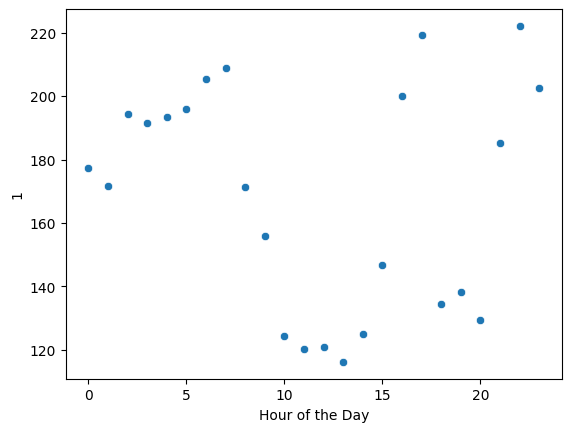

In [3]:
#Generate scatter plot of first column of points (day 1)

x = jan_data.index
y = jan_data.iloc[:, 0]

# Generate scatter plot
sns.scatterplot(x=x, y=y, data=jan_data)

# Show plot
plt.show()

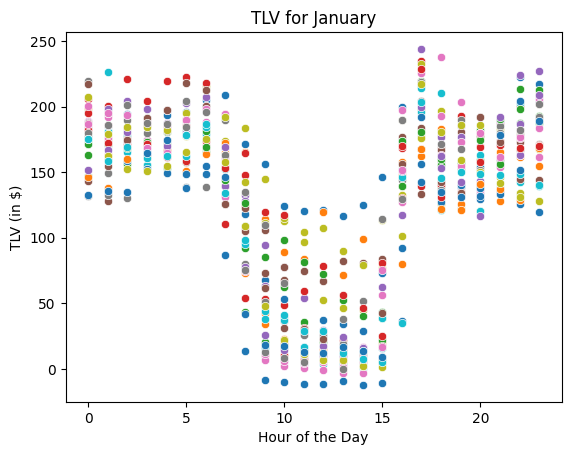

In [4]:
#Iterate across rows of January df to fill out scatter plot

for i in np.arange(1, jan_data.shape[1]+1):
    sns.scatterplot(x=jan_data.index, y=jan_data[i], data=jan_data)

plt.xlabel('Hour of the Day')
plt.ylabel('TLV (in $)')
plt.title('TLV for January')
plt.show()

#### Reformatting January data for regression purposes

In [5]:
jan_reg_data = jan_data.reset_index() #resetting index
jan_reg_data.head()

2,Hour of the Day,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,0,177.478436,186.590149,163.130485,205.813273,183.654301,142.950007,189.220797,131.728751,179.528021,...,146.284715,171.666910,195.121009,151.294090,216.931612,200.374696,179.862041,175.582862,175.182656,132.820804
1,1,171.730800,162.926774,159.087839,200.314868,193.890616,128.104025,191.760397,132.586752,173.652539,...,137.638157,171.653404,172.048585,166.748393,154.565310,195.057764,185.692403,162.156991,158.486559,135.335344
2,2,194.218931,176.548003,156.096226,220.599234,204.466608,183.951102,179.164417,130.327056,174.919317,...,159.898448,168.018039,171.227015,173.604681,174.623426,193.759602,200.777557,152.513504,168.976863,135.212569
3,3,191.388264,169.326314,155.615547,204.216241,197.810023,186.023749,188.471304,165.026129,161.797237,...,160.392606,172.586134,171.147551,168.110040,190.964730,168.372278,187.236431,150.566127,160.483108,164.854253
4,4,193.275623,171.871338,153.249343,219.076831,197.689883,171.224081,184.116422,171.148010,163.079664,...,167.017282,170.587763,165.990832,169.955488,197.548212,164.519542,186.711966,154.910572,162.558297,174.586383


In [6]:
# Melted Dataset for January
jan_temporal_melted = pd.melt(jan_reg_data, id_vars=['Hour of the Day'], var_name='1', value_name='Value')
jan_temporal_melted.head()

,Hour of the Day,1,Value
0,0,1,177.478436
1,1,1,171.730800
2,2,1,194.218931
3,3,1,191.388264
4,4,1,193.275623


---

#### MSE Regression


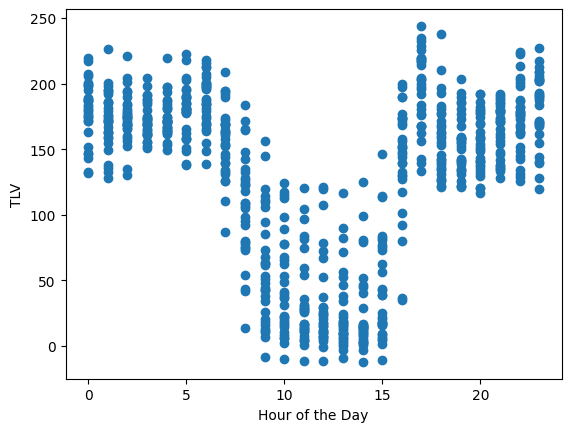

In [7]:
x = jan_temporal_melted["Hour of the Day"]
y = jan_temporal_melted["Value"]

plt.scatter(x,y)
plt.xlabel('Hour of the Day')
plt.ylabel('TLV')

# Show the plot
plt.show()

In [8]:
# Augmenting X matrix
x_matrix = []
for i in x:
    x_matrix.append([1, i])

x_matrix = np.array(x_matrix)
x_matrix

array([[ 1,  0],
       [ 1,  1],
       [ 1,  2],
       ...,
       [ 1, 21],
       [ 1, 22],
       [ 1, 23]], shape=(744, 2))

In [9]:
# Finding optimal linear weights
w = np.linalg.solve(x_matrix.T @ x_matrix, x_matrix.T @ y)

#w[0]: intercept, w[1]: slope
print("intercept = w[0]:", w[0])
print("slope = w[1]:", w[1])

intercept = w[0]: 137.19976844995642
slope = w[1]: -0.7320791490613131


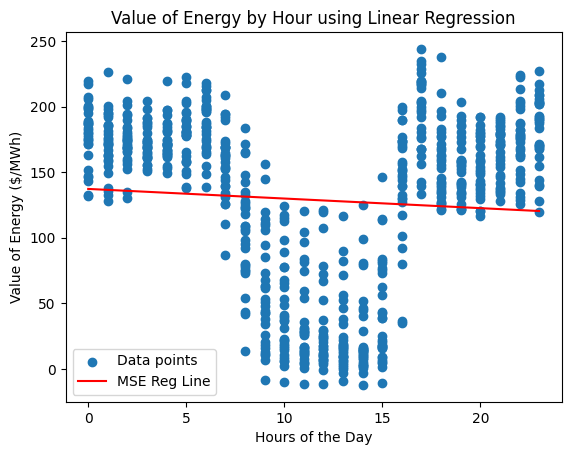

In [10]:
# Setting Plot Type
plt.scatter(x, y, label='Data points')

# Labels and title
plt.xlabel('Hours of the Day')
plt.ylabel('Value of Energy ($/MWh)')
plt.title('Value of Energy by Hour using Linear Regression')

# Plot regression line
reg_line = w[1] * x + w[0]
plt.plot(x, reg_line, color='red', label=f'MSE Reg Line')

# Show the plot
plt.legend()
plt.show()

In [12]:
# MSE Risk
y_true = y
y_pred = x_matrix @ w
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
print("RMSE using linear regression:", rmse) #Bad MSE, very large

RMSE using linear regression: 67.08551500848233


In [13]:
# MSE per month per regression type dataframe
months = [
    "January", "February", "March", "April", "May", "June",
    "July", "August", "September", "October", "November", "December"
]

reg_types = [
    "Linear", "KNN", "Linear+Cluster","Gaussian Basis"
]

reg_errors = pd.DataFrame(index=months, columns=reg_types)
reg_errors.loc['January','Linear'] = rmse
reg_errors

,Linear,KNN,Linear+Cluster,Gaussian Basis
January,67.085515,NaN,NaN,NaN
February,NaN,NaN,NaN,NaN
March,NaN,NaN,NaN,NaN
April,NaN,NaN,NaN,NaN
May,NaN,NaN,NaN,NaN
June,NaN,NaN,NaN,NaN
July,NaN,NaN,NaN,NaN
August,NaN,NaN,NaN,NaN
September,NaN,NaN,NaN,NaN
October,NaN,NaN,NaN,NaN


---

#### KNN Regression

In [14]:
def knn_predict(X_train, y_train, x, k=1):
    predictions = []
    
    for x in X_test:
        # Calculate distances between the test point and all training points
        distances = np.linalg.norm(X_train - x, axis=1)
        # Find the indices of the k nearest neighbors
        nearest_neighbors = np.argpartition(distances, k, axis=0)[:k]
        # Average the target values of the k nearest neighbors
        prediction = np.mean(y_train[nearest_neighbors])
        predictions.append(prediction)
    
    return np.array(predictions)

In [15]:
# Splitting data into test and training data
X_train, X_test, y_train, y_test = train_test_split(x_matrix, y, test_size=0.2, random_state=42)
X_train, X_test, y_train, y_test

k = round(np.sqrt(len(x_matrix))) #letting k = square root of n
y_train = np.array(y_train)
y_pred = knn_predict(X_train, y_train, X_test, k=k) #KNN predictons for TLV
print("KNN TLV predictions:",y_pred)

KNN TLV predictions: [ 60.57484496  38.28838998 174.04065381  31.93380981 181.30423595
  60.57484496 158.35900525 141.1452813  158.35900525 195.93488756
  31.93380981 156.31800453  38.28838998 176.74356978 174.04065381
 174.04065381  33.1501766   44.22492302 162.53999446 171.39994783
  44.26986273  25.51076581  44.22492302  31.93380981  25.51076581
 155.67321528  44.26986273 162.53999446 171.84425906 170.98739037
 172.90943826 181.30423595 176.74356978 174.04065381 176.74356978
  33.1501766  176.52768118 176.52768118  38.28838998 176.52768118
  60.57484496 158.35900525 170.98739037 171.84425906 181.30423595
 195.93488756 171.84425906 162.53999446  44.22492302  38.28838998
 165.72866072 176.52768118 155.67321528 156.31800453  60.57484496
 176.74356978 176.74356978 181.30423595 180.44240101 181.30423595
  31.93380981  31.93380981 165.72866072 171.39994783  38.28838998
 180.44240101 176.52768118 172.90943826 165.72866072 172.90943826
  60.57484496 158.35900525 176.52768118 176.52768118 15

MSE for KNN: 29.33205096336211


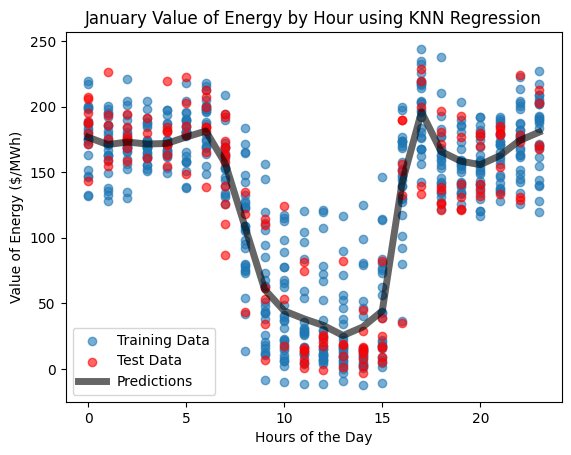

In [16]:
# Evaluate the model
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
reg_errors.loc['January','KNN'] = rmse
print(f"MSE for KNN: {rmse}") # Much lower than MSE regression!

# Sort the test data and corresponding predictions for smooth plotting
sorted_indices = np.argsort(X_test[:,1].flatten())
X_test_sorted = X_test[:,1].flatten()[sorted_indices]
y_pred_sorted = y_pred[sorted_indices]

# Training Data
plt.scatter(X_train[:,1], y_train, label="Training Data", alpha=0.6)
# Testing Data
plt.scatter(X_test[:,1], y_test, label="Test Data", color="red", alpha=0.6)
# Predicted regression
plt.plot(X_test_sorted, y_pred_sorted, label="Predictions", color="black", alpha=0.6, linewidth = 5)

# Plot settings
plt.legend()
plt.xlabel("Hours of the Day")
plt.ylabel("Value of Energy ($/MWh)")
plt.title("January Value of Energy by Hour using KNN Regression")
plt.show()

---

#### K-Means Clustering and then Using Linear Regression on each cluster

In [17]:
jan_temporal_melted

,Hour of the Day,1,Value
0,0,1,177.478436
1,1,1,171.730800
2,2,1,194.218931
3,3,1,191.388264
4,4,1,193.275623
...,...,...,...
739,19,31,131.084626
740,20,31,132.119519
741,21,31,178.246433
742,22,31,151.426078


In [18]:
# automatically clustering values

def create_clusters(melted_temporal_df, k=3):
    # Takes in a melted temporal df and desired number of clusters
    # Outputs a copy of the melted temporal df with the addition of a new cluster column and the scaled and unscaled centroids
    
    df = melted_temporal_df.copy()

    # Step 1: Cluster based only on 'Value'
    kmeans = KMeans(n_clusters=k, random_state=42)
    df['Initial Cluster'] = kmeans.fit_predict(df[['Value']])

    # Step 2: Bin time (x-axis) into k vertical regions
    df['Hour Bin'] = pd.cut(df['Hour of the Day'], bins=k, labels=False)

    # Step 3: Assign a **unique final cluster** label to each time bin
    df['Cluster'] = df['Hour Bin']  # directly use hour bins as cluster labels

    # Step 4: Compute unscaled centroids (mean of Hour and Value per Final Cluster)
    centroids = (
        df.groupby('Cluster')[['Hour of the Day', 'Value']]
        .mean()
        .reset_index()
        .values
    )

    return df, centroids

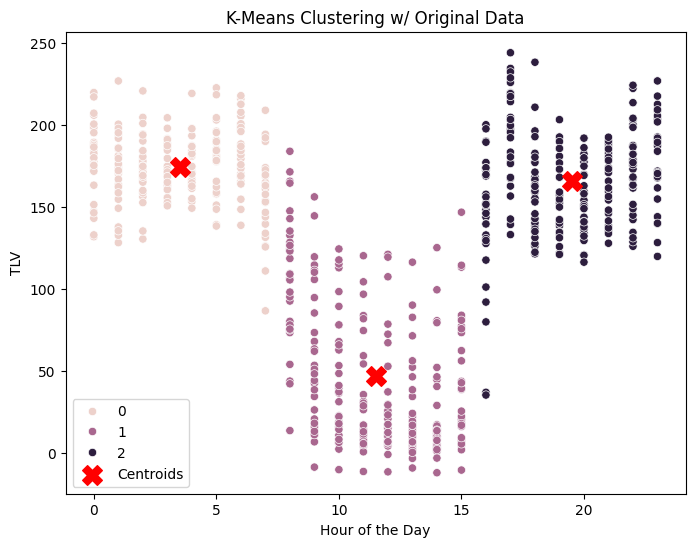

In [19]:
def create_cluster_scatterplots(melted_temporal_df, create_clusters):
    # Takes in a melted temporal dataframe and the create_clusters function
    # Outputs two scatterplots, one scaled and one unscaled, with data grouped into clusters and centroids identified

    clusters = create_clusters(melted_temporal_df)

    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=melted_temporal_df['Hour of the Day'], y=melted_temporal_df['Value'], hue=clusters[0]['Cluster'])
    plt.scatter(clusters[1][:, 1], clusters[1][:, 2], color='red', marker='X', s=200, label='Centroids')
    plt.title('K-Means Clustering w/ Original Data')
    plt.ylabel('TLV')
    plt.legend()
    plt.show()

create_cluster_scatterplots(jan_temporal_melted, create_clusters)

##### Automating the Linear Regression Process for clusters 0,1,2

In [20]:
jan_temporal_melted = create_clusters(jan_temporal_melted)[0]
jan_temporal_melted

,Hour of the Day,1,Value,Initial Cluster,Hour Bin,Cluster
0,0,1,177.478436,1,0,0
1,1,1,171.730800,1,0,0
2,2,1,194.218931,1,0,0
3,3,1,191.388264,1,0,0
4,4,1,193.275623,1,0,0
...,...,...,...,...,...,...
739,19,31,131.084626,2,2,2
740,20,31,132.119519,2,2,2
741,21,31,178.246433,1,2,2
742,22,31,151.426078,2,2,2


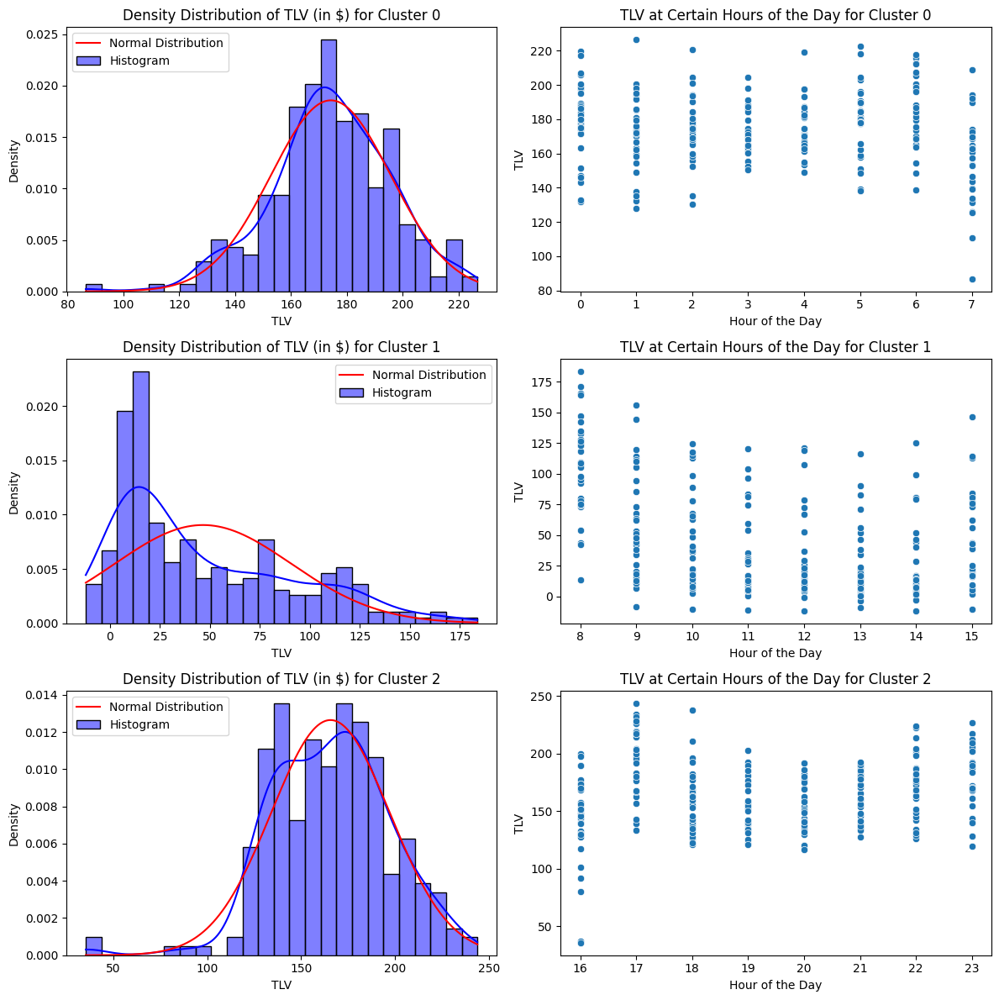

In [21]:
def analyze_cluster_dist(cluster_data):
    # Takes in a melted temporal dataframe with a column for data clusters
    # Outputs a grid of the scatterplot and histogram distribution for each cluster
    fig, axs = plt.subplots(3, 2, figsize=(12, 12))
    
    # For Loop to plot in the grid
    for i in np.unique(cluster_data['Cluster']):
        # Histogram to look at data distribution
        cluster = cluster_data[cluster_data['Cluster'] == i]
        x = cluster["Hour of the Day"]
        y = cluster["Value"]
    
        # Histogram Plot
        sns.histplot(y, kde=True, bins=25, color='blue', stat='density', label='Histogram', ax=axs[i, 0])
    
        # Normal Distribution Plot in Comparison
        y_mean = np.mean(y)
        y_std = np.std(y, ddof=1)
        x_norm = np.linspace(min(y), max(y), 1000)
        y_norm = norm.pdf(x_norm, y_mean, y_std)
        
        axs[i, 0].plot(x_norm, y_norm, color='red', label='Normal Distribution')
        axs[i, 0].set_title(f'Density Distribution of TLV (in $) for Cluster {i}')
        axs[i, 0].set_xlabel('TLV')
        axs[i, 0].legend()
    
        # Scatter Plot
        sns.scatterplot(x=x, y=y, ax=axs[i, 1])
        axs[i, 1].set_title(f'TLV at Certain Hours of the Day for Cluster {i}')
        axs[i, 1].set_ylabel('TLV')
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    
    # Show the plots
    plt.show()


analyze_cluster_dist(jan_temporal_melted)

Functions that automatically output dictionaries for the MSE weights for each cluster as well as the empirical risk with respect to square loss


In [22]:
def compute_MSE_weights(cluster_data):
    # Takes in a melted temporal dataframe with a column for data clusters
    # Outputs a dictionary with each key being a unique cluster in the data and each value an array of weights for weight vector
    
    weights_dict = {}
    for i in np.unique(cluster_data['Cluster']):
        
        cluster = cluster_data[cluster_data['Cluster'] == i]

        x = cluster["Hour of the Day"]
        y = cluster["Value"]
        
        #Augmenting X
        x_matrix = []
        for j in x:
            x_matrix.append([1, j])
        x_matrix = np.array(x_matrix)
        
        w = np.linalg.solve(x_matrix.T @ x_matrix, x_matrix.T @ y)

        weights_dict[i] = w

    return weights_dict
    
# Calculating risk wrt square loss
def compute_square_risk(cluster_data, compute_MSE_weights):
    """
    Computes the overall mean squared error (MSE) across all clusters.

    Args:
        cluster_data: melted dataframe with 'Cluster', 'Hour of the Day', and 'Value'
        compute_MSE_weights: function that returns a dict of cluster weights

    Returns:
        A single float representing the overall MSE across all clusters.
    """
    weights_dict = compute_MSE_weights(cluster_data)

    all_errors = []
    all_counts = 0

    for i in np.unique(cluster_data['Cluster']):
        cluster = cluster_data[cluster_data['Cluster'] == i]
        w = np.array(weights_dict[i])

        x = np.array(cluster["Hour of the Day"])
        y = np.array(cluster["Value"])
        x_matrix = np.column_stack((np.ones_like(x), x))

        preds = x_matrix @ w
        squared_errors = (preds - y) ** 2

        all_errors.extend(squared_errors)
        all_counts += len(y)

    total_mse = np.sum(all_errors) / all_counts
    return np.sqrt(total_mse)


print("cluster weights: ", compute_MSE_weights(jan_temporal_melted)) 
print("cluster mean square loss risk: ", compute_square_risk(jan_temporal_melted, compute_MSE_weights))

cluster weights:  {np.int64(0): array([177.37488002,  -0.90058509]), np.int64(1): array([140.28336766,  -8.15388129]), np.int64(2): array([123.87916326,   2.13983828])}
cluster mean square loss risk:  31.686737448616796


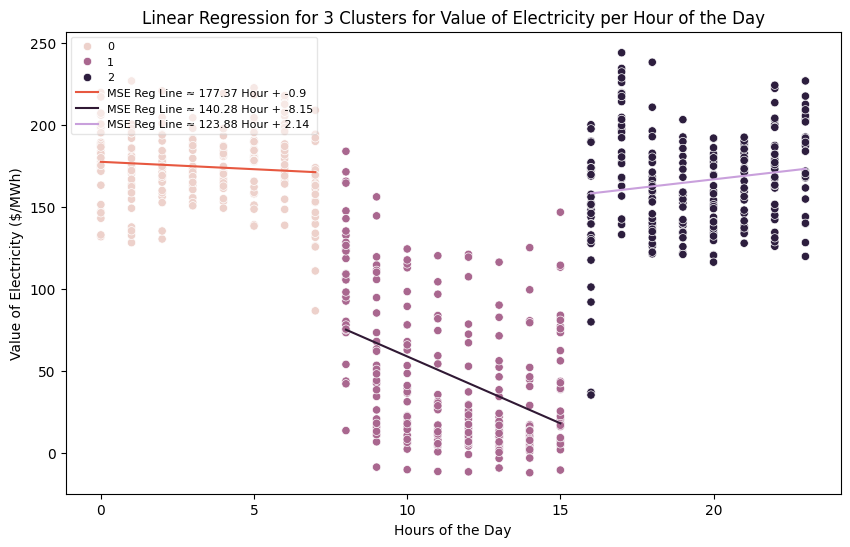

In [23]:
def cluster_MSE_reg_graphs(cluster_data, compute_MSE_weights):
    plt.figure(figsize=(10, 6))
    x = cluster_data['Hour of the Day']
    y = cluster_data['Value']
    
    sns.scatterplot(x=x, y=y,  hue=cluster_data['Cluster'])

    # Labels and title
    plt.xlabel('Hours of the Day')
    plt.ylabel('Value of Electricity ($/MWh)')
    plt.title('Linear Regression for 3 Clusters for Value of Electricity per Hour of the Day')

    w = compute_MSE_weights(cluster_data)
    colors = ['#e75840', '#301934', '#c9a0dc', 'purple', 'orange', 'brown', 'pink', 'gray', 'olive', 'cyan']


    for i, color in zip(np.unique(cluster_data['Cluster']), colors):

        cluster = cluster_data[cluster_data['Cluster'] == i]

        # Plot regression line
        reg_x_min = cluster.sort_values(by="Hour of the Day", ascending=True).iloc[0]['Hour of the Day']
        reg_x_max = cluster.sort_values(by="Hour of the Day", ascending=False).iloc[0]['Hour of the Day']
        reg_x_range = np.linspace(reg_x_min, reg_x_max, 1000)
        reg_line = w[i][1] * reg_x_range + w[i][0]
        plt.plot(reg_x_range, reg_line, color=color, label=f'MSE Reg Line ≈ {np.round(w[i][0], 2)} Hour + {np.round(w[i][1], 2)}')
        
    # Show the plot
    plt.legend(loc='upper left', framealpha=0.5, fontsize=8)
    plt.show()

cluster_MSE_reg_graphs(jan_temporal_melted, compute_MSE_weights)

In [24]:
# Risk for this type of pricing scheme:
risk = compute_square_risk(jan_temporal_melted, compute_MSE_weights)
reg_errors.loc['January','Linear+Cluster'] = risk

print("empirical risk: ", risk)

empirical risk:  31.686737448616796


##### Conclusion:

MSE for linear regression of 3 clusters ($\sim 27.11$) is much lower than linear regression for the entire data set ($\sim 67.09$) and KNN ($\sim 29.33$)

---

#### Applying Gausian Basis Functions on January Data

In [25]:
def gaussian_weights(x, y, mu, sigma = 1):
    #Given x, y, and mu, generates optimal weight vector
    
    Phi = np.zeros((len(x), len(mu))) # Create matrix of 0's

    # For each x, generates a vector of Gaussian mappings and inputs in respective spot in Phi
    for i in range(len(x)):
        for j in range(len(mu)):
            Phi[i,j] = np.exp(-((x[i] - mu[j]) ** 2) / (sigma ** 2))

    # Finds optimal weight vector
    w = np.linalg.solve(Phi.T @ Phi, Phi.T @ y)
        
    return w

In [26]:
# Parameters
mu = np.linspace(0, 23, 10) # Uses 10 mu's equally spaced out
sigma = (max(x) - min(x)) / 10 #using (max(x) - min(x))/(# of basis functions) for sigma


w = gaussian_weights(x, y, mu, sigma) #Optimal weight vectors given x and y in dataset

print("sigma: ", sigma)
print("weight vector: ", w)

sigma:  2.3
weight vector:  [151.54094483  78.5893422  144.06698631  73.21560299  19.22444729
   1.29568029  39.06405936 156.33168053  51.30663826 167.80128317]


In [27]:
def plot_h(x, mu, w, sigma = 2):
    # Creates a line from specified x values with the predicted H(x) values
     #generates array of x values
    H = 0

    #computes H(x) for each x
    for i in range(len(w)):
        H += w[i] * (np.exp(-((x - mu[i]) ** 2) / (sigma ** 2)))
    
    return H 

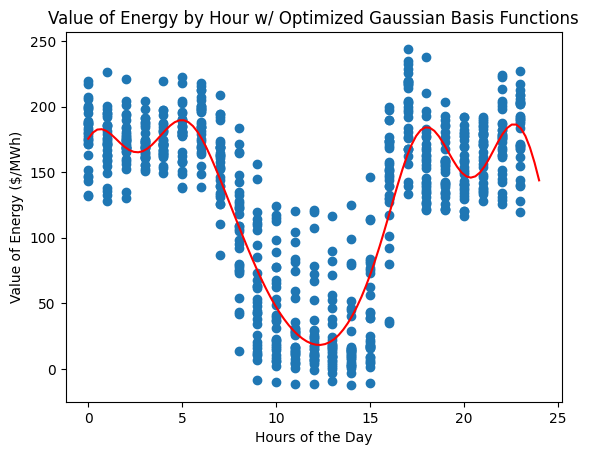

In [28]:
# Plotting H(x) prediction line on data
x_reg = np.linspace(0, 24, 100)
H= plot_h(x_reg, mu, w, sigma)

plt.plot(x_reg, H, color="red")
plt.scatter(x, y)

# Add labels and legend
plt.xlabel('Hours of the Day')
plt.ylabel('Value of Energy ($/MWh)')
plt.title('Value of Energy by Hour w/ Optimized Gaussian Basis Functions')
plt.show()


In [29]:
# Calculating Risk
pred_y = H= plot_h(x, mu, w, sigma)
risk = np.sqrt(mean_squared_error(y, H))
reg_errors.loc['January','Gaussian Basis'] = risk

print("risk w.r.t. MSE: ", risk)

risk w.r.t. MSE:  31.911611163367805


#### Cluster + Linear + Gaussian

In [30]:
def load_dataset(month, year):
    month_data = pd.read_csv(str(year) + " Pivot Data Tables/" + month + " TLV Pivot.csv")
    month_data = month_data.set_index('Hour of the Day')
    month_data.columns = month_data.columns.astype(int)
    month_data.index = month_data.index.astype(int)
    month_data = month_data.astype(float)

    month_temporal_melted = pd.melt(month_data.reset_index(), id_vars=['Hour of the Day'], var_name='1', value_name='Value')
    x = month_temporal_melted["Hour of the Day"]
    y = month_temporal_melted["Value"]
    
    return x, y, month_data, month_temporal_melted

In [31]:
def linear_cluster_gaussian (month, year):
    melted_df = load_dataset(month, year)[3]
    nonpeak_df = melted_df[(melted_df['Hour of the Day'] < 15)]
    peak_df = melted_df[(melted_df['Hour of the Day'] >=  15) & (melted_df['Hour of the Day'] <= 20)]
    fourth_cluster_df = melted_df[(melted_df['Hour of the Day'] >  20)]
    
    nonpeak_clustered = create_clusters(nonpeak_df, k = 2)[0]
    nonpeak_clustered_centroids = create_clusters(nonpeak_df, k = 2)[1]
    
    peak_clustered = create_clusters(peak_df, k = 1)[0]
    peak_clustered_centroids = create_clusters(peak_df, k = 1)[1]
    peak_clustered['Cluster'] = 3
    
    fourth_clustered = create_clusters(fourth_cluster_df, k = 1)[0]
    fourth_clustered_centroids = create_clusters(fourth_cluster_df, k = 1)[1]
    fourth_clustered['Cluster'] = 2
    
    centroids = combined = np.concatenate((nonpeak_clustered_centroids, peak_clustered_centroids, fourth_clustered_centroids))
    
    clustered = pd.concat([nonpeak_clustered, peak_clustered, fourth_clustered], ignore_index=True)
    
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=clustered['Hour of the Day'], y=clustered['Value'], hue=clustered['Cluster'])
    plt.scatter(centroids[:, 1], centroids[:, 2], color='red', marker='X', s=200, label='Centroids')
    plt.title('K-Means Clustering w/ Original Data')
    plt.ylabel('TLV')
    plt.legend()
    plt.show()
    
    peak_x = np.array(peak_df['Hour of the Day'])
    peak_y = np.array(peak_df['Value'])
    
    peak_n = 4
    peak_mu = np.linspace(min(peak_x), max(peak_x), peak_n)
    peak_sigma = (max(peak_x) - min(peak_x)) / peak_n
    
    peak_w = gaussian_weights(peak_x, peak_y, peak_mu, peak_sigma) #Optimal weight vectors given x and y in dataset
    
    print("sigma: ", peak_sigma)
    print("weight vector: ", peak_w)
    
    # Plotting H(x) prediction line on data
    x_reg = np.linspace(15, 20, len(peak_x))
    H= plot_h(x_reg, peak_mu, peak_w, peak_sigma)
    
    plt.plot(x_reg, H, color="red")
    plt.scatter(peak_x, peak_y)
    
    # Add labels and legend
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('TLV by Hour Using Gaussian Basis Functions with Optimized Weights')
    plt.show()
    
    plt.figure(figsize=(10, 6))
    nonpeak_x = nonpeak_clustered['Hour of the Day']
    nonpeak_y = nonpeak_clustered['Value']
    
    fourth_x = fourth_clustered['Hour of the Day']
    fourth_y = fourth_clustered['Value']
    
    sns.scatterplot(x=nonpeak_x, y=nonpeak_y,  hue=nonpeak_clustered['Cluster'])
    sns.scatterplot(x=fourth_x, y=fourth_y,  hue=fourth_clustered['Cluster'])
    
    
    # Labels and title
    plt.xlabel('Hours of the Day')
    plt.ylabel('Value of Electricity ($/MWh)')
    plt.title('Hybrid Regression (Linear + Gaussian) for Value of Electricity per Hour of Day w/ 4 Clusters')
    
    nonpeak_4_clustered = pd.concat([nonpeak_clustered,fourth_clustered])
    
    w = compute_MSE_weights(nonpeak_4_clustered)
    colors = ['blue', '#cc5500', '#d90166', 'purple', 'orange', 'brown', 'pink', 'gray', 'olive', 'cyan']
    
        
    for i, color in zip(np.unique(nonpeak_4_clustered['Cluster']), colors):
    
        cluster = nonpeak_4_clustered[nonpeak_4_clustered['Cluster'] == i]
            
        reg_x_min = cluster.sort_values(by="Hour of the Day", ascending=True).iloc[0]['Hour of the Day']
        reg_x_max = cluster.sort_values(by="Hour of the Day", ascending=False).iloc[0]['Hour of the Day']
        reg_x_range = np.linspace(reg_x_min, reg_x_max, 1000)
        reg_line = w[i][1] * reg_x_range + w[i][0]
        plt.plot(reg_x_range, reg_line, color=color, label=f'MSE Reg Line ≈ {np.round(w[i][0], 2)} Hour + {np.round(w[i][1], 2)}')
    
    peak_x = peak_clustered['Hour of the Day']
    peak_y = peak_clustered['Value']
    
    plt.plot(x_reg, H, color="#006400", label="Gaussian Regression Line")
    plt.scatter(peak_x, peak_y, color = "#90EE90")
    
    # Show the plot
    plt.legend(loc='upper left', framealpha=0.5, fontsize=8)
    plt.show()
    
    #Calculating RMSE
    weights_dict = compute_MSE_weights(nonpeak_4_clustered)
    
    actual_values = []
    pred_values = []
    
    for i in np.unique(nonpeak_4_clustered['Cluster']):
        cluster = nonpeak_4_clustered[nonpeak_4_clustered['Cluster'] == i]
        w = np.array(weights_dict[i])
    
        x = np.array(cluster["Hour of the Day"])
        y = np.array(cluster["Value"])  # get actual values as array
    
        # Augmenting X with bias term
        x_matrix = np.column_stack((np.ones_like(x), x))
    
        # Store actual and predicted values
        actual_values.extend(y)
        pred_values.extend(x_matrix @ w)  # vectorized prediction
    
    nonpeak_values = pd.DataFrame({'Pred Values': pred_values, 'Actual Values': actual_values})
    
    pred_peak_y = plot_h(peak_x, peak_mu, peak_w, peak_sigma)
    peak_values = pd.DataFrame({'Pred Values': pred_peak_y, 'Actual Values': peak_y})
    
    values = pd.concat([nonpeak_values, peak_values], ignore_index=True)
    print('RMSE: ', np.sqrt(mean_squared_error(values['Pred Values'], values['Actual Values'])))
    return np.sqrt(mean_squared_error(values['Pred Values'], values['Actual Values']))
              
    

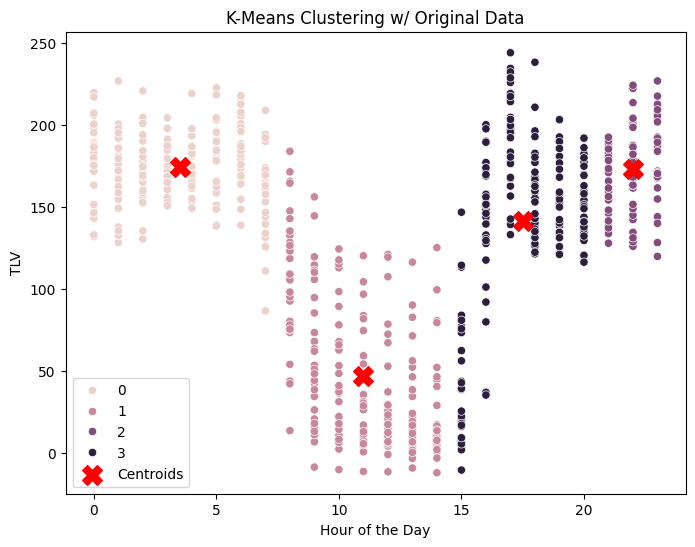

sigma:  1.25
weight vector:  [ 14.03215607 174.71646098  98.26398476 139.31686348]


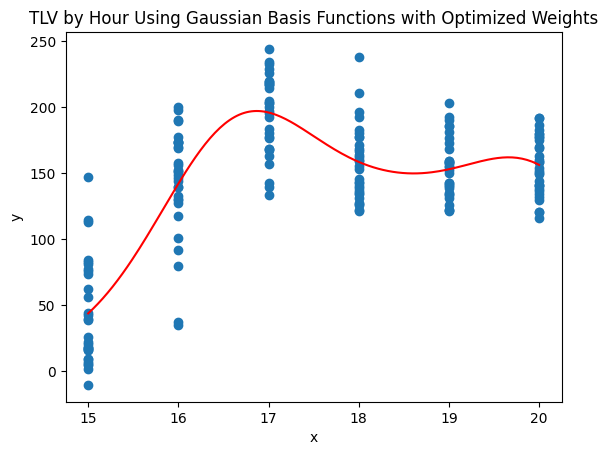

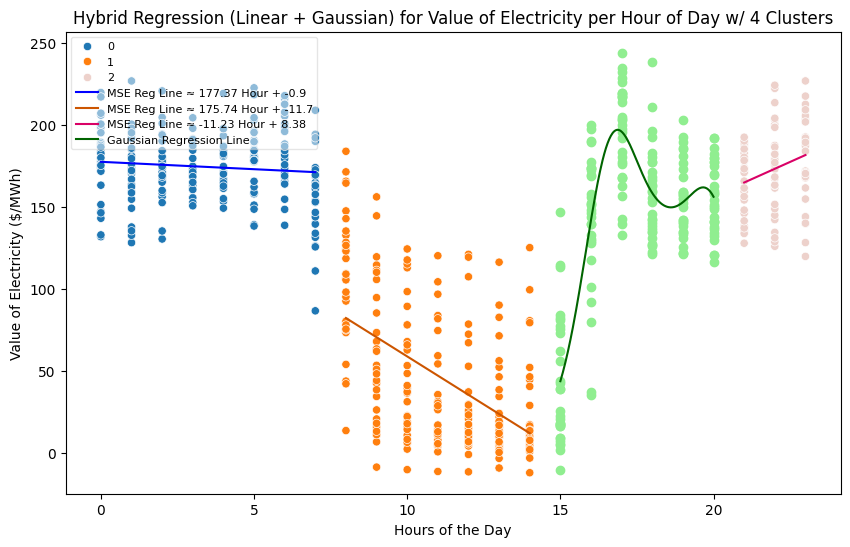

RMSE:  29.793676445103117


In [32]:
reg_errors.loc['January', 'Linear+Gaussian+Cluster '] = linear_cluster_gaussian('January', 2024)

In [33]:
reg_errors

,Linear,KNN,Linear+Cluster,Gaussian Basis,Linear+Gaussian+Cluster
January,67.085515,29.332051,31.686737,31.911611,29.793676
February,NaN,NaN,NaN,NaN,NaN
March,NaN,NaN,NaN,NaN,NaN
April,NaN,NaN,NaN,NaN,NaN
May,NaN,NaN,NaN,NaN,NaN
June,NaN,NaN,NaN,NaN,NaN
July,NaN,NaN,NaN,NaN,NaN
August,NaN,NaN,NaN,NaN,NaN
September,NaN,NaN,NaN,NaN,NaN
October,NaN,NaN,NaN,NaN,NaN


### May

In [34]:
#Data set
may_data = pd.read_csv("2024 Pivot Data Tables/May TLV Pivot.csv")
may_data.rename(columns={"Unnamed: 0":'Hour of the Day'}, inplace=True)
may_data = may_data.set_index('Hour of the Day')
may_data.columns = may_data.columns.astype(int)
may_data.index = may_data.index.astype(int)
may_data = may_data.astype(float)

may_data.head()

,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
Hour of the Day,,,,,,,,,,,,,,,,,,,,,
0,119.088092,158.216078,130.231793,189.348987,88.854500,59.708443,166.831324,172.223226,122.046041,113.969838,...,165.310467,134.485111,128.885640,54.998492,32.360881,35.323350,109.303468,162.241508,77.485929,97.064810
1,168.952278,165.747211,123.439714,169.518977,99.270736,67.488399,140.987044,160.873965,153.804840,155.563761,...,154.529793,141.694940,105.922398,47.140487,31.930439,100.773937,174.951992,164.795777,130.945941,95.035392
2,157.925397,158.036672,135.249340,157.961802,102.557551,77.102820,146.915794,148.529400,149.745614,154.824890,...,148.499146,148.913007,108.990920,43.525174,69.929473,168.240004,164.464471,150.623698,164.154409,84.377221
3,119.269720,163.265451,129.179192,143.384840,97.222134,72.156949,152.299265,160.746827,152.545917,153.630948,...,144.451612,132.280789,115.807170,68.146980,69.523283,155.074996,109.900553,91.640656,152.479803,92.889093
4,58.639004,111.790397,132.910069,123.848467,99.923828,81.180596,45.203595,143.194641,165.052669,151.874542,...,112.249621,138.691106,96.161724,67.120092,67.352073,27.822724,59.241636,59.256077,55.387194,72.191786


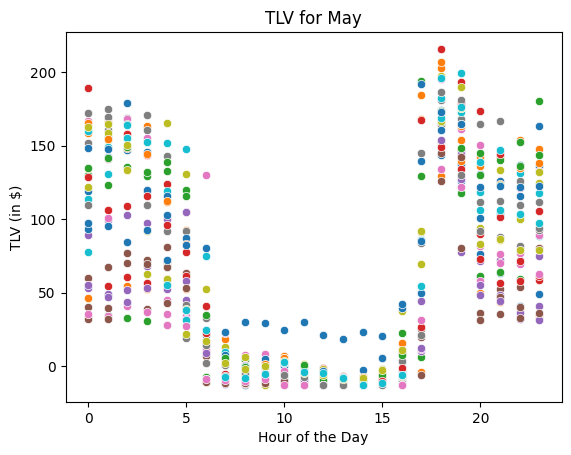

In [35]:
#Generate scatter plot of first column of points (day 1)

x = may_data.index
y = may_data.iloc[:, 0]

#Iterate across rows of May df to fill out scatter plot

for i in np.arange(1, may_data.shape[1]+1):
    sns.scatterplot(x=may_data.index, y=may_data[i], data=may_data)

plt.xlabel('Hour of the Day')
plt.ylabel('TLV (in $)')
plt.title('TLV for May')
plt.show()

In [36]:
# Melted Dataset for January
may_temporal_melted = pd.melt(may_data.reset_index(), id_vars=['Hour of the Day'], var_name='1', value_name='Value')
x = may_temporal_melted["Hour of the Day"]
y = may_temporal_melted["Value"]
may_temporal_melted.head()

,Hour of the Day,1,Value
0,0,1,119.088092
1,1,1,168.952278
2,2,1,157.925397
3,3,1,119.269720
4,4,1,58.639004


In [37]:
# Augmenting X matrix
x_matrix = []
for i in x:
    x_matrix.append([1, i])

x_matrix = np.array(x_matrix)

In [38]:
# Finding optimal linear weights
w = np.linalg.solve(x_matrix.T @ x_matrix, x_matrix.T @ y)

#w[0]: intercept, w[1]: slope
print("intercept = w[0]:", w[0])
print("slope = w[1]:", w[1])

intercept = w[0]: 48.747217641390904
slope = w[1]: 0.6153487786706493


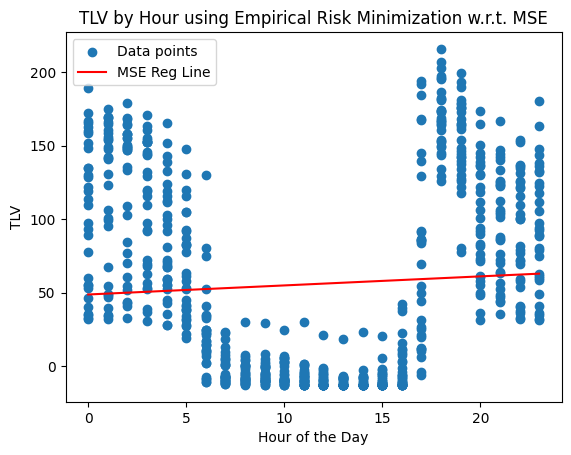

In [39]:
# Setting Plot Type
plt.scatter(x, y, label='Data points')

# Labels and title
plt.xlabel('Hour of the Day')
plt.ylabel('TLV')
plt.title('TLV by Hour using Empirical Risk Minimization w.r.t. MSE')

# Plot regression line
reg_line = w[1] * x + w[0]
plt.plot(x, reg_line, color='red', label=f'MSE Reg Line')

# Show the plot
plt.legend()
plt.show()

In [40]:
# MSE Risk
y_true = y
y_pred = x_matrix @ w
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
reg_errors.loc['May','Linear'] = rmse
print("MSE using linear regression:", rmse) #Bad MSE, very large
reg_errors

MSE using linear regression: 66.33920089628349


,Linear,KNN,Linear+Cluster,Gaussian Basis,Linear+Gaussian+Cluster
January,67.085515,29.332051,31.686737,31.911611,29.793676
February,NaN,NaN,NaN,NaN,NaN
March,NaN,NaN,NaN,NaN,NaN
April,NaN,NaN,NaN,NaN,NaN
May,66.339201,NaN,NaN,NaN,NaN
June,NaN,NaN,NaN,NaN,NaN
July,NaN,NaN,NaN,NaN,NaN
August,NaN,NaN,NaN,NaN,NaN
September,NaN,NaN,NaN,NaN,NaN
October,NaN,NaN,NaN,NaN,NaN


In [41]:
# Splitting data into test and training data
X_train, X_test, y_train, y_test = train_test_split(x_matrix, y, test_size=0.2, random_state=42)
X_train, X_test, y_train, y_test

k = round(np.sqrt(len(x_matrix))) #letting k = square root of n
y_train = np.array(y_train)
y_pred = knn_predict(X_train, y_train, X_test, k=k) #KNN predictons for TLV

RMSE for KNN: 34.452376151114116


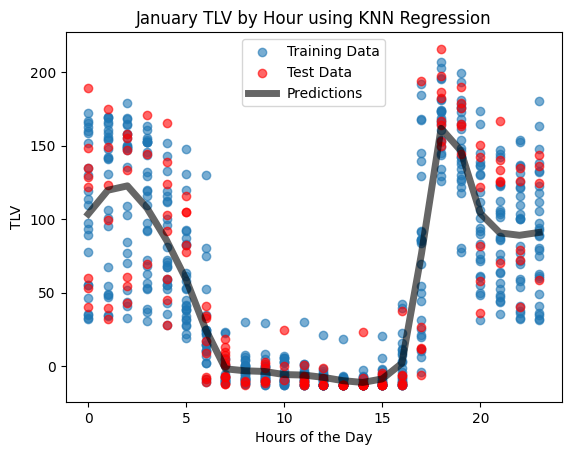

In [42]:
# Evaluate the model
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
reg_errors.loc['May','KNN'] = rmse
print(f"RMSE for KNN: {rmse}") # Much lower than MSE regression!

# Sort the test data and corresponding predictions for smooth plotting
sorted_indices = np.argsort(X_test[:,1].flatten())
X_test_sorted = X_test[:,1].flatten()[sorted_indices]
y_pred_sorted = y_pred[sorted_indices]

# Training Data
plt.scatter(X_train[:,1], y_train, label="Training Data", alpha=0.6)
# Testing Data
plt.scatter(X_test[:,1], y_test, label="Test Data", color="red", alpha=0.6)
# Predicted regression
plt.plot(X_test_sorted, y_pred_sorted, label="Predictions", color="black", alpha=0.6, linewidth = 5)

# Plot settings
plt.legend()
plt.xlabel("Hours of the Day")
plt.ylabel("TLV")
plt.title("January TLV by Hour using KNN Regression")
plt.show()

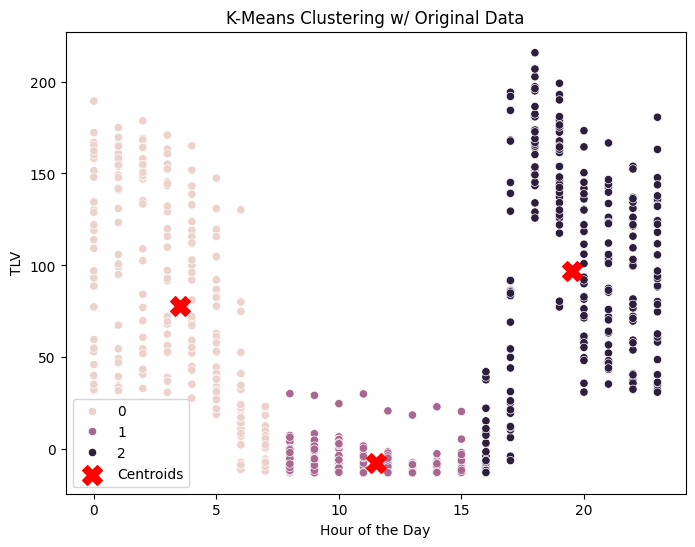

In [43]:
create_cluster_scatterplots(may_temporal_melted, create_clusters)

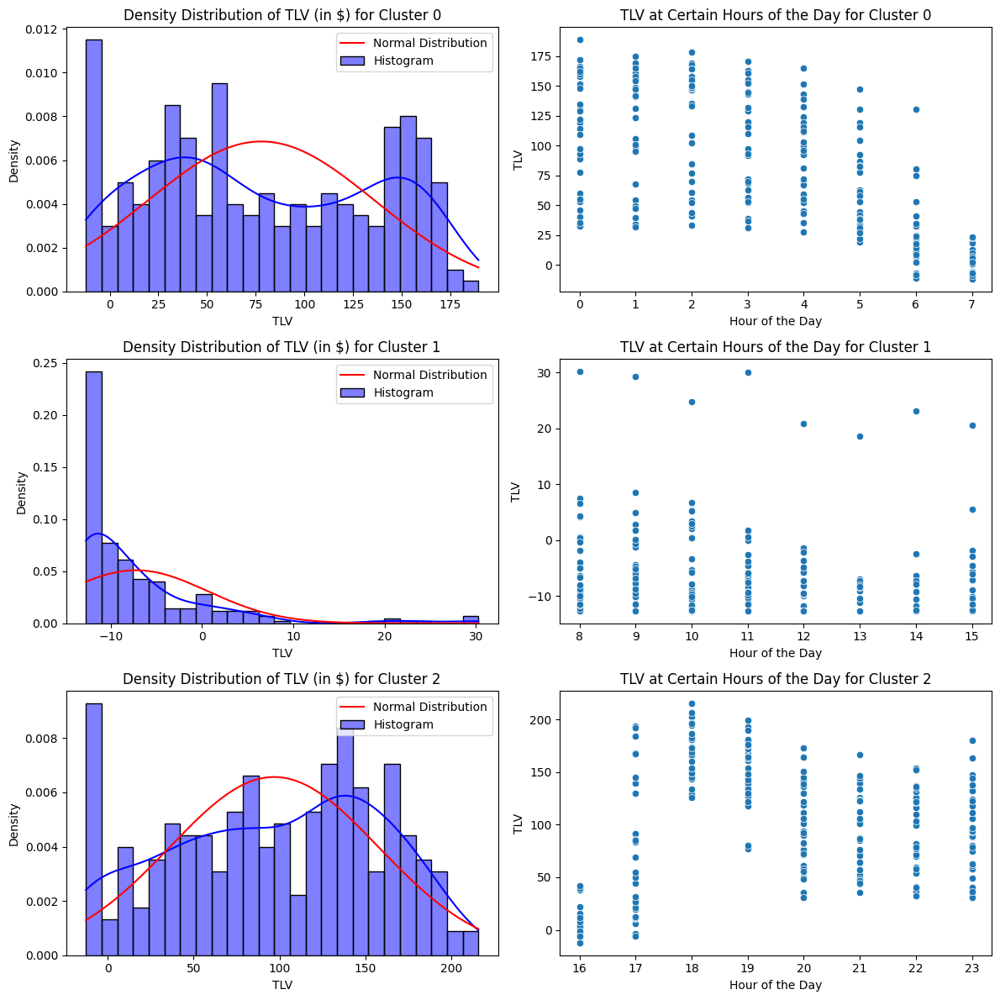

In [44]:
may_temporal_melted = create_clusters(may_temporal_melted)[0]
analyze_cluster_dist(may_temporal_melted)

Linear prediction not a good choice because errors for each cluster likely not normally distributed

cluster weights:  {np.int64(0): array([136.06524143, -16.63146897]), np.int64(1): array([ 3.91828003, -0.96905811]), np.int64(2): array([-10.73920303,   5.51698343])}
cluster square loss risk:  42.80600859851253


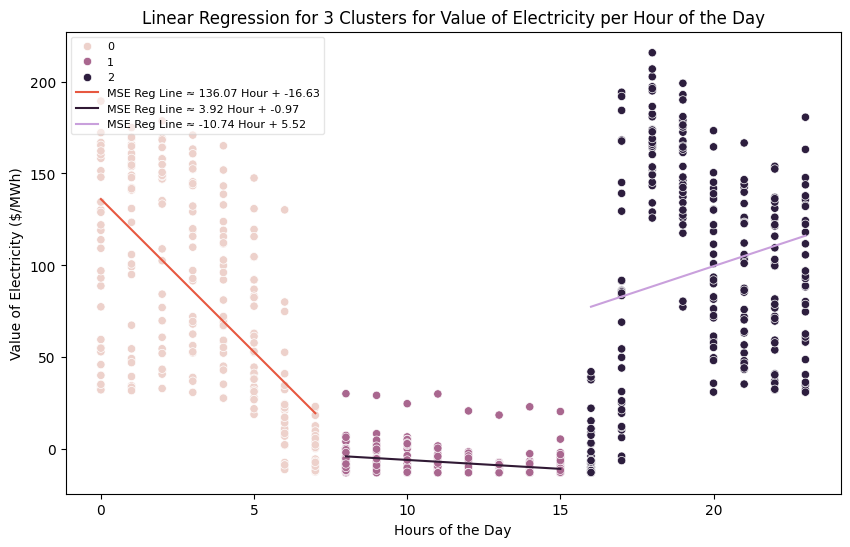

In [45]:
print("cluster weights: ", compute_MSE_weights(may_temporal_melted)) 
print("cluster square loss risk: ", compute_square_risk(may_temporal_melted, compute_MSE_weights))

cluster_MSE_reg_graphs(may_temporal_melted, compute_MSE_weights)

In [46]:
# Risk for this type of pricing scheme:
risk = compute_square_risk(may_temporal_melted, compute_MSE_weights)
reg_errors.loc['May','Linear+Cluster'] = risk
print("empirical risk: ", risk)

empirical risk:  42.80600859851253


Gaussian Basis Functions on May Data

In [47]:
# Parameters
mu = np.linspace(0, 23, 10) # Uses 10 mu's equally spaced out
sigma = (max(x) - min(x)) / 10 #using (max(x) - min(x))/(# of basis functions) for sigma


w = gaussian_weights(x, y, mu, sigma) #Optimal weight vectors given x and y in dataset

print("sigma: ", sigma)
print("weight vector: ", w)

sigma:  2.3
weight vector:  [ 77.23518249  84.63157667  31.90689521 -11.02459484  -9.47884327
  17.81974378 -65.98874639 152.64316744  33.30453827  80.14754366]


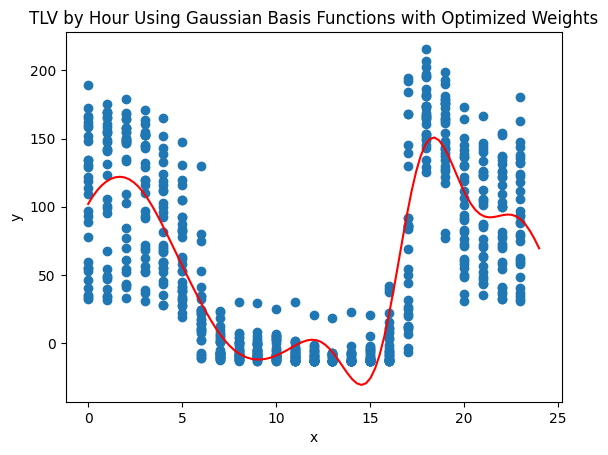

In [48]:
# Plotting H(x) prediction line on data
x_reg = np.linspace(0, 24, 100)
H= plot_h(x_reg, mu, w, sigma)

plt.plot(x_reg, H, color="red")
plt.scatter(x, y)

# Add labels and legend
plt.xlabel('x')
plt.ylabel('y')
plt.title('TLV by Hour Using Gaussian Basis Functions with Optimized Weights')
plt.show()


In [49]:
# Calculating Risk
pred_y = H= plot_h(x, mu, w, sigma)
risk = np.sqrt(mean_squared_error(y, H))
reg_errors.loc['May','Gaussian Basis'] = risk

print("risk w.r.t. MSE: ", risk)

risk w.r.t. MSE:  33.54114602807278


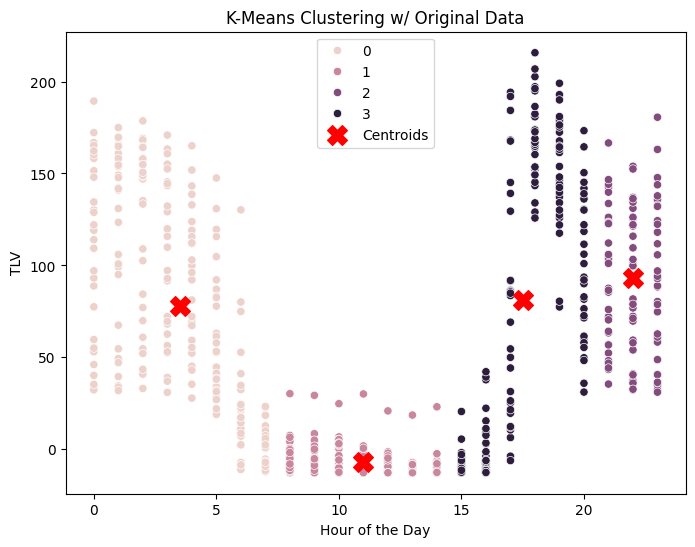

sigma:  1.25
weight vector:  [-16.69055857  18.29518305 164.92702751  67.14694778]


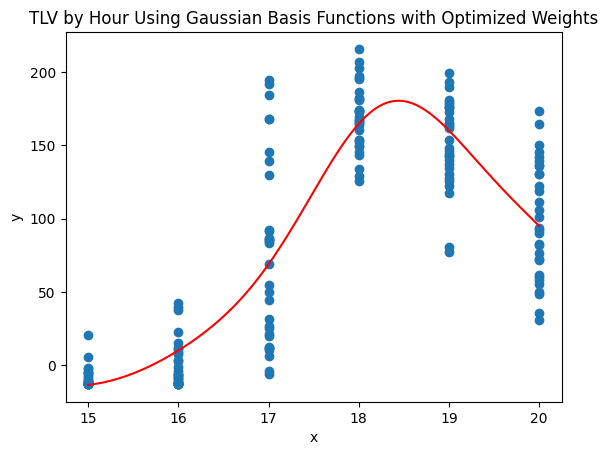

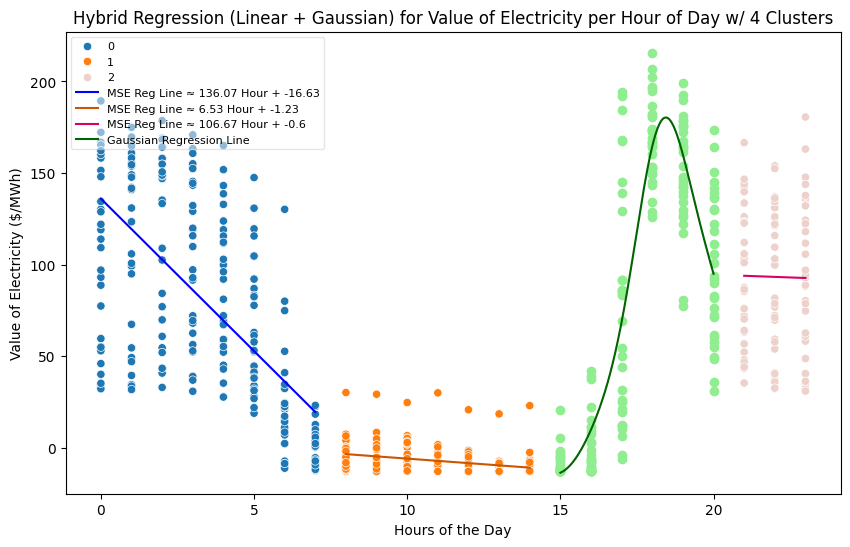

RMSE:  33.810213521753404


In [50]:
reg_errors.loc['May', 'Linear+Gaussian+Cluster '] = linear_cluster_gaussian('May', 2024)

In [51]:
reg_errors

,Linear,KNN,Linear+Cluster,Gaussian Basis,Linear+Gaussian+Cluster
January,67.085515,29.332051,31.686737,31.911611,29.793676
February,NaN,NaN,NaN,NaN,NaN
March,NaN,NaN,NaN,NaN,NaN
April,NaN,NaN,NaN,NaN,NaN
May,66.339201,34.452376,42.806009,33.541146,33.810214
June,NaN,NaN,NaN,NaN,NaN
July,NaN,NaN,NaN,NaN,NaN
August,NaN,NaN,NaN,NaN,NaN
September,NaN,NaN,NaN,NaN,NaN
October,NaN,NaN,NaN,NaN,NaN


---

### August 

In [52]:
#Data set
aug_data = pd.read_csv("2024 Pivot Data Tables/August TLV Pivot.csv")
aug_data = aug_data.set_index('Hour of the Day')
aug_data.columns = aug_data.columns.astype(int)
aug_data.index = aug_data.index.astype(int)
aug_data = aug_data.astype(float)

aug_data.head()

,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
Hour of the Day,,,,,,,,,,,,,,,,,,,,,
0,162.389999,186.035493,180.888394,156.533368,180.163220,209.419587,194.425500,191.070416,168.749420,149.696878,...,158.848065,210.729340,167.010359,155.710528,158.590576,179.870133,166.759849,190.418354,187.303779,273.084233
1,150.043174,154.448210,192.697958,156.489351,191.859030,193.003510,195.738038,197.365560,146.536435,159.378400,...,208.643018,201.609850,195.343923,172.493668,152.115864,171.390472,188.896268,171.450768,150.751295,266.785205
2,195.088979,188.584588,197.442926,179.196227,177.797435,190.148269,169.625873,185.273512,162.083003,191.856348,...,198.980253,193.815501,192.310783,163.794764,180.209883,180.125111,174.553763,183.250552,191.356630,261.744545
3,199.378064,195.258719,200.088788,180.436985,173.847635,186.900824,195.748018,177.961677,181.924926,184.280705,...,194.519731,192.819653,180.054841,153.147346,177.583200,169.645522,172.570388,178.227699,192.295837,257.278588
4,147.999420,161.202769,188.673417,181.988669,176.041974,184.813651,189.005917,189.253053,174.517992,161.868589,...,161.691995,136.868753,200.707105,153.937320,172.345252,161.583963,175.364552,189.214671,201.098173,253.646159


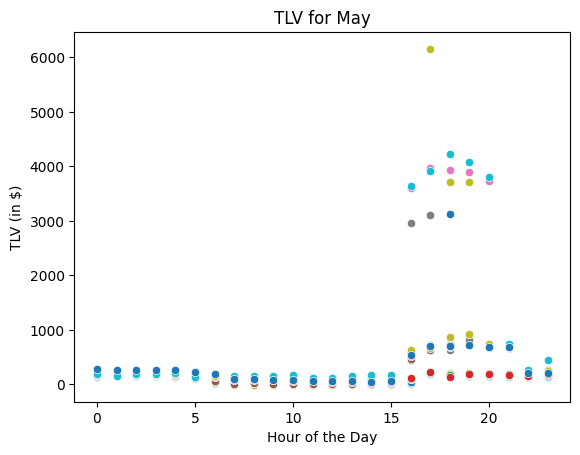

In [53]:
#Generate scatter plot of first column of points (day 1)

x = aug_data.index
y = aug_data.iloc[:, 0]

#Iterate across rows of May df to fill out scatter plot

for i in np.arange(1, aug_data.shape[1]+1):
    sns.scatterplot(x=aug_data.index, y=aug_data[i], data=aug_data)

plt.xlabel('Hour of the Day')
plt.ylabel('TLV (in $)')
plt.title('TLV for May')
plt.show()

In [54]:
# Melted Dataset for August
aug_temporal_melted = pd.melt(aug_data.reset_index(), id_vars=['Hour of the Day'], var_name='1', value_name='Value')
x = aug_temporal_melted["Hour of the Day"]
y = aug_temporal_melted["Value"]
aug_temporal_melted.head()

,Hour of the Day,1,Value
0,0,1,162.389999
1,1,1,150.043174
2,2,1,195.088979
3,3,1,199.378064
4,4,1,147.999420


In [55]:
# Augmenting X matrix
x_matrix = []
for i in x:
    x_matrix.append([1, i])

x_matrix = np.array(x_matrix)

In [56]:
# Finding optimal linear weights
w = np.linalg.solve(x_matrix.T @ x_matrix, x_matrix.T @ y)

#w[0]: intercept, w[1]: slope
print("intercept = w[0]:", w[0])
print("slope = w[1]:", w[1])

intercept = w[0]: 16.161522087873127
slope = w[1]: 24.206780239150486


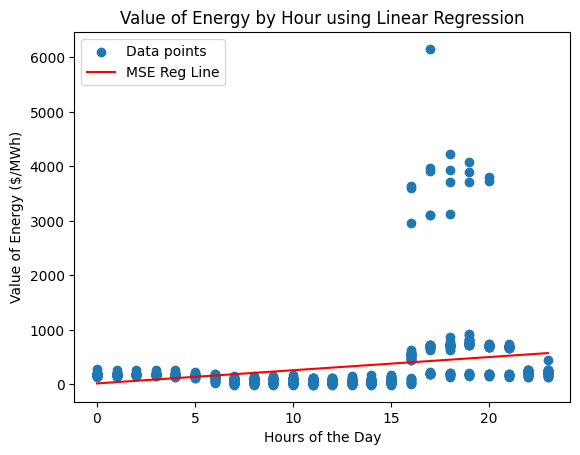

In [57]:
# Setting Plot Type
plt.scatter(x, y, label='Data points')

# Labels and title
plt.xlabel('Hours of the Day')
plt.ylabel('Value of Energy ($/MWh)')
plt.title('Value of Energy by Hour using Linear Regression')

# Plot regression line
reg_line = w[1] * x + w[0]
plt.plot(x, reg_line, color='red', label=f'MSE Reg Line')

# Show the plot
plt.legend()
plt.show()

In [58]:
# MSE Risk
y_true = y
y_pred = x_matrix @ w
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
reg_errors.loc['August','Linear'] = rmse
print("MSE using linear regression:", rmse) #Bad MSE, very large
reg_errors

MSE using linear regression: 564.5892013976014


,Linear,KNN,Linear+Cluster,Gaussian Basis,Linear+Gaussian+Cluster
January,67.085515,29.332051,31.686737,31.911611,29.793676
February,NaN,NaN,NaN,NaN,NaN
March,NaN,NaN,NaN,NaN,NaN
April,NaN,NaN,NaN,NaN,NaN
May,66.339201,34.452376,42.806009,33.541146,33.810214
June,NaN,NaN,NaN,NaN,NaN
July,NaN,NaN,NaN,NaN,NaN
August,564.589201,NaN,NaN,NaN,NaN
September,NaN,NaN,NaN,NaN,NaN
October,NaN,NaN,NaN,NaN,NaN


In [59]:
# Splitting data into test and training data
X_train, X_test, y_train, y_test = train_test_split(x_matrix, y, test_size=0.2, random_state=42)
X_train, X_test, y_train, y_test

k = round(np.sqrt(len(x_matrix))) #letting k = square root of n
y_train = np.array(y_train)
y_pred = knn_predict(X_train, y_train, X_test, k=k) #KNN predictons for TLV

RMSE for KNN: 511.9428249352615


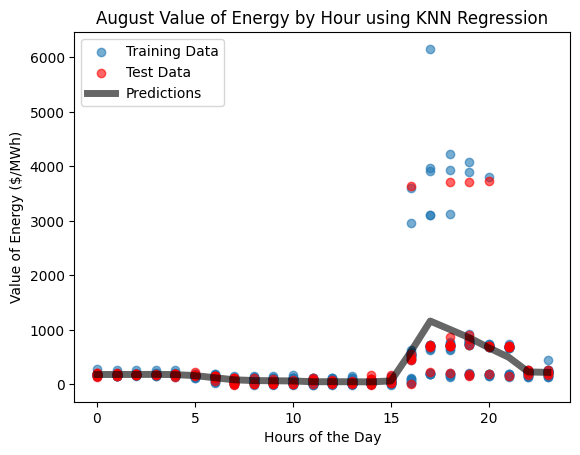

In [60]:
# Evaluate the model
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
reg_errors.loc['August','KNN'] = rmse
print(f"RMSE for KNN: {rmse}") # Much lower than MSE regression!

# Sort the test data and corresponding predictions for smooth plotting
sorted_indices = np.argsort(X_test[:,1].flatten())
X_test_sorted = X_test[:,1].flatten()[sorted_indices]
y_pred_sorted = y_pred[sorted_indices]

# Training Data
plt.scatter(X_train[:,1], y_train, label="Training Data", alpha=0.6)
# Testing Data
plt.scatter(X_test[:,1], y_test, label="Test Data", color="red", alpha=0.6)
# Predicted regression
plt.plot(X_test_sorted, y_pred_sorted, label="Predictions", color="black", alpha=0.6, linewidth = 5)

# Plot settings
plt.legend()
plt.xlabel("Hours of the Day")
plt.ylabel("Value of Energy ($/MWh)")
plt.title("August Value of Energy by Hour using KNN Regression")
plt.show()

Cluster method doesn't work with May-August block

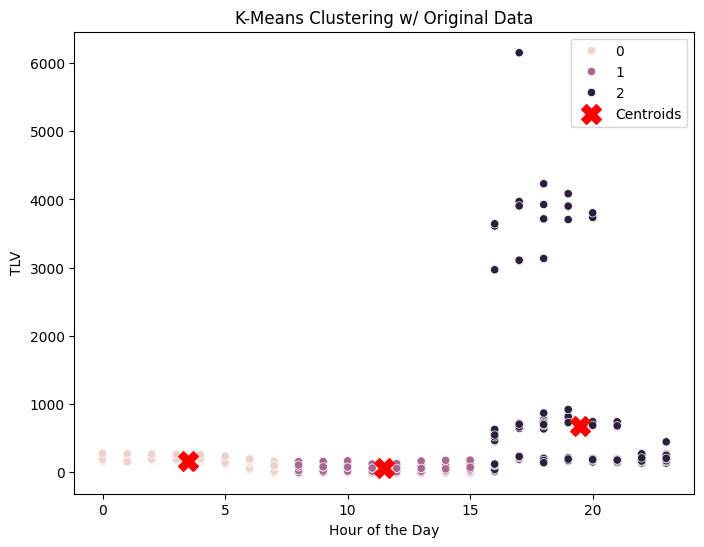

In [61]:
create_cluster_scatterplots(aug_temporal_melted, create_clusters)

In [62]:
linear_cluster_analysis(aug_temporal_melted, month)


NameError: name 'linear_cluster_analysis' is not defined

In [63]:
risk = compute_square_risk(aug_temporal_melted, compute_MSE_weights)
reg_errors.loc['August','Linear+Cluster'] = risk

KeyError: 'Cluster'

Gaussian Basis Functions on Aug Data


In [ ]:
# Parameters
mu = np.linspace(0, 23, 10) # Uses 10 mu's equally spaced out
sigma = (max(x) - min(x)) / 10 #using (max(x) - min(x))/(# of basis functions) for sigma


w = gaussian_weights(x, y, mu, sigma) #Optimal weight vectors given x and y in dataset

print("sigma: ", sigma)
print("weight vector: ", w)

# Plotting H(x) prediction line on data
x_reg = np.linspace(0, 24, 100)
H= plot_h(x_reg, mu, w, sigma)

plt.plot(x_reg, H, color="red")
plt.scatter(x, y)

# Add labels and legend
plt.xlabel('Hours of the Day')
plt.ylabel('Value of Energy ($/MWh)')
plt.title('Value of Energy by Hour w/ Optimized Gaussian Basis Functions')
plt.show()


sigma:  2.3
weight vector:  [ 145.32725455   96.20542391  136.03660903  -13.54580334   90.76636
  -44.96418235   47.55514018 1017.72907709  253.74940515  111.97084775]


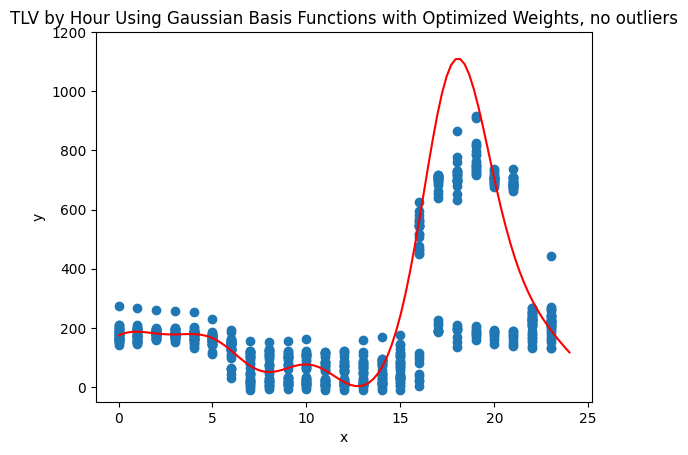

In [64]:
# Parameters
mu = np.linspace(0, 23, 10) # Uses 10 mu's equally spaced out
sigma = (max(x) - min(x)) / 10 #using (max(x) - min(x))/(# of basis functions) for sigma


w = gaussian_weights(x, y, mu, sigma) #Optimal weight vectors given x and y in dataset

print("sigma: ", sigma)
print("weight vector: ", w)

# Plotting H(x) prediction line on data
x_reg = np.linspace(0, 24, 100)
H= plot_h(x_reg, mu, w, sigma)

plt.plot(x_reg, H, color="red")
plt.scatter(x, y)

# Add labels and legend
plt.xlabel('x')
plt.ylabel('y')
plt.ylim(-50, 1200)
plt.title('TLV by Hour Using Gaussian Basis Functions with Optimized Weights, no outliers')
plt.show()


In [65]:
# Calculating Risk
pred_y = H= plot_h(x, mu, w, sigma)
risk = np.sqrt(mean_squared_error(y, H))
reg_errors.loc['August','Gaussian Basis'] = risk

print("risk w.r.t. MSE: ", risk)
reg_errors

risk w.r.t. MSE:  496.0354332552654


,Linear,KNN,Linear+Cluster,Gaussian Basis,Linear+Gaussian+Cluster
January,67.085515,29.332051,31.686737,31.911611,29.793676
February,NaN,NaN,NaN,NaN,NaN
March,NaN,NaN,NaN,NaN,NaN
April,NaN,NaN,NaN,NaN,NaN
May,66.339201,34.452376,42.806009,33.541146,33.810214
June,NaN,NaN,NaN,NaN,NaN
July,NaN,NaN,NaN,NaN,NaN
August,564.589201,511.942825,NaN,496.035433,NaN
September,NaN,NaN,NaN,NaN,NaN
October,NaN,NaN,NaN,NaN,NaN


In [66]:
def linear_cluster_gaussian_outlier (month, year):
    melted_df = load_dataset(month, year)[3]
    nonpeak_df = melted_df[(melted_df['Hour of the Day'] < 15) | (melted_df['Hour of the Day'] > 20)]
    peak_df = melted_df[(melted_df['Hour of the Day'] >=  15) & (melted_df['Hour of the Day'] <= 20)]

    nonpeak_clustered = create_clusters(nonpeak_df, k = 3)[0]
    nonpeak_clustered_centroids = create_clusters(nonpeak_df, k = 3)[3]
    
    peak_clustered = create_clusters(peak_df, k = 1)[0]
    peak_clustered_centroids = create_clusters(peak_df, k = 1)[3]
    peak_clustered['Cluster'] = 3
    
    centroids = combined = np.concatenate((nonpeak_clustered_centroids, peak_clustered_centroids))
    
    clustered = pd.concat([nonpeak_clustered, peak_clustered], ignore_index=True)
    
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=clustered['Hour of the Day'], y=clustered['Value'], hue=clustered['Cluster'])
    plt.scatter(centroids[:, 0], centroids[:, 1], color='red', marker='X', s=200, label='Centroids')
    plt.title('K-Means Clustering w/ Original Data')
    plt.ylabel('TLV')
    plt.legend()
    plt.show()

    peak_x = np.array(peak_df['Hour of the Day'])
    peak_y = np.array(peak_df['Value'])
    
    peak_n = 4
    peak_mu = np.linspace(min(peak_x), max(peak_x), peak_n)
    peak_sigma = (max(peak_x) - min(peak_x)) / peak_n
    
    peak_w = gaussian_weights(peak_x, peak_y, peak_mu, peak_sigma) #Optimal weight vectors given x and y in dataset
    
    print("sigma: ", peak_sigma)
    print("weight vector: ", peak_w)

    # Plotting H(x) prediction line on data
    x_reg = np.linspace(15, 20, len(peak_x))
    H= plot_h(x_reg, peak_mu, peak_w, peak_sigma)
    
    plt.plot(x_reg, H, color="red")
    plt.scatter(peak_x, peak_y)
    
    # Add labels and legend
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('TLV by Hour Using Gaussian Basis Functions with Optimized Weights')
    plt.show()

    plt.figure(figsize=(10, 6))
    nonpeak_x = nonpeak_clustered['Hour of the Day']
    nonpeak_y = nonpeak_clustered['Value']
    
    sns.scatterplot(x=nonpeak_x, y=nonpeak_y,  hue=nonpeak_clustered['Cluster'])
    
    # Labels and title
    plt.xlabel('Hours of the Day')
    plt.ylabel('TLV')
    plt.title('Regression wrt MSE for 4 Clusters for TLV using Linear + Gaussian Reg')
    
    w = compute_MSE_weights(nonpeak_clustered)
    colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'olive', 'cyan']
    
    
    boundary_sum = 0
    
    for i, color in zip(np.unique(nonpeak_clustered['Cluster']), colors):
    
        cluster = nonpeak_clustered[nonpeak_clustered['Cluster'] == i]
    
        if i == 2:
            boundary_sum += cluster.sort_values(by="Hour of the Day", ascending=False).iloc[0]['Hour of the Day']
        if i == 0:
            boundary_sum += cluster.sort_values(by="Hour of the Day", ascending=True).iloc[0]['Hour of the Day']
    
    boundary_01 = boundary_sum/2
            
    
    for i, color in zip(np.unique(nonpeak_clustered['Cluster']), colors):
    
        cluster = nonpeak_clustered[nonpeak_clustered['Cluster'] == i]
            
        # Plot regression line
        if i == 2:
            reg_x_max = boundary_01
            reg_x_min = cluster.sort_values(by="Hour of the Day", ascending=True).iloc[0]['Hour of the Day']
        elif i == 0:
            reg_x_max = cluster.sort_values(by="Hour of the Day", ascending=False).iloc[0]['Hour of the Day']
            reg_x_min = boundary_01
        else:
            reg_x_min = cluster.sort_values(by="Hour of the Day", ascending=True).iloc[0]['Hour of the Day']
            reg_x_max = cluster.sort_values(by="Hour of the Day", ascending=False).iloc[0]['Hour of the Day']
        reg_x_range = np.linspace(reg_x_min, reg_x_max, 1000)
        reg_line = w[i][1] * reg_x_range + w[i][0]
        plt.plot(reg_x_range, reg_line, color=color, label=f'MSE Reg Line ≈ {np.round(w[i][0], 2)} Hour + {np.round(w[i][1], 2)}')
    
    peak_x = peak_clustered['Hour of the Day']
    peak_y = peak_clustered['Value']
    
    plt.plot(x_reg, H, color="purple")
    plt.scatter(peak_x, peak_y, color = "blue", alpha=0.5)
    
    # Show the plot
    plt.legend(loc='upper left', framealpha=0.5, fontsize=8)
    plt.show()

    #Calculating RMSE
    weights_dict = compute_MSE_weights(nonpeak_clustered)

    actual_values = []
    pred_values = []
    
    for i in np.unique(nonpeak_clustered['Cluster']):
        cluster = nonpeak_clustered[nonpeak_clustered['Cluster'] == i]
        w = np.array(weights_dict[i])
    
        x = np.array(cluster["Hour of the Day"])
        y = np.array(cluster["Value"])  # get actual values as array
    
        # Augmenting X with bias term
        x_matrix = np.column_stack((np.ones_like(x), x))
    
        # Store actual and predicted values
        actual_values.extend(y)
        pred_values.extend(x_matrix @ w)  # vectorized prediction
    
    nonpeak_values = pd.DataFrame({'Pred Values': pred_values, 'Actual Values': actual_values})

    pred_peak_y = plot_h(peak_x, peak_mu, peak_w, peak_sigma)
    peak_values = pd.DataFrame({'Pred Values': pred_peak_y, 'Actual Values': peak_y})
    
    values = pd.concat([nonpeak_values, peak_values], ignore_index=True)

    return np.sqrt(mean_squared_error(values['Pred Values'], values['Actual Values']))
              
    

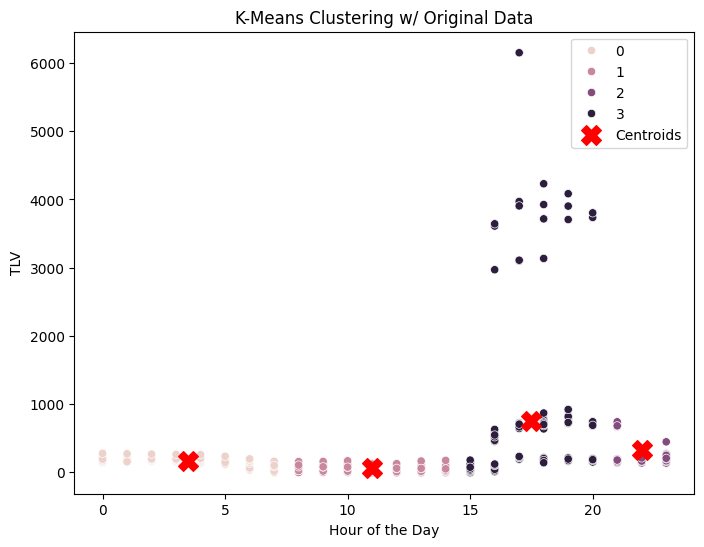

sigma:  1.25
weight vector:  [-98.00705285 945.54926887 685.98710723 642.93354825]


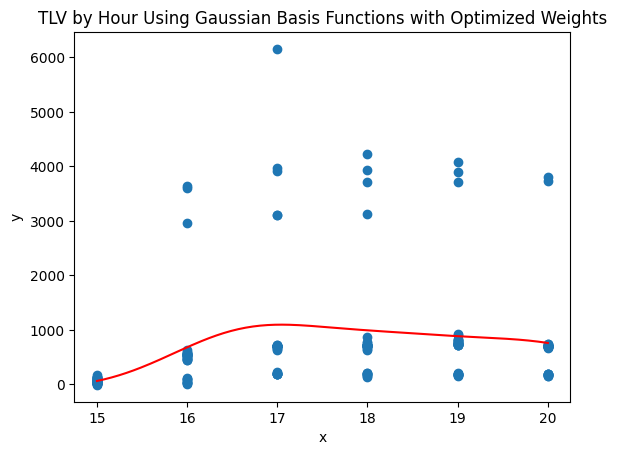

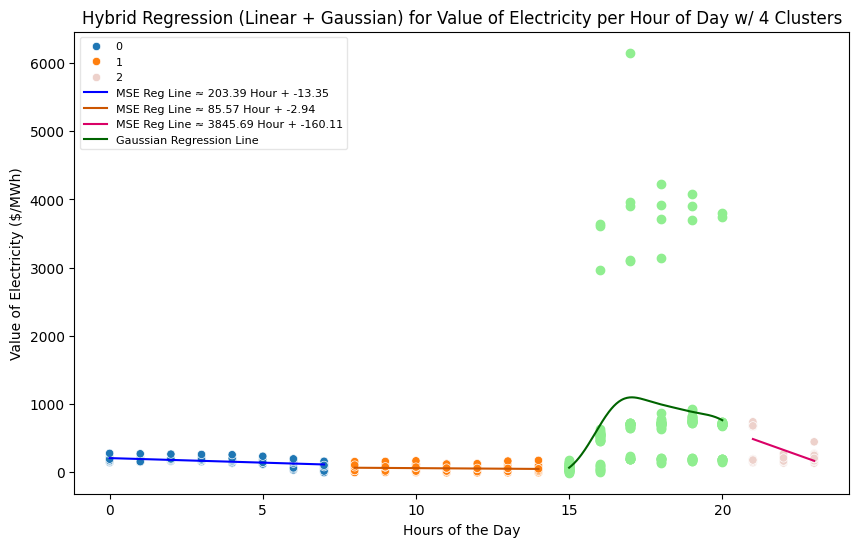

RMSE:  491.9878832511728


In [67]:
reg_errors.loc['August', 'Linear+Gaussian+Cluster '] = linear_cluster_gaussian('August', 2024)

In [68]:
reg_errors

,Linear,KNN,Linear+Cluster,Gaussian Basis,Linear+Gaussian+Cluster
January,67.085515,29.332051,31.686737,31.911611,29.793676
February,NaN,NaN,NaN,NaN,NaN
March,NaN,NaN,NaN,NaN,NaN
April,NaN,NaN,NaN,NaN,NaN
May,66.339201,34.452376,42.806009,33.541146,33.810214
June,NaN,NaN,NaN,NaN,NaN
July,NaN,NaN,NaN,NaN,NaN
August,564.589201,511.942825,NaN,496.035433,491.987883
September,NaN,NaN,NaN,NaN,NaN
October,NaN,NaN,NaN,NaN,NaN


---

### February

In [69]:
feb_data = load_dataset("February", 2024)[2]
feb_temporal_melted = load_dataset("February", 2024)[3]

x = load_dataset("February", 2024)[0]
y = load_dataset("February", 2024)[1]
feb_data.head()

,1,2,3,4,5,6,7,8,9,10,...,19,20,21,22,23,24,25,26,27,28
Hour of the Day,,,,,,,,,,,,,,,,,,,,,
0,137.797440,185.455953,173.127393,107.660611,158.081651,212.566408,194.938751,155.538297,148.792777,143.842518,...,150.684021,158.638386,181.648708,204.854147,166.371131,168.544281,128.803500,185.289949,166.082576,170.307477
1,138.496168,156.617304,170.057125,99.231504,155.265600,179.413470,233.394278,178.111430,146.428032,215.052816,...,198.390084,152.541869,194.707623,151.333566,164.420168,154.409689,123.795788,183.527995,168.600326,169.061197
2,138.514969,154.591030,171.792755,153.282517,153.587328,177.325569,191.838184,186.046790,161.948656,199.134656,...,192.389507,154.018813,192.322242,196.105259,166.511841,152.872320,170.013063,183.653211,200.905695,172.828419
3,144.947075,176.209945,161.126686,131.501124,153.773092,161.212240,195.522560,198.261839,201.796020,190.950375,...,197.985248,160.248204,188.452788,187.786718,161.746931,148.356528,203.232835,184.525714,202.816556,170.832341
4,146.653328,188.145577,156.911344,41.432707,157.249383,159.855088,198.905457,198.325127,201.656254,200.654473,...,194.842320,167.207034,183.254031,186.089489,166.047972,129.251798,203.348632,188.649736,219.112703,179.724980


#### Linear Regression

In [70]:
def lin_reg(x, y, month):
    # Takes in month_data and name of month and prints out linear regression intercept, slope, and the graph. 
    # It also updates the regression error table and outputs the melted temporal dataframe for further analysis
    
    # Augmenting x matrix
    x_matrix = []
    for i in x:
        x_matrix.append([1, i])
    
    x_matrix = np.array(x_matrix)
    
    # Finding optimal linear weights
    w = np.linalg.solve(x_matrix.T @ x_matrix, x_matrix.T @ y)
    
    #w[0]: intercept, w[1]: slope
    print("intercept = w[0]:", w[0])
    print("slope = w[1]:", w[1])

    #Update MSE Risk Table
    y_true = y
    y_pred = x_matrix @ w
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    reg_errors.loc[month,'Linear'] = rmse
    print("RMSE using linear regression:", rmse) #Bad MSE, very large

    # Setting Plot Type
    plt.scatter(x, y, label='Data points')
    
    # Labels and title
    plt.xlabel('Hour of the Day')
    plt.ylabel('TLV')
    plt.title('TLV by Hour using Empirical Risk Minimization w.r.t. MSE')
    
    # Plot regression line
    reg_line = w[1] * x + w[0]
    plt.plot(x, reg_line, color='red', label=f'MSE Reg Line')
    
    # Show the plot
    plt.legend()
    plt.show()
    
    return x_matrix

intercept = w[0]: 120.25680828653029
slope = w[1]: -0.547602890776572
RMSE using linear regression: 78.23504101103869


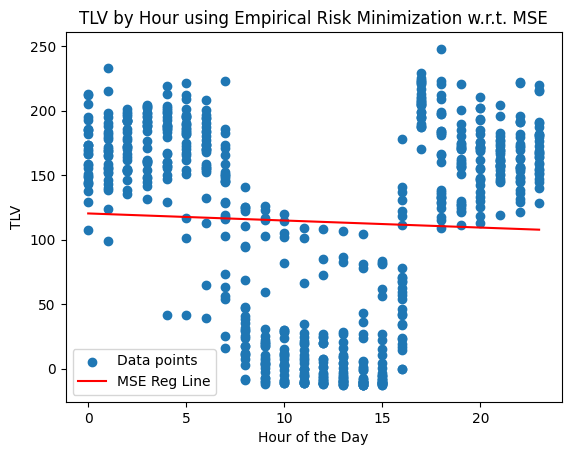

In [71]:
x_matrix = lin_reg(x, y, "February")

#### KNN Regression for feb

In [72]:
# def knn_reg(x_matrix, y, month):
#     # Splitting data into test and training data
#     X_train, X_test, y_train, y_test = train_test_split(x_matrix, y, test_size=0.2, random_state=42)
#     X_train, X_test, y_train, y_test
    
#     k = round(np.sqrt(len(x_matrix))) #letting k = square root of n
#     y_train = np.array(y_train)

#     y_pred = knn_predict(X_train, y_train, X_test, k=k) #KNN predictons for TLV
    
#     # Evaluate the model
#     mse = mean_squared_error(y_test, y_pred)
#     reg_errors.loc[month,'KNN'] = mse
#     print(f"MSE for KNN: {mse}") # Much lower than MSE regression!
    
#     # Sort the test data and corresponding predictions for smooth plotting
#     sorted_indices = np.argsort(X_test[:,1].flatten())
#     X_test_sorted = X_test[:,1].flatten()[sorted_indices]
#     y_pred_sorted = y_pred[sorted_indices]
    
#     # Training Data
#     plt.scatter(X_train[:,1], y_train, label="Training Data", alpha=0.6)
#     # Testing Data
#     plt.scatter(X_test[:,1], y_test, label="Test Data", color="red", alpha=0.6)
#     # Predicted regression
#     plt.plot(X_test_sorted, y_pred_sorted, label="Predictions", color="black", alpha=0.6, linewidth = 5)
    
#     # Plot settings
#     plt.legend()
#     plt.xlabel("Hours of the Day")
#     plt.ylabel("TLV")
#     plt.title(month + " TLV by Hour using KNN Regression")
#     plt.show()

MSE for KNN: 37.60317313192416


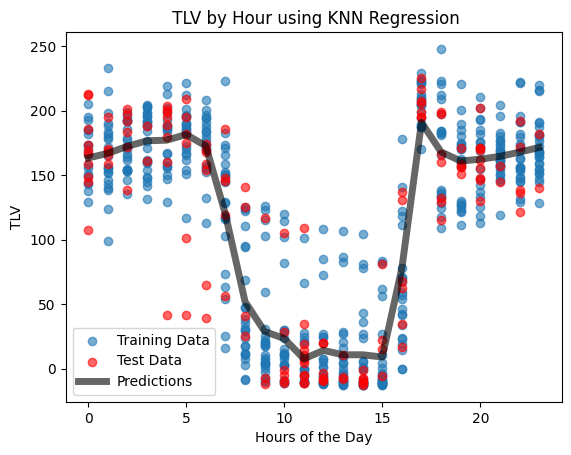

In [73]:
# Splitting data into test and training data
X_train, X_test, y_train, y_test = train_test_split(x_matrix, y, test_size=0.2, random_state=42)
X_train, X_test, y_train, y_test

k = round(np.sqrt(len(x_matrix))) #letting k = square root of n
y_train = np.array(y_train)

y_pred = knn_predict(X_train, y_train, X_test, k=k) #KNN predictons for TLV

# Evaluate the model
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
reg_errors.loc["February",'KNN'] = rmse
print(f"MSE for KNN: {rmse}") # Much lower than MSE regression!

# Sort the test data and corresponding predictions for smooth plotting
sorted_indices = np.argsort(X_test[:,1].flatten())
X_test_sorted = X_test[:,1].flatten()[sorted_indices]
y_pred_sorted = y_pred[sorted_indices]

# Training Data
plt.scatter(X_train[:,1], y_train, label="Training Data", alpha=0.6)
# Testing Data
plt.scatter(X_test[:,1], y_test, label="Test Data", color="red", alpha=0.6)
# Predicted regression
plt.plot(X_test_sorted, y_pred_sorted, label="Predictions", color="black", alpha=0.6, linewidth = 5)

# Plot settings
plt.legend()
plt.xlabel("Hours of the Day")
plt.ylabel("TLV")
plt.title(" TLV by Hour using KNN Regression")
plt.show()

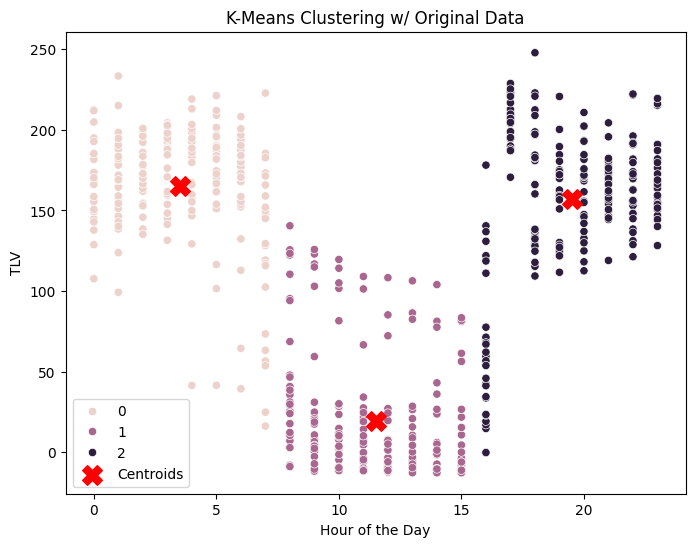

In [74]:
create_cluster_scatterplots(feb_temporal_melted, create_clusters)

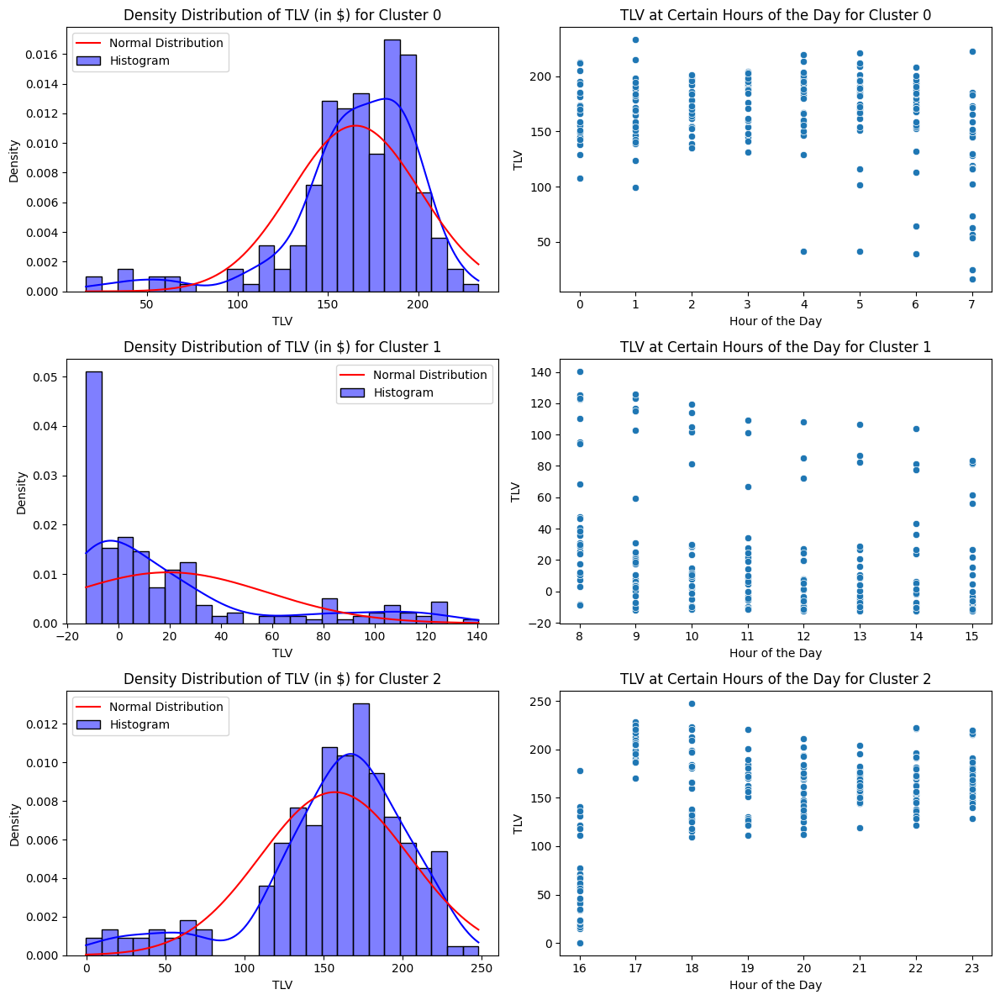

In [75]:
feb_temporal_melted = create_clusters(feb_temporal_melted)[0]
analyze_cluster_dist(feb_temporal_melted)

cluster weights:  {np.int64(0): array([177.5972951 ,  -3.48866311]), np.int64(1): array([78.29539573, -5.11751839]), np.int64(2): array([33.79756987,  6.32049471])}
cluster square loss risk:  38.985566890852716


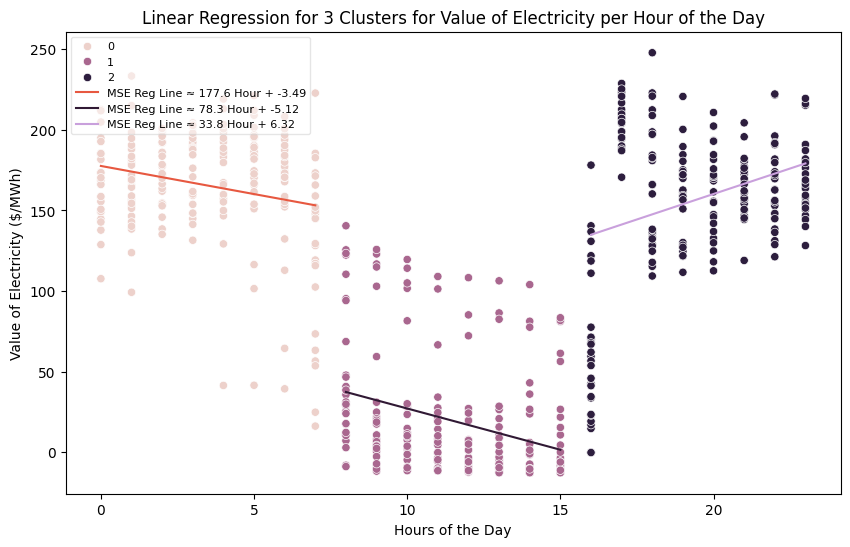

In [76]:
print("cluster weights: ", compute_MSE_weights(feb_temporal_melted)) 
print("cluster square loss risk: ", compute_square_risk(feb_temporal_melted, compute_MSE_weights))

cluster_MSE_reg_graphs(feb_temporal_melted, compute_MSE_weights)

In [77]:
# Risk for this type of pricing scheme:
risk = compute_square_risk(feb_temporal_melted, compute_MSE_weights)
reg_errors.loc['February','Linear+Cluster'] = risk
print("empirical risk: ", risk)

empirical risk:  38.985566890852716


#### Gaussian Basis

In [78]:
def gaussian_basis(x, y, month):
    # Parameters
    mu = np.linspace(0, 23, 10) # Uses 10 mu's equally spaced out
    sigma = (max(x) - min(x)) / 10 #using (max(x) - min(x))/(# of basis functions) for sigma
    
    
    w = gaussian_weights(x, y, mu, sigma) #Optimal weight vectors given x and y in dataset
    
    print("sigma: ", sigma)
    print("weight vector: ", w)

    # Calculating Risk
    pred_y = H= plot_h(x, mu, w, sigma)
    risk = np.sqrt(mean_squared_error(y, H))
    reg_errors.loc[month,'Gaussian Basis'] = risk
    
    print("risk w.r.t. RMSE: ", risk)

    # Plotting H(x) prediction line on data
    x_reg = np.linspace(0, 24, 100)
    H= plot_h(x_reg, mu, w, sigma)
    
    plt.plot(x_reg, H, color="red")
    plt.scatter(x, y)
    
    # Add labels and legend
    plt.xlabel('Hours of the Day')
    plt.ylabel('Value of Energy ($/MWh)')
    plt.title('Value of Energy by Hour Using Gaussian Basis Functions with Optimized Weights')
    plt.show()


sigma:  2.3
weight vector:  [138.08612948  84.94386902 145.64792511  36.1349396    0.79440481
  11.57322883 -17.34189321 179.52171611  49.11514508 158.1677496 ]
risk w.r.t. RMSE:  36.05199234099548


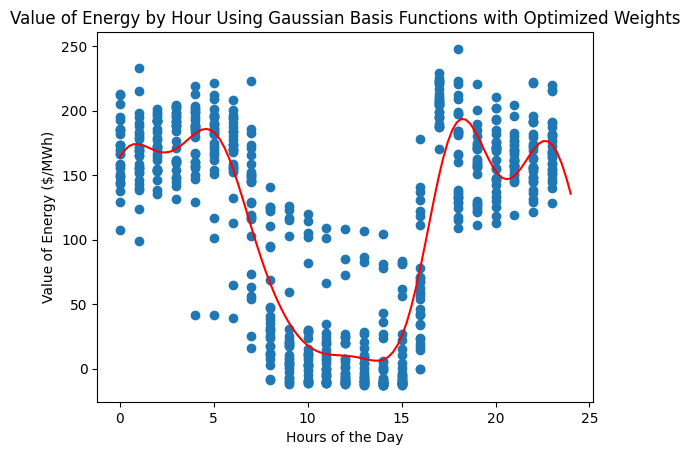

In [79]:
gaussian_basis(x,y, "February")

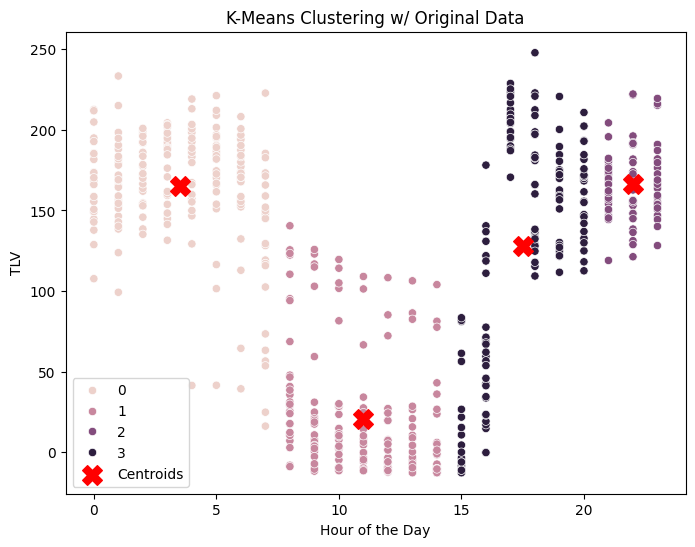

sigma:  1.25
weight vector:  [-32.94784484 153.12915543 117.26347291 138.54108118]


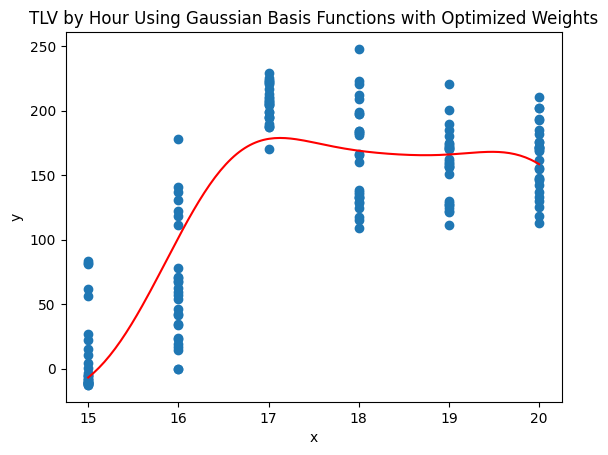

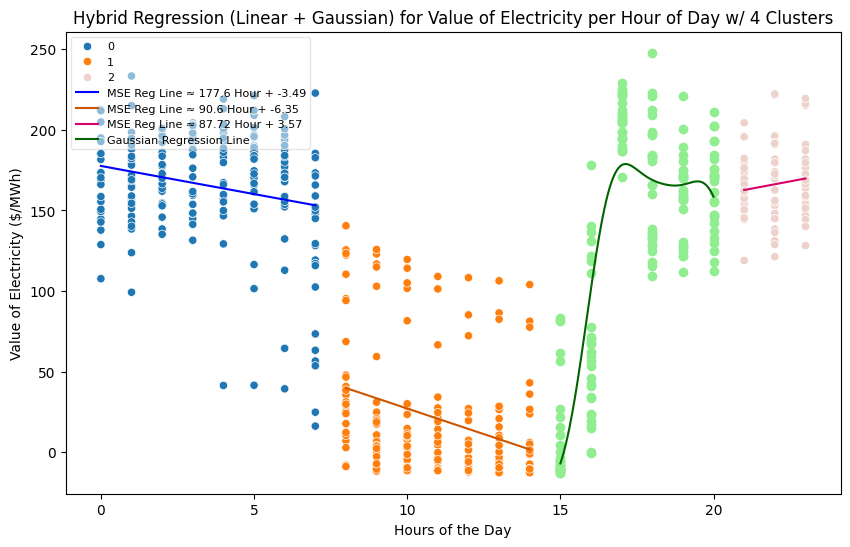

RMSE:  34.91414912478378


In [80]:
reg_errors.loc['February', 'Linear+Gaussian+Cluster '] = linear_cluster_gaussian('February', 2024)

---

### March

In [81]:
mar_data = load_dataset("March", 2024)[2]
mar_temporal_melted = load_dataset("March", 2024)[3]

x = load_dataset("March", 2024)[0]
y = load_dataset("March", 2024)[1]
mar_data.head()

,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
Hour of the Day,,,,,,,,,,,,,,,,,,,,,
0,173.147150,187.997167,158.979123,122.640417,143.462385,141.183503,111.932031,122.569558,131.531941,124.781500,...,168.594672,197.020031,124.551992,145.711382,122.157704,126.920917,206.062037,133.843898,118.984984,118.046327
1,171.062812,183.351296,178.310073,130.466249,157.146299,130.696111,110.136961,122.873461,159.884770,127.850910,...,189.417352,192.886707,124.481071,137.853868,112.097374,116.093490,174.421809,148.857276,108.483712,109.218088
2,153.118128,176.076429,182.958655,177.765184,172.578610,127.037694,113.230738,117.838430,189.493398,126.840975,...,173.672223,165.627755,127.121511,168.381710,109.689187,113.336050,152.981285,142.743749,97.349144,116.486677
3,141.377677,180.695649,175.338064,166.671751,158.312698,131.682609,151.497074,119.539606,173.819112,127.453661,...,162.401703,151.713318,207.420298,173.431494,108.566230,106.754339,152.848100,147.383896,103.655965,112.390173
4,146.325339,186.084339,172.998538,157.630979,162.745618,131.893677,155.610047,129.797523,179.896818,132.922770,...,133.051963,173.361559,195.307962,162.526079,110.048756,104.525446,124.678851,145.805451,101.722618,113.249036


intercept = w[0]: 83.15329488764743
slope = w[1]: 0.13809038549524114
RMSE using linear regression: 75.63747654759821


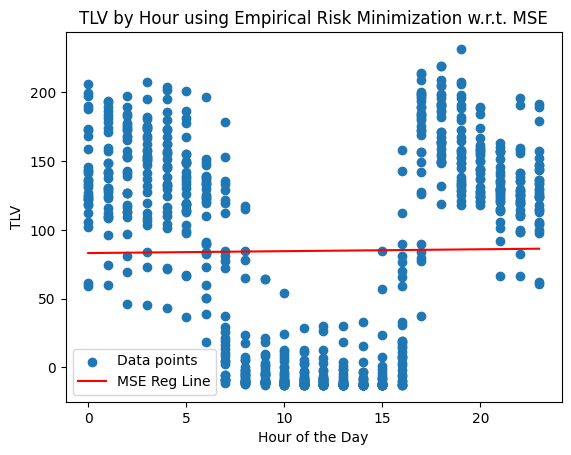

In [82]:
x_matrix = lin_reg(x, y, "March")

RMSE for KNN: 33.076675967471566


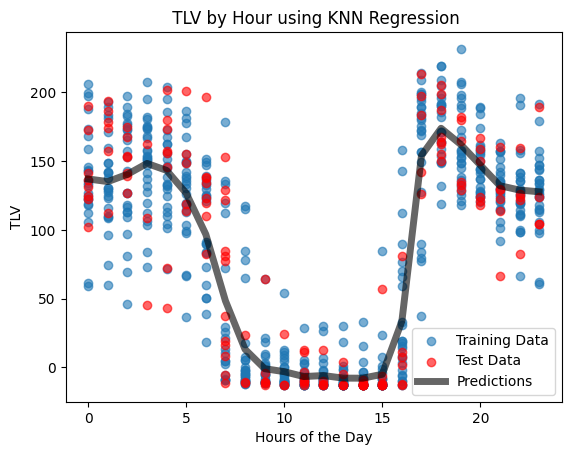

In [83]:
# Splitting data into test and training data
X_train, X_test, y_train, y_test = train_test_split(x_matrix, y, test_size=0.2, random_state=42)
X_train, X_test, y_train, y_test

k = round(np.sqrt(len(x_matrix))) #letting k = square root of n
y_train = np.array(y_train)

y_pred = knn_predict(X_train, y_train, X_test, k=k) #KNN predictons for TLV

# Evaluate the model
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
reg_errors.loc["March",'KNN'] = rmse
print(f"RMSE for KNN: {rmse}") # Much lower than MSE regression!

# Sort the test data and corresponding predictions for smooth plotting
sorted_indices = np.argsort(X_test[:,1].flatten())
X_test_sorted = X_test[:,1].flatten()[sorted_indices]
y_pred_sorted = y_pred[sorted_indices]

# Training Data
plt.scatter(X_train[:,1], y_train, label="Training Data", alpha=0.6)
# Testing Data
plt.scatter(X_test[:,1], y_test, label="Test Data", color="red", alpha=0.6)
# Predicted regression
plt.plot(X_test_sorted, y_pred_sorted, label="Predictions", color="black", alpha=0.6, linewidth = 5)

# Plot settings
plt.legend()
plt.xlabel("Hours of the Day")
plt.ylabel("TLV")
plt.title(" TLV by Hour using KNN Regression")
plt.show()

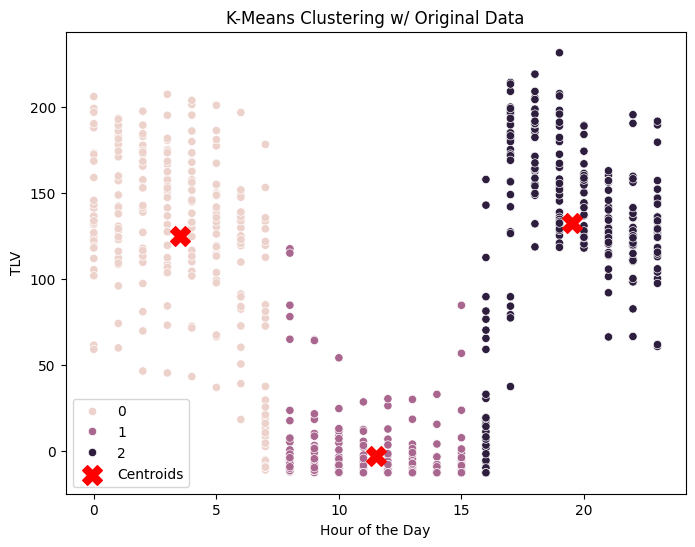

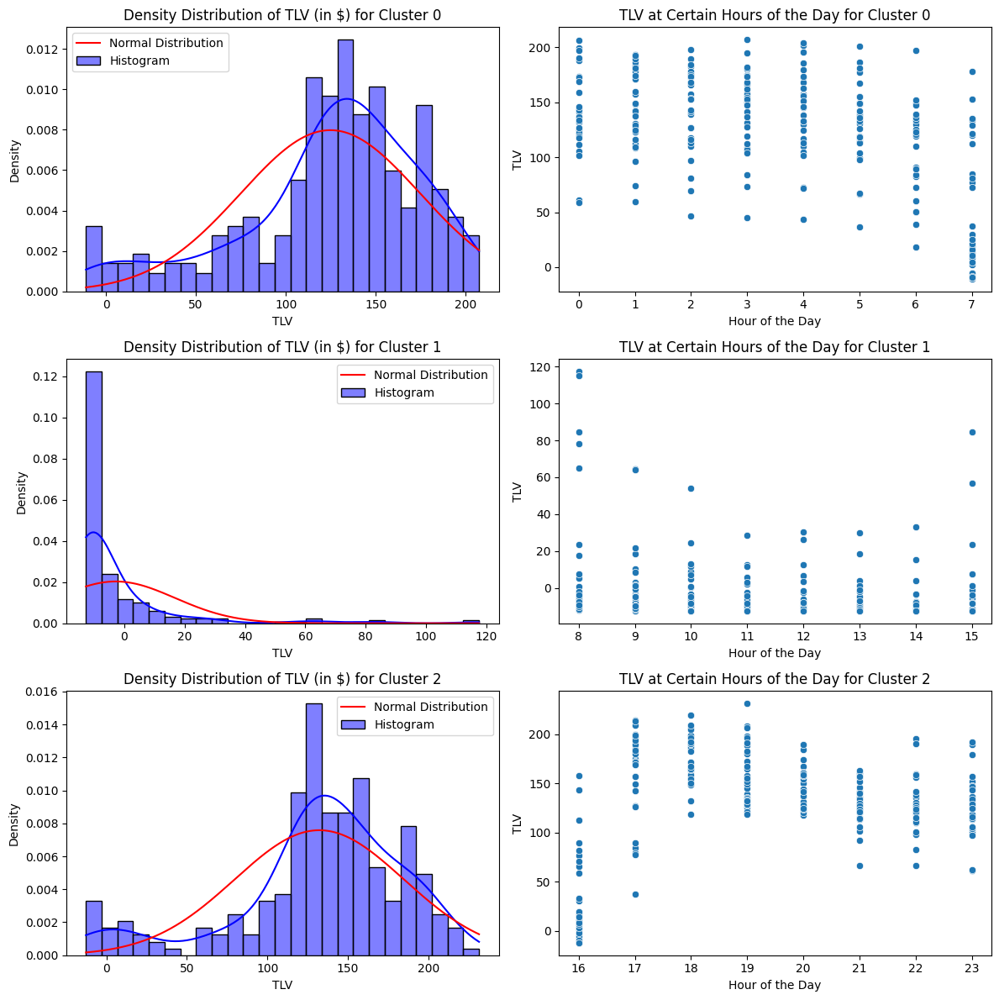

In [84]:
create_cluster_scatterplots(mar_temporal_melted, create_clusters)
mar_temporal_melted = create_clusters(mar_temporal_melted)[0]
analyze_cluster_dist(mar_temporal_melted)

cluster weights:  {np.int64(0): array([159.27522706,  -9.85225827]), np.int64(1): array([19.59545154, -1.95227365]), np.int64(2): array([51.07872219,  4.16454631])}
cluster square loss risk:  40.85426494465684


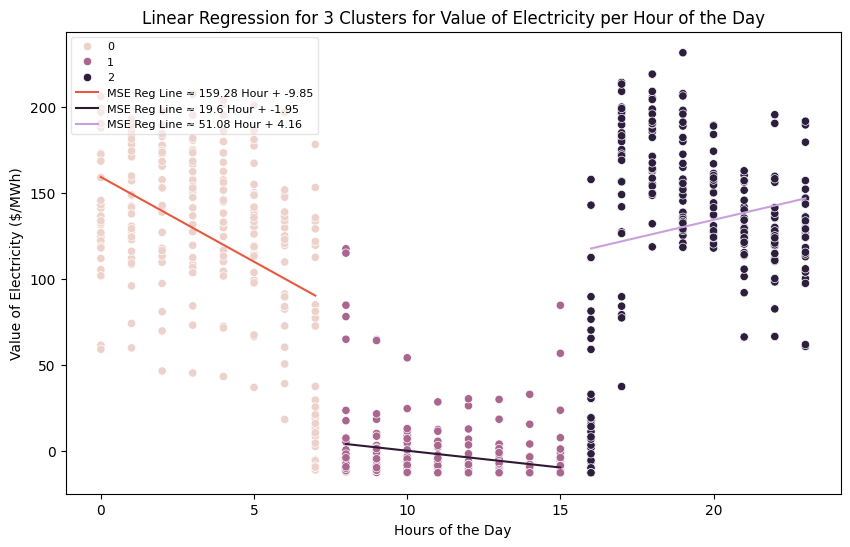

In [85]:
print("cluster weights: ", compute_MSE_weights(mar_temporal_melted)) 
print("cluster square loss risk: ", compute_square_risk(mar_temporal_melted, compute_MSE_weights))

cluster_MSE_reg_graphs(mar_temporal_melted, compute_MSE_weights)

In [86]:
# Risk for this type of pricing scheme:
risk = compute_square_risk(mar_temporal_melted, compute_MSE_weights)
reg_errors.loc['March','Linear+Cluster'] = risk
print("empirical risk: ", risk)

empirical risk:  40.85426494465684


sigma:  2.3
weight vector:  [113.98045711  74.29848591 112.16992277  -5.80034102  -7.14823343
   8.21640511 -45.08312068 179.64553063  43.58059606 114.66905479]
risk w.r.t. RMSE:  32.398047232474504


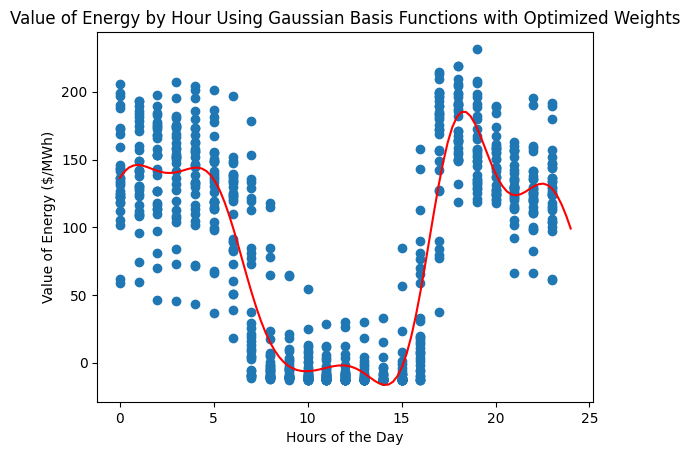

In [87]:
gaussian_basis(x,y, "March")

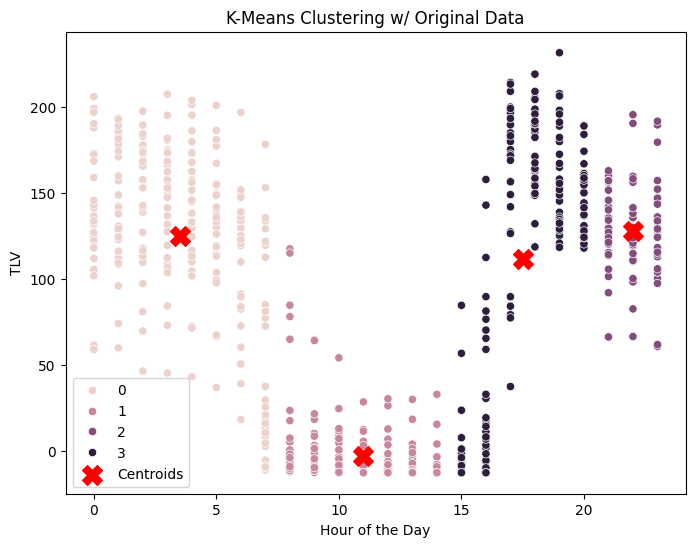

sigma:  1.25
weight vector:  [-36.26793472 103.33339294 141.9189967  115.89591461]


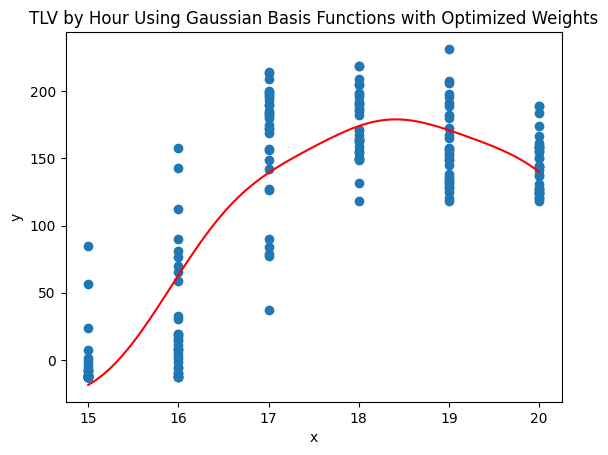

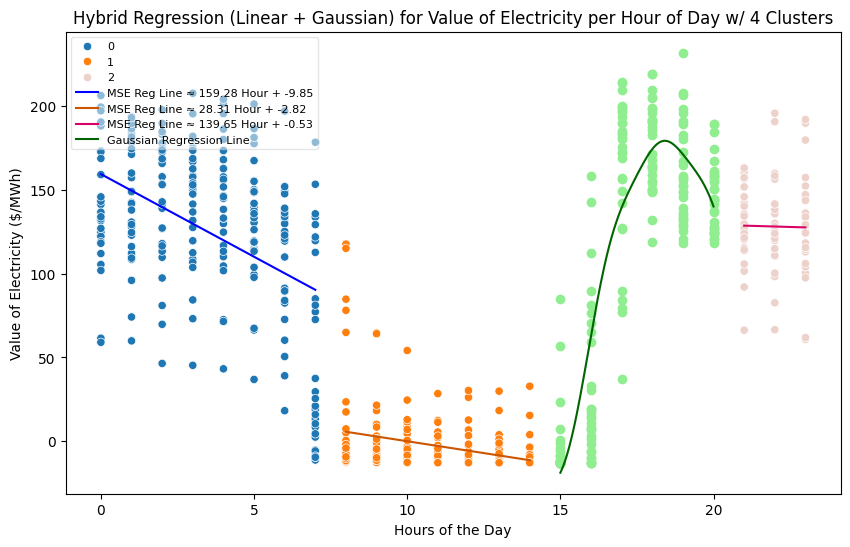

RMSE:  34.55797574886818


In [88]:
reg_errors.loc['March', 'Linear+Gaussian+Cluster '] = linear_cluster_gaussian('March', 2024)

### April

In [89]:
apr_data = load_dataset("April", 2024)[2]
apr_temporal_melted = load_dataset("April", 2024)[3]

x = load_dataset("April", 2024)[0]
y = load_dataset("April", 2024)[1]
apr_data.head()

,1,2,3,4,5,6,7,8,9,10,...,21,22,23,24,25,26,27,28,29,30
Hour of the Day,,,,,,,,,,,,,,,,,,,,,
0,142.128910,156.961600,118.268110,77.082181,120.190127,75.547912,144.553616,34.653915,145.804072,174.268680,...,66.643233,22.542102,66.291948,108.427436,34.996823,27.058872,72.540946,96.114001,19.770585,27.775947
1,161.454720,157.919528,173.056861,79.939305,127.494067,164.213139,166.074384,51.185536,149.941498,162.877576,...,68.864629,21.861669,68.932006,94.777965,31.501101,23.262662,70.094127,106.077757,19.681103,30.203837
2,157.686483,160.030018,178.779657,89.142656,137.101997,142.225459,173.779691,168.578953,154.876776,161.048966,...,66.537686,31.090090,82.427320,94.586960,47.874151,28.207683,197.426795,104.303530,19.914574,26.709730
3,164.747424,165.776214,187.312884,88.559593,146.413665,146.804423,179.166473,160.204070,149.066775,103.741261,...,69.345654,29.479845,83.026997,91.969412,39.401226,28.378251,95.017384,104.525577,20.392988,24.985326
4,159.342426,166.572679,27.574794,94.042178,144.895137,156.279332,162.713632,154.765789,152.082710,64.079594,...,69.242933,27.511249,78.247574,125.113447,40.372977,29.101650,55.285878,104.786384,18.636124,28.678626


intercept = w[0]: 49.61029392178793
slope = w[1]: 0.24164075100417962
RMSE using linear regression: 65.71080332944031


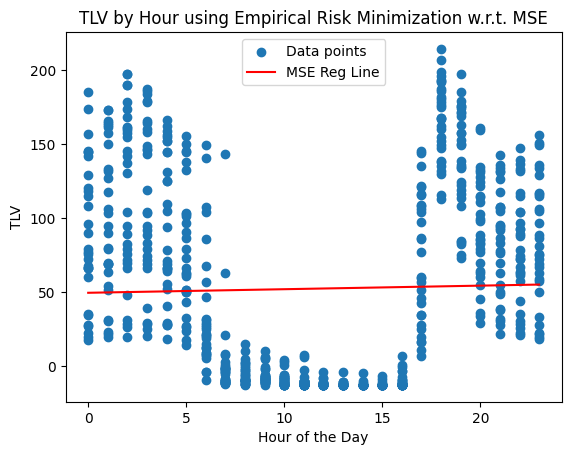

In [90]:
x_matrix = lin_reg(x, y, "April")

MSE for KNN: 32.25130927054026


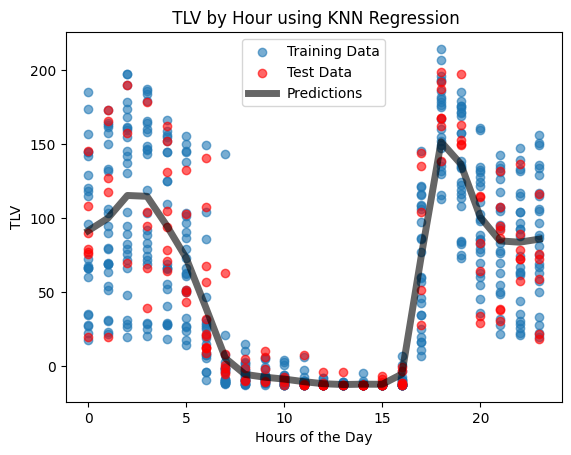

In [91]:
# Splitting data into test and training data
X_train, X_test, y_train, y_test = train_test_split(x_matrix, y, test_size=0.2, random_state=42)
X_train, X_test, y_train, y_test

k = round(np.sqrt(len(x_matrix))) #letting k = square root of n
y_train = np.array(y_train)

y_pred = knn_predict(X_train, y_train, X_test, k=k) #KNN predictons for TLV

# Evaluate the model
mse = np.sqrt(mean_squared_error(y_test, y_pred))
reg_errors.loc["April",'KNN'] = mse
print(f"MSE for KNN: {mse}") # Much lower than MSE regression!

# Sort the test data and corresponding predictions for smooth plotting
sorted_indices = np.argsort(X_test[:,1].flatten())
X_test_sorted = X_test[:,1].flatten()[sorted_indices]
y_pred_sorted = y_pred[sorted_indices]

# Training Data
plt.scatter(X_train[:,1], y_train, label="Training Data", alpha=0.6)
# Testing Data
plt.scatter(X_test[:,1], y_test, label="Test Data", color="red", alpha=0.6)
# Predicted regression
plt.plot(X_test_sorted, y_pred_sorted, label="Predictions", color="black", alpha=0.6, linewidth = 5)

# Plot settings
plt.legend()
plt.xlabel("Hours of the Day")
plt.ylabel("TLV")
plt.title(" TLV by Hour using KNN Regression")
plt.show()

In [92]:
def linear_cluster_analysis(month_temporal_melted, month):
    create_cluster_scatterplots(month_temporal_melted, create_clusters)
    month_temporal_melted = create_clusters(month_temporal_melted)[0]
    analyze_cluster_dist(month_temporal_melted)

    print("cluster weights: ", compute_MSE_weights(month_temporal_melted)) 
    print("cluster square loss risk: ", compute_square_risk(month_temporal_melted, compute_MSE_weights))
    
    cluster_MSE_reg_graphs(month_temporal_melted, compute_MSE_weights)

    # Risk for this type of pricing scheme:
    risk = compute_square_risk(month_temporal_melted, compute_MSE_weights)
    reg_errors.loc[month,'Linear+Cluster'] = risk
    print("empirical risk: ", risk)
    

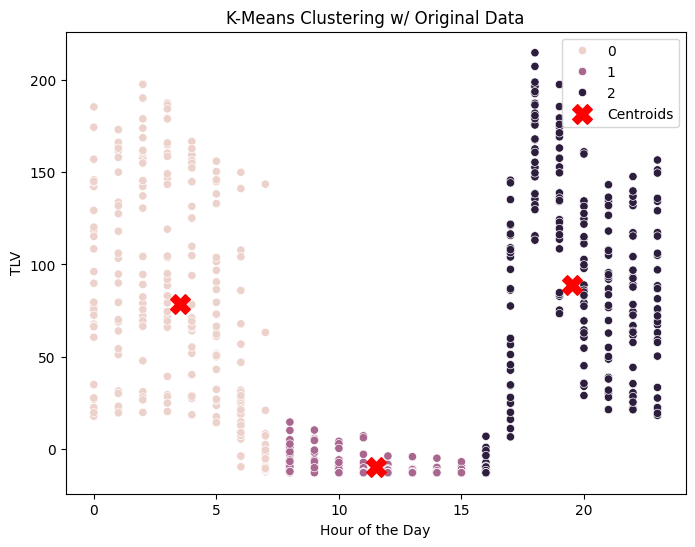

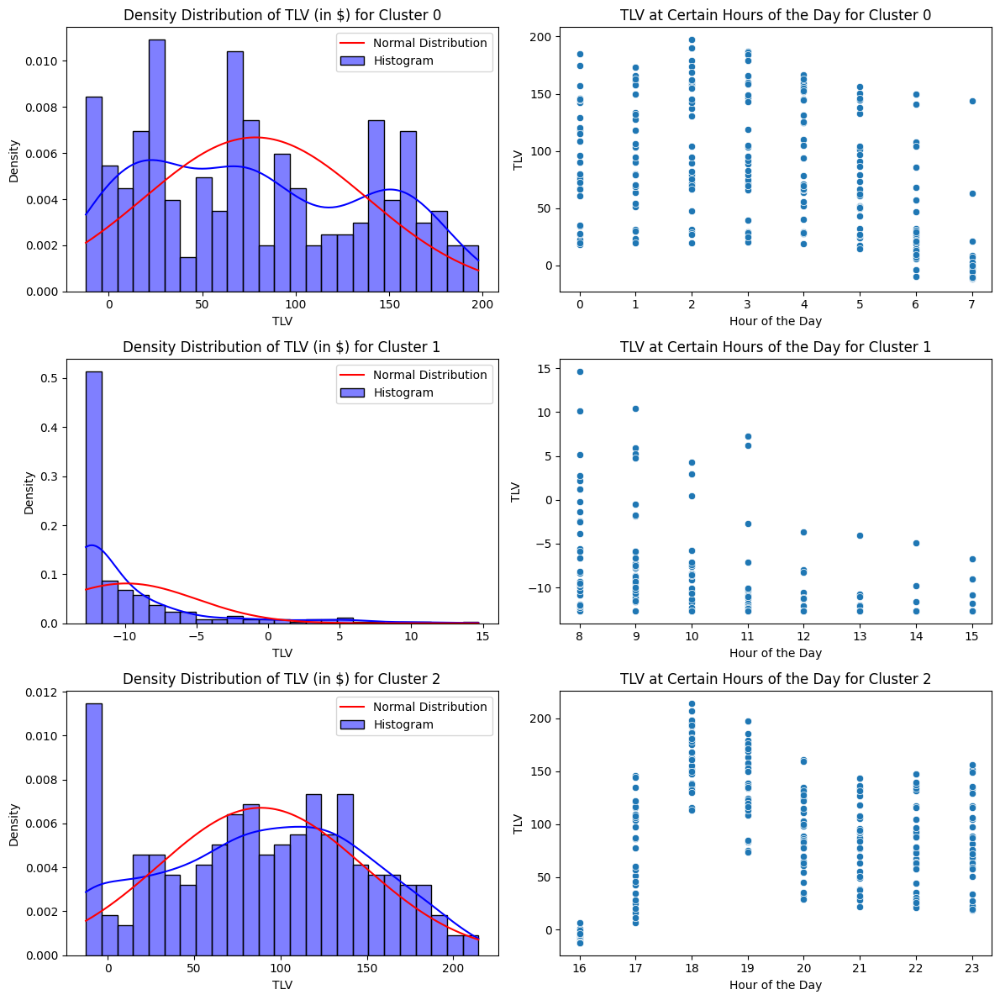

cluster weights:  {np.int64(0): array([122.47643804, -12.58767567]), np.int64(1): array([ 2.63955032, -1.08971383]), np.int64(2): array([-3.39306629,  4.71964818])}
cluster square loss risk:  45.2268730477321


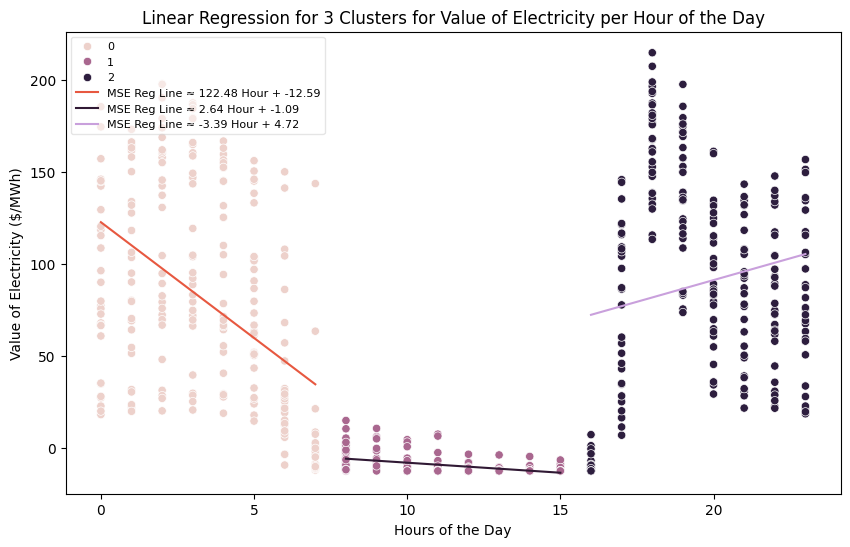

empirical risk:  45.2268730477321


In [93]:
linear_cluster_analysis(apr_temporal_melted, "April")

sigma:  2.3
weight vector:  [ 59.52301789  85.50872159  44.30445572 -11.48526415 -14.17387599
  19.24285352 -71.47015565 151.62478221  25.58129597  72.59449696]
risk w.r.t. RMSE:  35.30707806539169


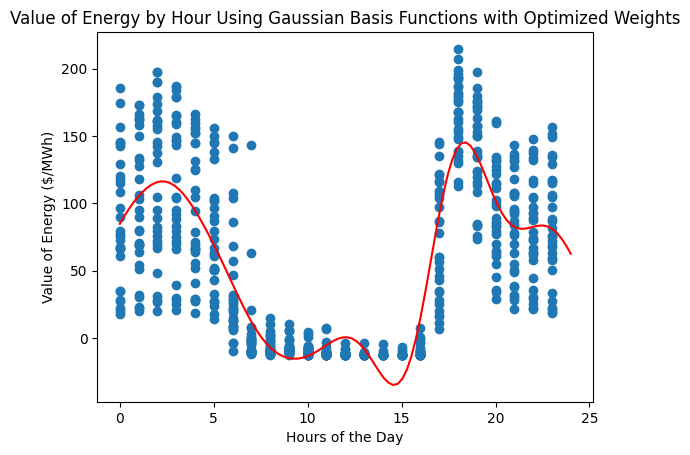

In [94]:
gaussian_basis(x,y, "April")

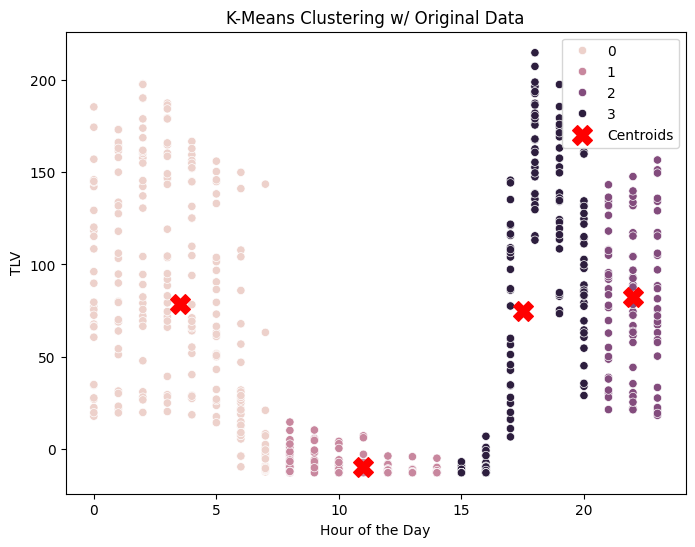

sigma:  1.25
weight vector:  [-22.03708519  15.23222512 161.06790196  58.7398947 ]


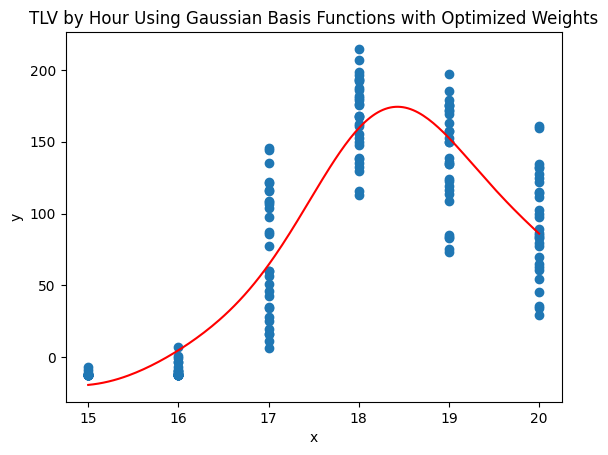

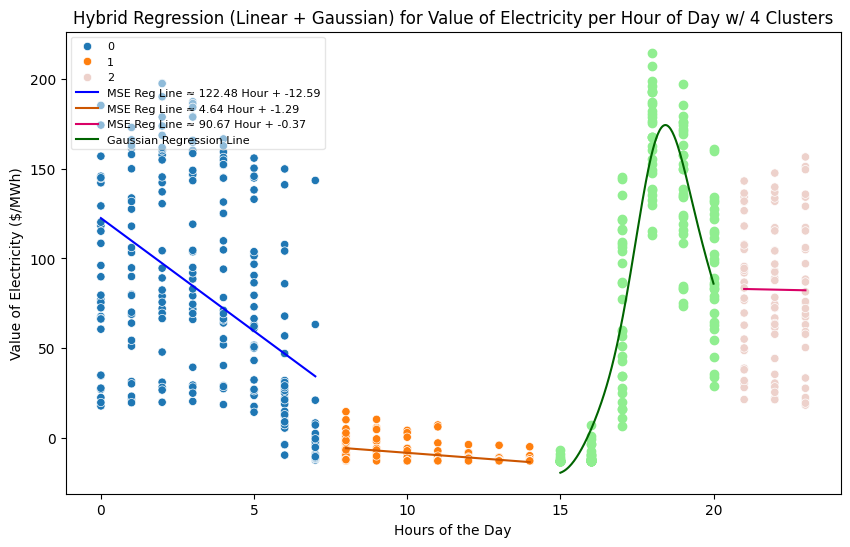

RMSE:  36.47427601359189


In [95]:
reg_errors.loc['April', 'Linear+Gaussian+Cluster '] = linear_cluster_gaussian('April', 2024)

---

### June

                         1           2           3           4           5   \
Hour of the Day                                                               
0                140.710873  116.595841   83.155662  118.619714  118.716805   
1                138.832143  134.058826  120.923171  132.955132  170.913787   
2                142.156305  135.104178  170.490454  171.931147  168.156918   
3                144.003553  138.213121  119.026216  127.897045  129.298694   
4                140.377855  138.465382   84.866668  118.701651  108.298315   

                         6           7           8           9           10  \
Hour of the Day                                                               
0                123.467794  195.305217  139.097019  114.246930  139.845081   
1                133.452557  171.965377  156.437209  117.683234  131.195657   
2                156.887118  156.198513  168.750630  142.028970  136.532356   
3                135.339185  151.498832  151.338244

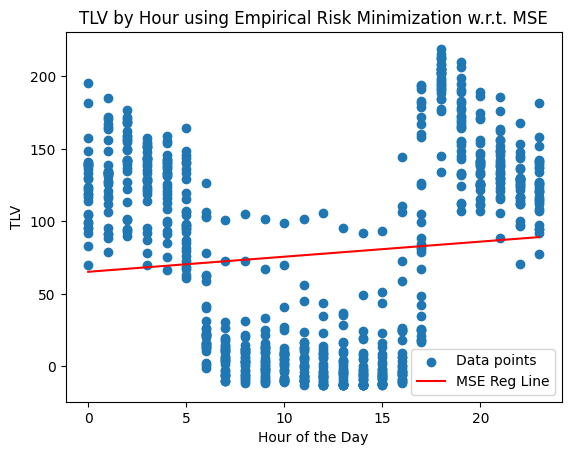

In [96]:
month = "June"
jun_data = load_dataset(month, 2024)[2]
jun_temporal_melted = load_dataset(month, 2024)[3]

x = load_dataset(month, 2024)[0]
y = load_dataset(month, 2024)[1]
print(jun_data.head())

x_matrix = lin_reg(x, y, month)

MSE for KNN: 27.44577451025482


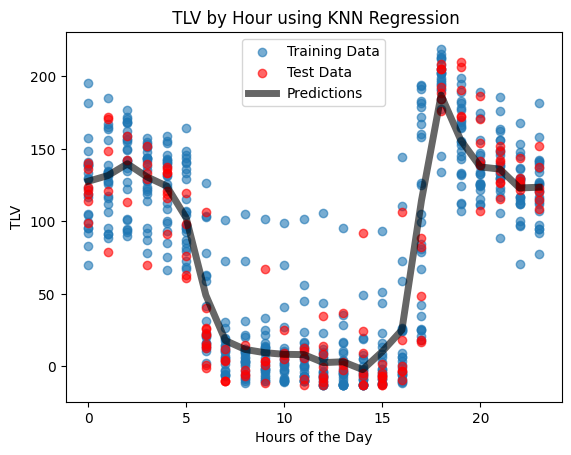

In [97]:
# Splitting data into test and training data
X_train, X_test, y_train, y_test = train_test_split(x_matrix, y, test_size=0.2, random_state=42)
X_train, X_test, y_train, y_test

k = round(np.sqrt(len(x_matrix))) #letting k = square root of n
y_train = np.array(y_train)

y_pred = knn_predict(X_train, y_train, X_test, k=k) #KNN predictons for TLV

# Evaluate the model
mse = np.sqrt(mean_squared_error(y_test, y_pred))
reg_errors.loc[month,'KNN'] = mse
print(f"MSE for KNN: {mse}") # Much lower than MSE regression!

# Sort the test data and corresponding predictions for smooth plotting
sorted_indices = np.argsort(X_test[:,1].flatten())
X_test_sorted = X_test[:,1].flatten()[sorted_indices]
y_pred_sorted = y_pred[sorted_indices]

# Training Data
plt.scatter(X_train[:,1], y_train, label="Training Data", alpha=0.6)
# Testing Data
plt.scatter(X_test[:,1], y_test, label="Test Data", color="red", alpha=0.6)
# Predicted regression
plt.plot(X_test_sorted, y_pred_sorted, label="Predictions", color="black", alpha=0.6, linewidth = 5)

# Plot settings
plt.legend()
plt.xlabel("Hours of the Day")
plt.ylabel("TLV")
plt.title(" TLV by Hour using KNN Regression")
plt.show()

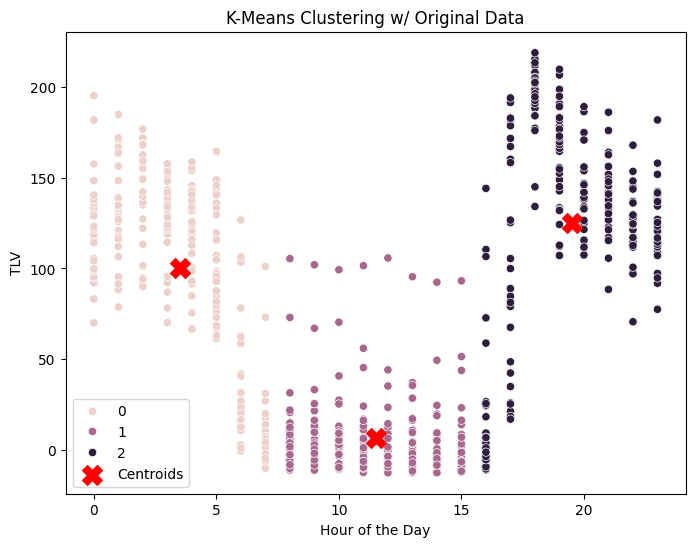

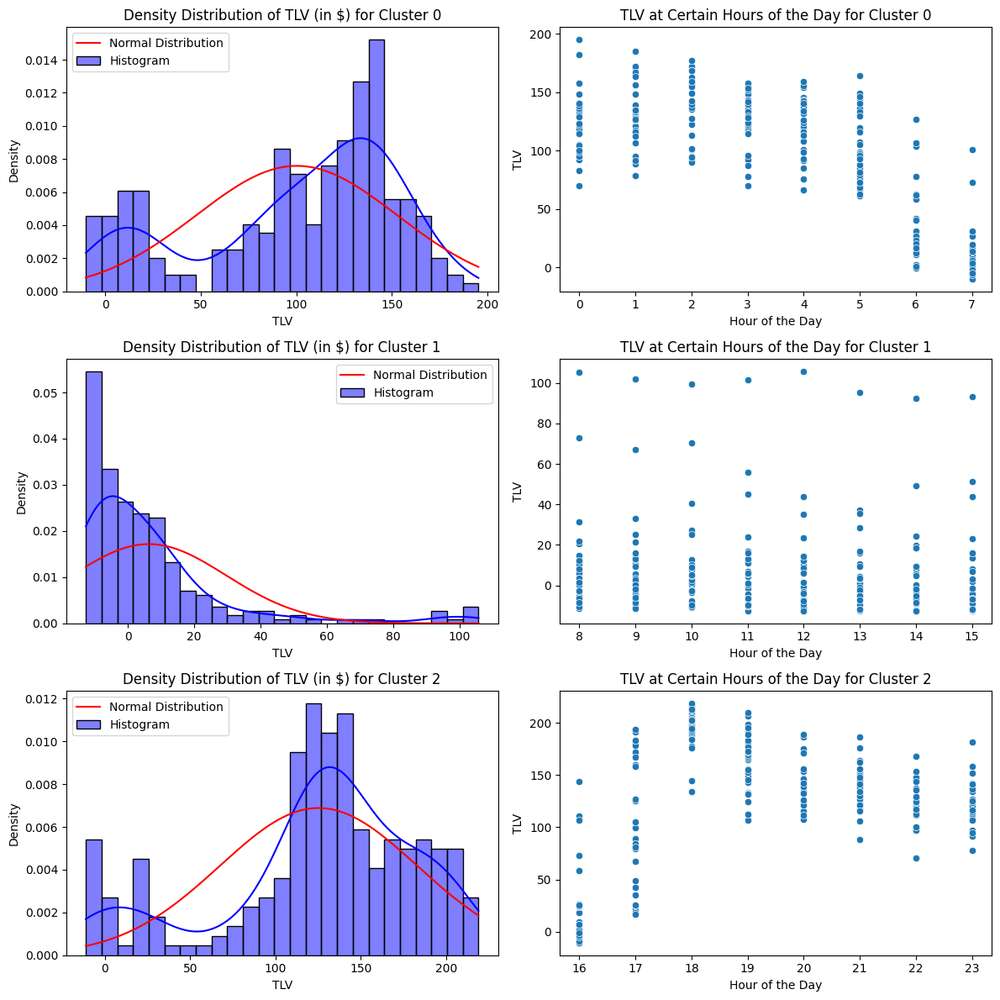

cluster weights:  {np.int64(0): array([157.16068804, -16.27987534]), np.int64(1): array([21.40212015, -1.31222268]), np.int64(2): array([-27.06560362,   7.81281989])}
cluster square loss risk:  40.48110995732239


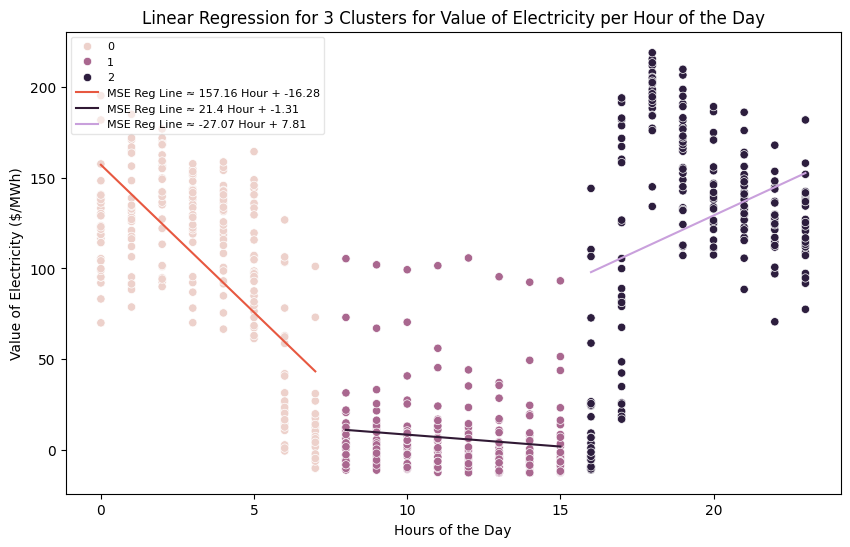

empirical risk:  40.48110995732239


In [98]:
linear_cluster_analysis(jun_temporal_melted, month)

sigma:  2.3
weight vector:  [ 90.92656517  93.33664899  63.38831673 -15.82374382   8.45791519
  18.74475062 -50.88416447 160.47150563  61.22740729 101.9664735 ]
risk w.r.t. RMSE:  29.798925070569286


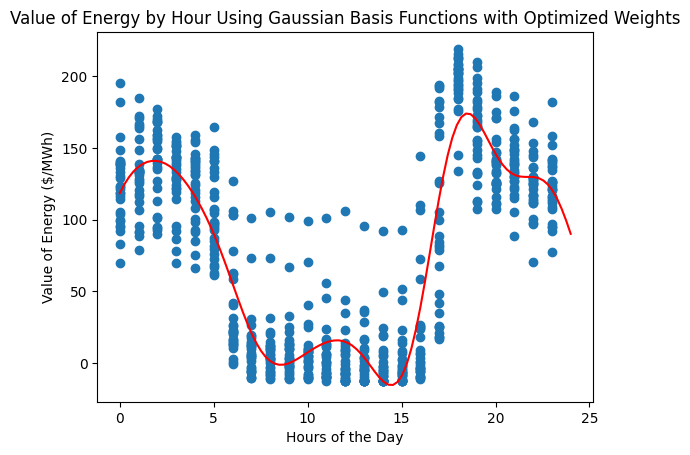

In [99]:
gaussian_basis(x,y, month)

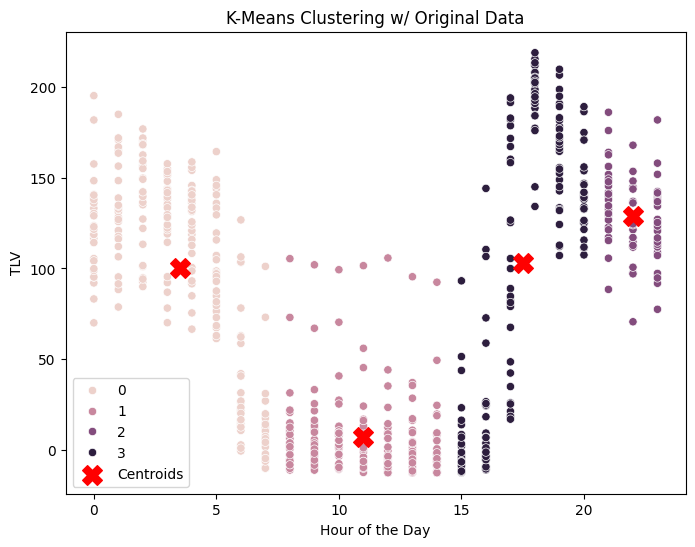

sigma:  1.25
weight vector:  [-10.58296715  43.46737264 171.20269582 100.58636831]


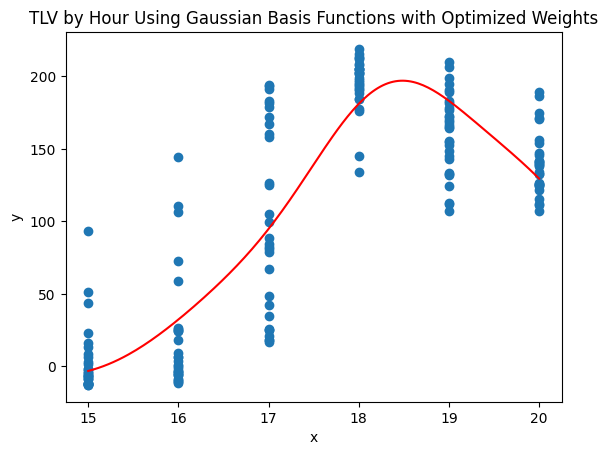

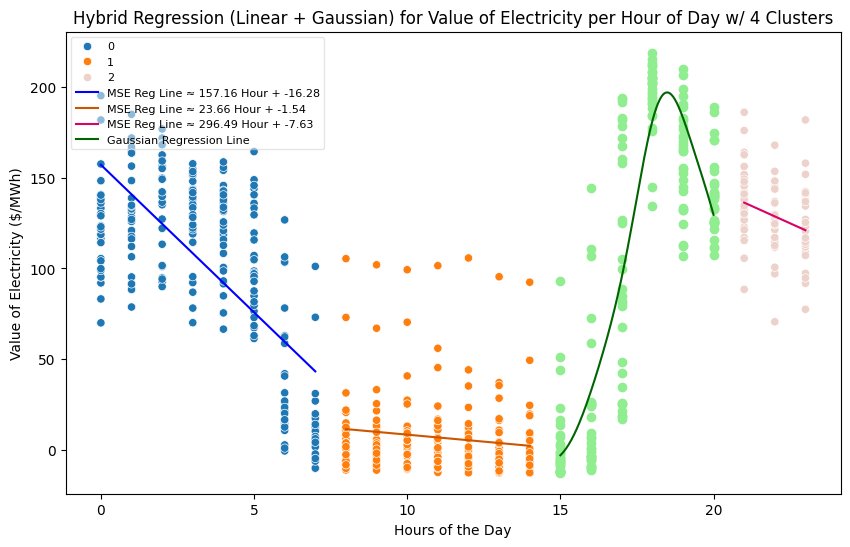

RMSE:  31.923521369502406


In [100]:
reg_errors.loc['June', 'Linear+Gaussian+Cluster '] = linear_cluster_gaussian('June', 2024)

In [101]:
reg_errors

,Linear,KNN,Linear+Cluster,Gaussian Basis,Linear+Gaussian+Cluster
January,67.085515,29.332051,31.686737,31.911611,29.793676
February,78.235041,37.603173,38.985567,36.051992,34.914149
March,75.637477,33.076676,40.854265,32.398047,34.557976
April,65.710803,32.251309,45.226873,35.307078,36.474276
May,66.339201,34.452376,42.806009,33.541146,33.810214
June,69.154523,27.445775,40.48111,29.798925,31.923521
July,NaN,NaN,NaN,NaN,NaN
August,564.589201,511.942825,NaN,496.035433,491.987883
September,NaN,NaN,NaN,NaN,NaN
October,NaN,NaN,NaN,NaN,NaN


---

### July

                         1           2           3           4           5   \
Hour of the Day                                                               
0                116.217783  165.099609  120.916832  177.381093  177.883882   
1                150.676335  151.005334  142.102105  162.431849  151.993461   
2                142.933738  145.452065  134.999621  148.335251  134.996302   
3                144.096771  141.001975  135.683373  145.377826  141.051692   
4                139.074031  139.449697  116.868354  120.215436  145.822183   

                         6           7           8           9           10  \
Hour of the Day                                                               
0                177.604177  162.548262  188.750803  130.607016  182.575601   
1                162.391916  159.142187  160.198892  159.193120  158.758492   
2                155.975777  158.479501  140.814562  156.875622  143.182319   
3                157.193005  143.512776  139.138356

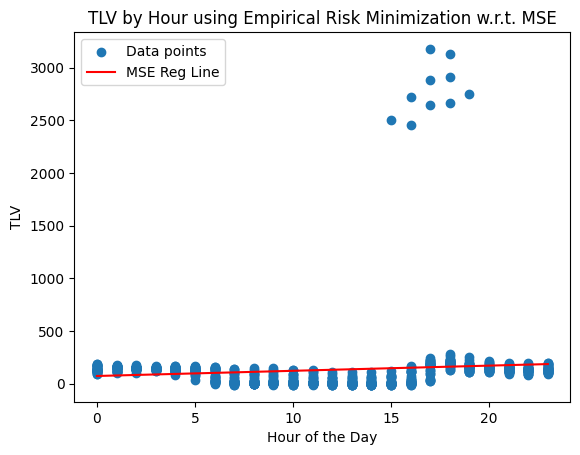

In [102]:
month = "July"
jul_data = load_dataset(month, 2024)[2]
jul_temporal_melted = load_dataset(month, 2024)[3]

x = load_dataset(month, 2024)[0]
y = load_dataset(month, 2024)[1]
print(jul_data.head())

x_matrix = lin_reg(x, y, month)

MSE for KNN: 417.23156408227754


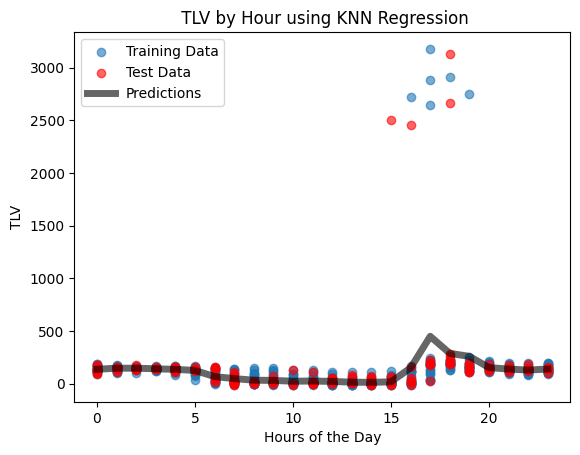

In [103]:
# Splitting data into test and training data
X_train, X_test, y_train, y_test = train_test_split(x_matrix, y, test_size=0.2, random_state=42)
X_train, X_test, y_train, y_test

k = round(np.sqrt(len(x_matrix))) #letting k = square root of n
y_train = np.array(y_train)

y_pred = knn_predict(X_train, y_train, X_test, k=k) #KNN predictons for TLV

# Evaluate the model
mse = np.sqrt(mean_squared_error(y_test, y_pred))
reg_errors.loc[month,'KNN'] = mse
print(f"MSE for KNN: {mse}") # Much lower than MSE regression!

# Sort the test data and corresponding predictions for smooth plotting
sorted_indices = np.argsort(X_test[:,1].flatten())
X_test_sorted = X_test[:,1].flatten()[sorted_indices]
y_pred_sorted = y_pred[sorted_indices]

# Training Data
plt.scatter(X_train[:,1], y_train, label="Training Data", alpha=0.6)
# Testing Data
plt.scatter(X_test[:,1], y_test, label="Test Data", color="red", alpha=0.6)
# Predicted regression
plt.plot(X_test_sorted, y_pred_sorted, label="Predictions", color="black", alpha=0.6, linewidth = 5)

# Plot settings
plt.legend()
plt.xlabel("Hours of the Day")
plt.ylabel("TLV")
plt.title(" TLV by Hour using KNN Regression")
plt.show()

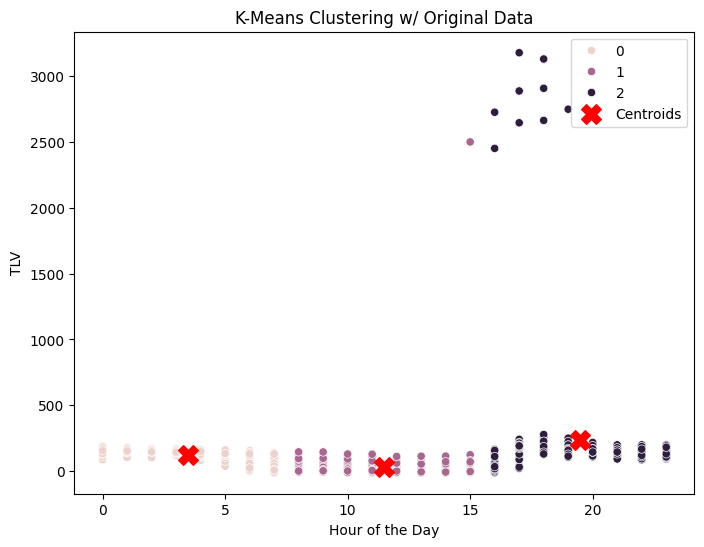

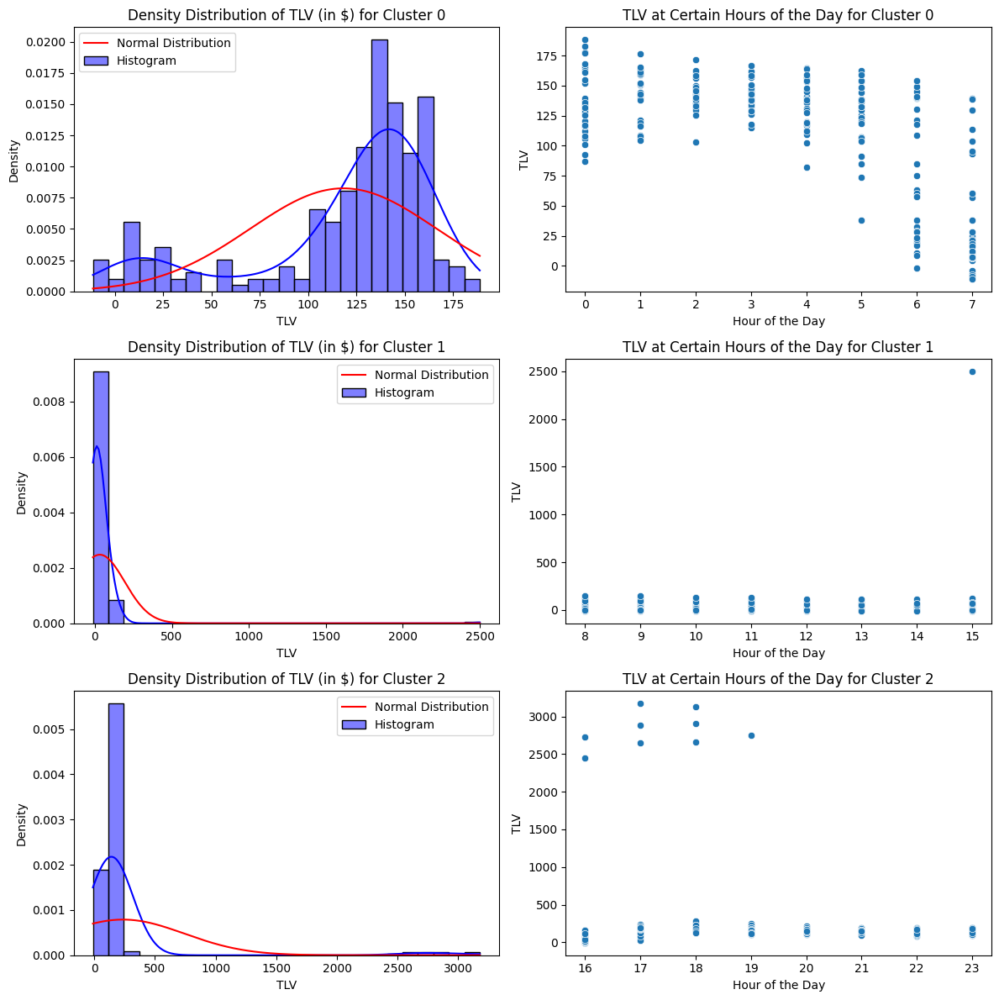

cluster weights:  {np.int64(0): array([164.31721215, -13.17054018]), np.int64(1): array([-17.66531898,   4.33608233]), np.int64(2): array([926.61064681, -35.43579078])}
cluster square loss risk:  303.26511945700213


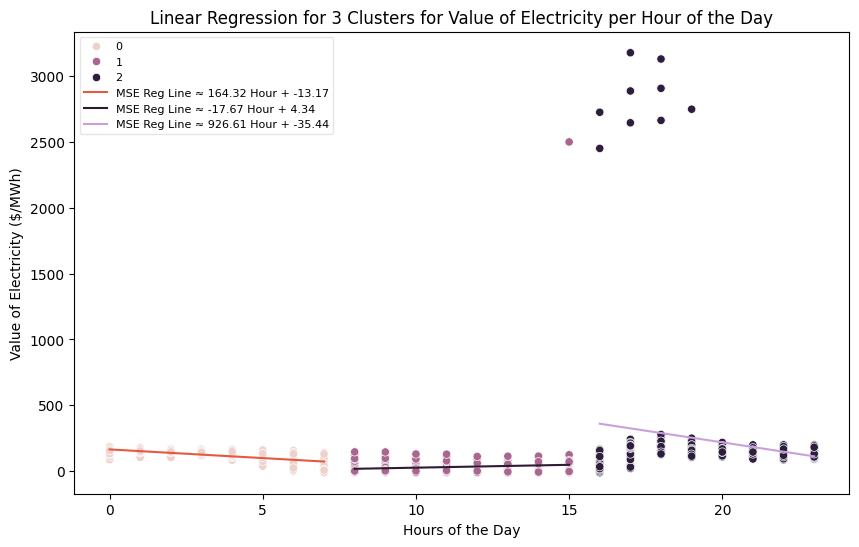

empirical risk:  303.26511945700213


KeyError: 'Cluster'

In [104]:
linear_cluster_analysis(jul_temporal_melted, month)

risk = compute_square_risk(jul_temporal_melted, compute_MSE_weights)
reg_errors.loc['July','Linear+Cluster'] = risk

In [ ]:
gaussian_basis(x,y, month)

In [ ]:
reg_errors.loc['July', 'Linear+Gaussian+Cluster '] = linear_cluster_gaussian('July', 2024)

---

### September

                         1           2           3           4           5   \
Hour of the Day                                                               
0                198.554393  220.656353  191.648511  190.439216  200.844329   
1                192.381646  179.179418  187.886833  202.990154  198.098088   
2                163.188643  170.250013  181.438721  163.067271  163.098943   
3                158.390578  172.354146  167.725812  169.955015  172.056325   
4                167.460516  174.840291  166.474181  169.313260  177.929743   

                         6           7           8           9           10  \
Hour of the Day                                                               
0                214.170792  193.966982  183.478404  170.702800  152.330446   
1                199.570011  181.470686  158.087919  191.567540  183.148350   
2                179.621031  170.806773  153.210376  197.057187  179.241790   
3                178.252424  168.884307  149.504772

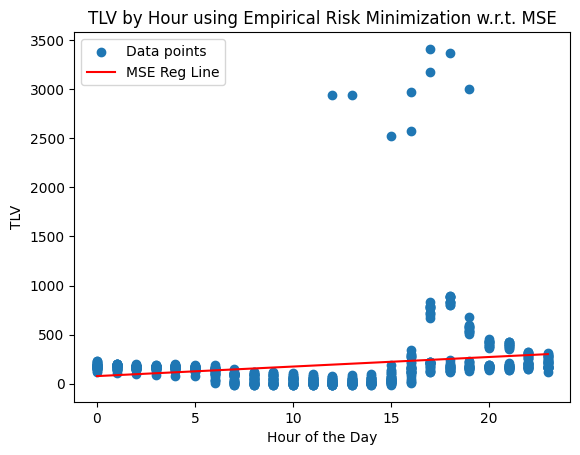

In [105]:
month = "September"
sep_data = load_dataset(month, 2024)[2]
sep_temporal_melted = load_dataset(month, 2024)[3]

x = load_dataset(month, 2024)[0]
y = load_dataset(month, 2024)[1]
print(sep_data.head())

x_matrix = lin_reg(x, y, month)

MSE for KNN: 485.6109795295475


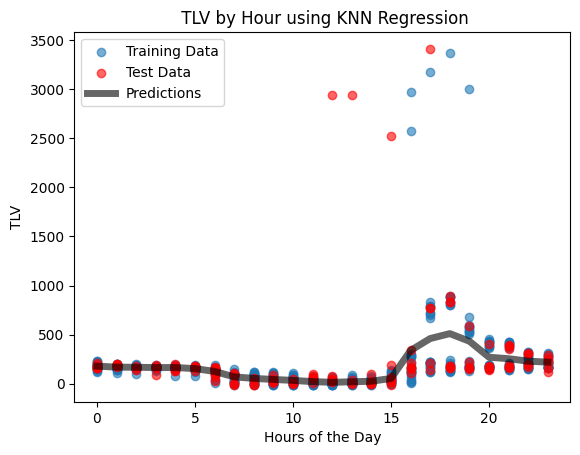

In [106]:
# Splitting data into test and training data
X_train, X_test, y_train, y_test = train_test_split(x_matrix, y, test_size=0.2, random_state=42)
X_train, X_test, y_train, y_test

k = round(np.sqrt(len(x_matrix))) #letting k = square root of n
y_train = np.array(y_train)

y_pred = knn_predict(X_train, y_train, X_test, k=k) #KNN predictons for TLV

# Evaluate the model
mse = np.sqrt(mean_squared_error(y_test, y_pred))
reg_errors.loc[month,'KNN'] = mse
print(f"MSE for KNN: {mse}") # Much lower than MSE regression!

# Sort the test data and corresponding predictions for smooth plotting
sorted_indices = np.argsort(X_test[:,1].flatten())
X_test_sorted = X_test[:,1].flatten()[sorted_indices]
y_pred_sorted = y_pred[sorted_indices]

# Training Data
plt.scatter(X_train[:,1], y_train, label="Training Data", alpha=0.6)
# Testing Data
plt.scatter(X_test[:,1], y_test, label="Test Data", color="red", alpha=0.6)
# Predicted regression
plt.plot(X_test_sorted, y_pred_sorted, label="Predictions", color="black", alpha=0.6, linewidth = 5)

# Plot settings
plt.legend()
plt.xlabel("Hours of the Day")
plt.ylabel("TLV")
plt.title(" TLV by Hour using KNN Regression")
plt.show()

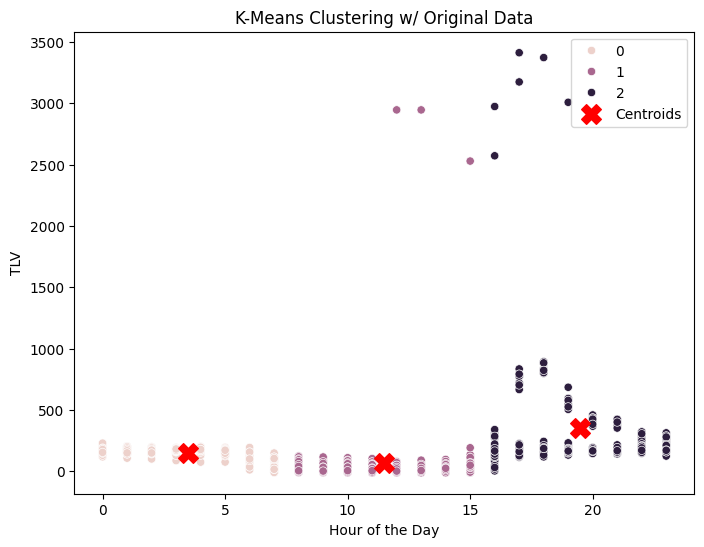

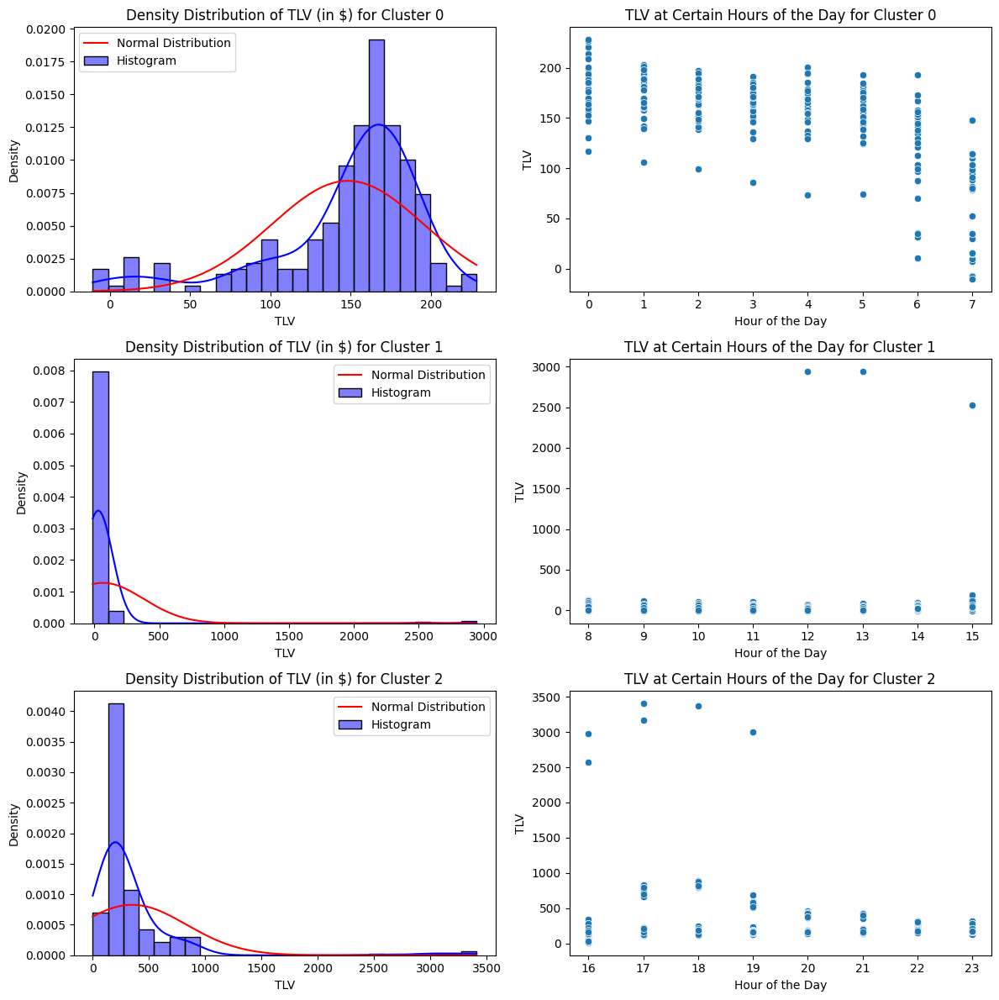

cluster weights:  {np.int64(0): array([194.50172258, -13.20588435]), np.int64(1): array([-53.25640177,  10.40683976]), np.int64(2): array([1174.93871616,  -42.16654483])}
cluster square loss risk:  326.6677542916112


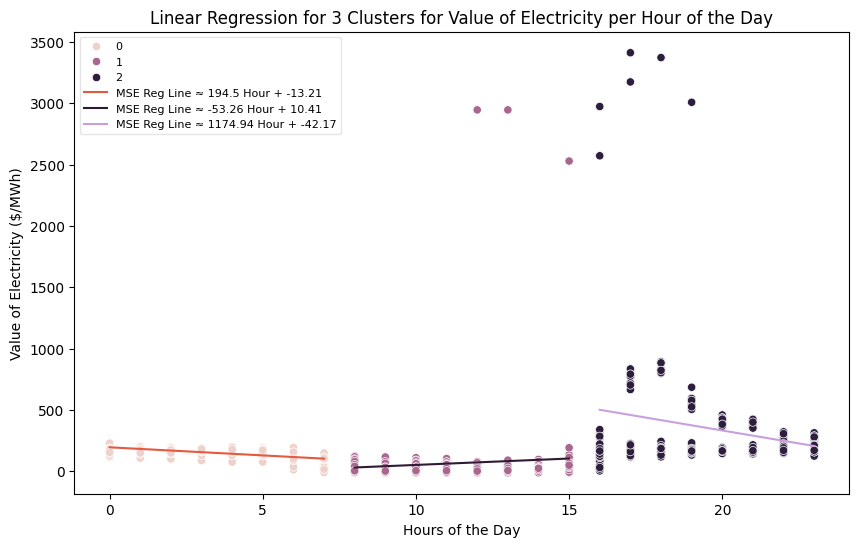

empirical risk:  326.6677542916112


In [107]:
linear_cluster_analysis(sep_temporal_melted, month)
reg_errors.loc["September", "Linear+Cluster"] = np.nan

sigma:  2.3
weight vector:  [148.39321472  82.36957071 126.92694415   1.75644531  23.41514168
  63.84666021  15.84633275 563.1790701   -2.45612569 239.99896617]
risk w.r.t. RMSE:  323.4892903235809


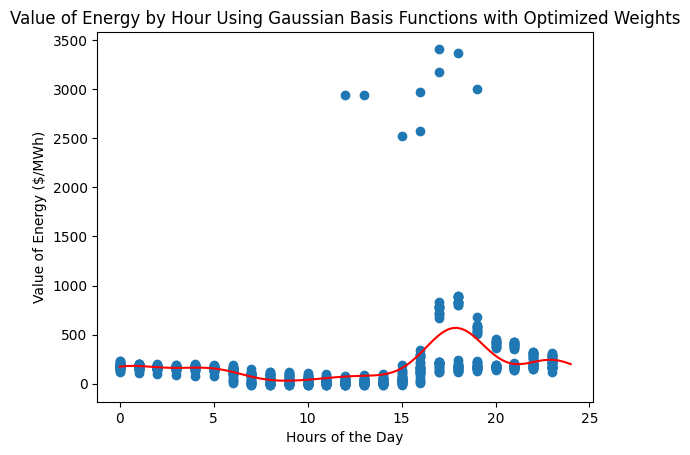

In [108]:
gaussian_basis(x,y, month)

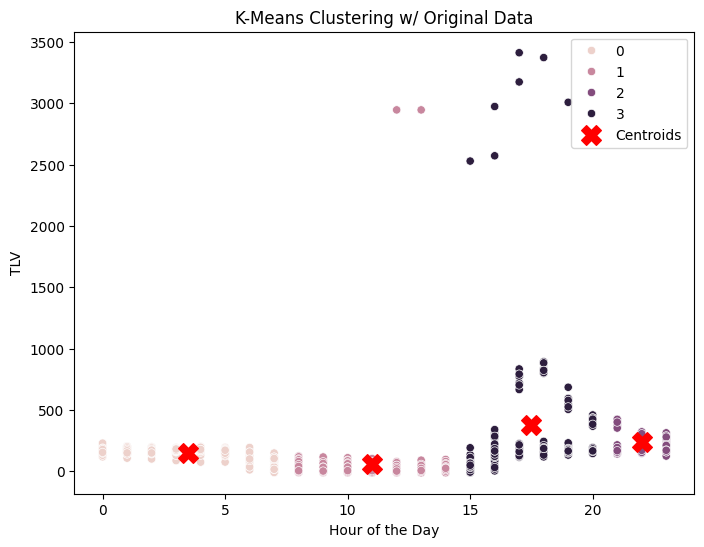

sigma:  1.25
weight vector:  [ 38.53790986 451.6368278  397.888122   196.1628761 ]


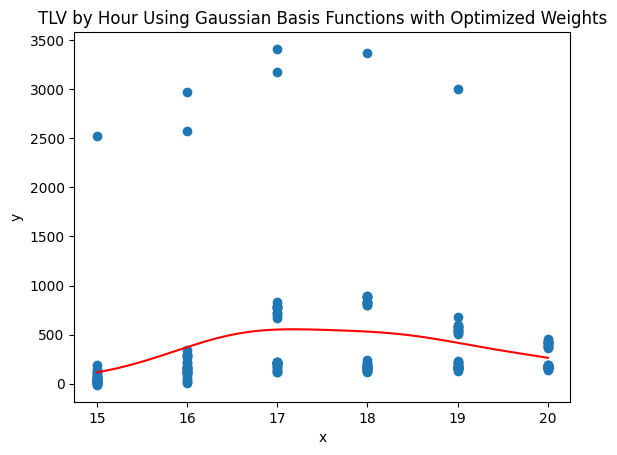

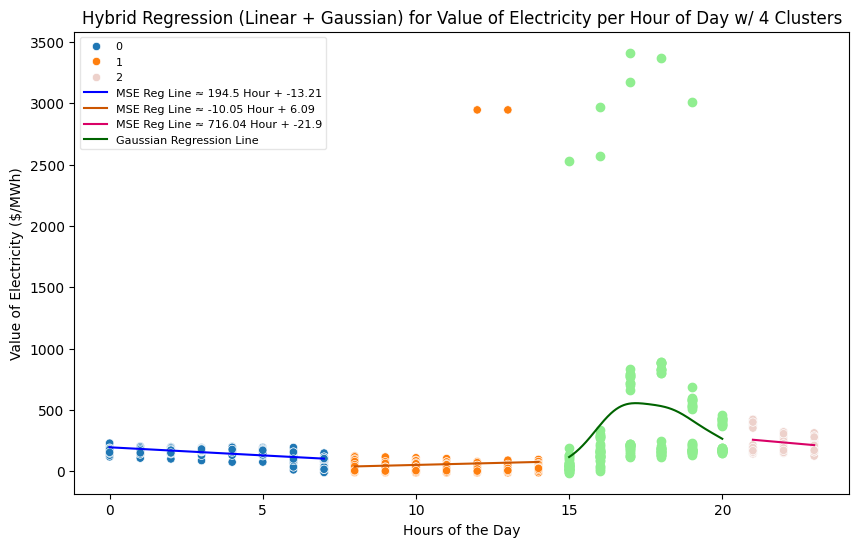

RMSE:  322.7779465601195


In [109]:
reg_errors.loc['September', 'Linear+Gaussian+Cluster '] = linear_cluster_gaussian('September', 2024)

In [110]:
reg_errors

,Linear,KNN,Linear+Cluster,Gaussian Basis,Linear+Gaussian+Cluster
January,67.085515,29.332051,31.686737,31.911611,29.793676
February,78.235041,37.603173,38.985567,36.051992,34.914149
March,75.637477,33.076676,40.854265,32.398047,34.557976
April,65.710803,32.251309,45.226873,35.307078,36.474276
May,66.339201,34.452376,42.806009,33.541146,33.810214
June,69.154523,27.445775,40.48111,29.798925,31.923521
July,316.695965,417.231564,303.265119,NaN,NaN
August,564.589201,511.942825,NaN,496.035433,491.987883
September,346.801031,485.61098,NaN,323.48929,322.777947
October,NaN,NaN,NaN,NaN,NaN


---

### October

                         1           2           3           4           5   \
Hour of the Day                                                               
0                177.039649  181.461105  181.397785  174.521703  163.940883   
1                183.222117  188.536826  192.852321  174.621516  156.088941   
2                193.299760  182.409301  167.793278  176.390169  154.465912   
3                189.287596  183.972947  171.480448  177.331229  171.351021   
4                179.755420  170.179855  188.536981  171.568724  163.469175   

                         6           7           8           9           10  \
Hour of the Day                                                               
0                139.501270  142.257197  182.192780  142.679616  167.661405   
1                130.650312  139.988864  203.987123  140.402379  200.164498   
2                125.444900  129.295561  178.233491  186.788647  186.260941   
3                140.736552  127.909954  173.595644

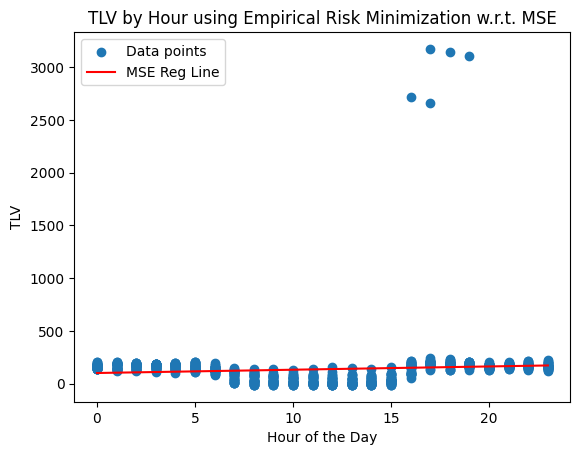

In [111]:
month = "October"
oct_data = load_dataset(month, 2024)[2]
oct_temporal_melted = load_dataset(month, 2024)[3]

x = load_dataset(month, 2024)[0]
y = load_dataset(month, 2024)[1]
print(oct_data.head())

x_matrix = lin_reg(x, y, month)

MSE for KNN: 324.34302280852177


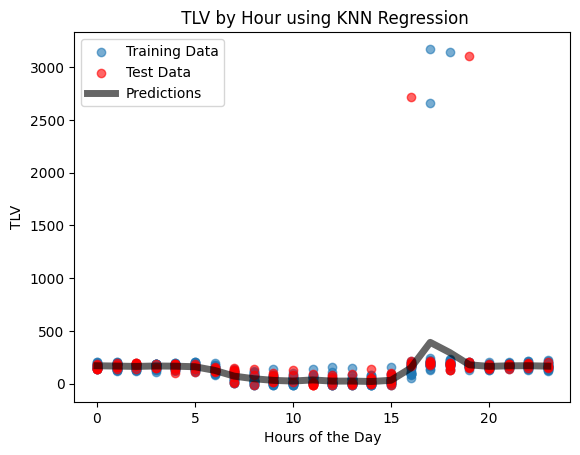

In [112]:
# Splitting data into test and training data
X_train, X_test, y_train, y_test = train_test_split(x_matrix, y, test_size=0.2, random_state=42)
X_train, X_test, y_train, y_test

k = round(np.sqrt(len(x_matrix))) #letting k = square root of n
y_train = np.array(y_train)

y_pred = knn_predict(X_train, y_train, X_test, k=k) #KNN predictons for TLV

# Evaluate the model
mse = np.sqrt(mean_squared_error(y_test, y_pred))
reg_errors.loc[month,'KNN'] = mse
print(f"MSE for KNN: {mse}") # Much lower than MSE regression!

# Sort the test data and corresponding predictions for smooth plotting
sorted_indices = np.argsort(X_test[:,1].flatten())
X_test_sorted = X_test[:,1].flatten()[sorted_indices]
y_pred_sorted = y_pred[sorted_indices]

# Training Data
plt.scatter(X_train[:,1], y_train, label="Training Data", alpha=0.6)
# Testing Data
plt.scatter(X_test[:,1], y_test, label="Test Data", color="red", alpha=0.6)
# Predicted regression
plt.plot(X_test_sorted, y_pred_sorted, label="Predictions", color="black", alpha=0.6, linewidth = 5)

# Plot settings
plt.legend()
plt.xlabel("Hours of the Day")
plt.ylabel("TLV")
plt.title(" TLV by Hour using KNN Regression")
plt.show()

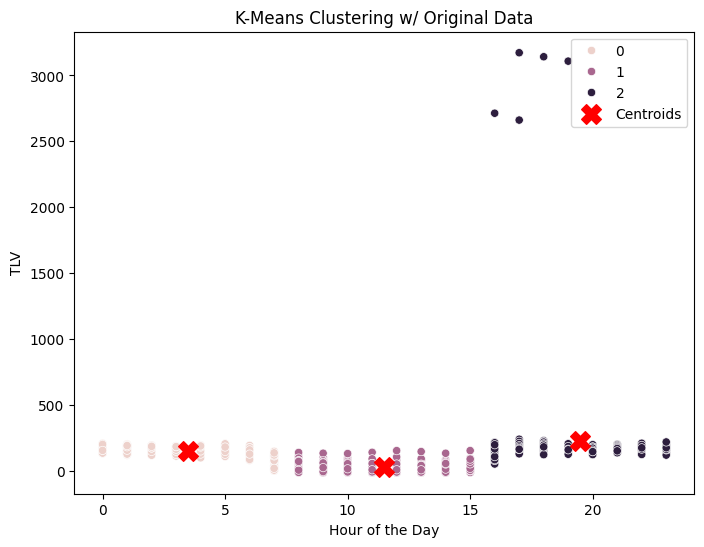

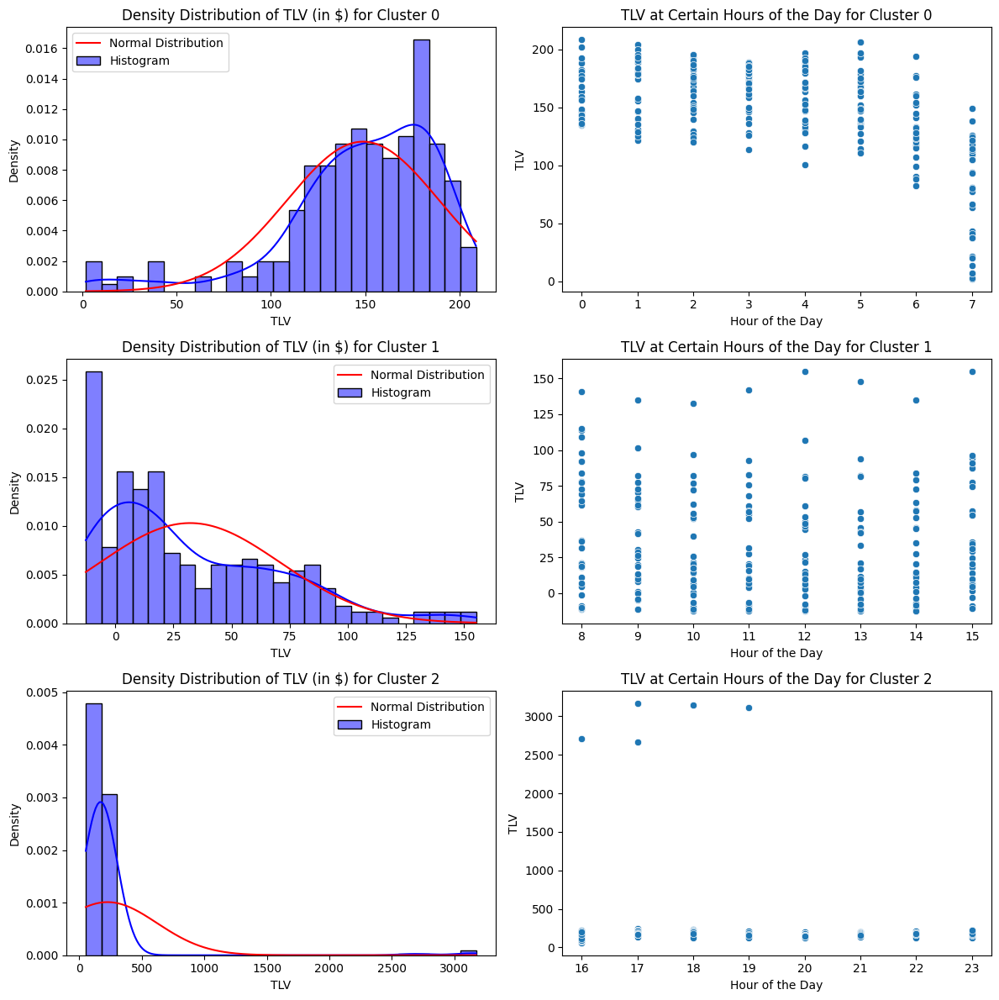

cluster weights:  {np.int64(0): array([182.02821024,  -9.47701249]), np.int64(1): array([52.9334208, -1.8079281]), np.int64(2): array([668.27530031, -22.63056544])}
cluster square loss risk:  227.56093768189749


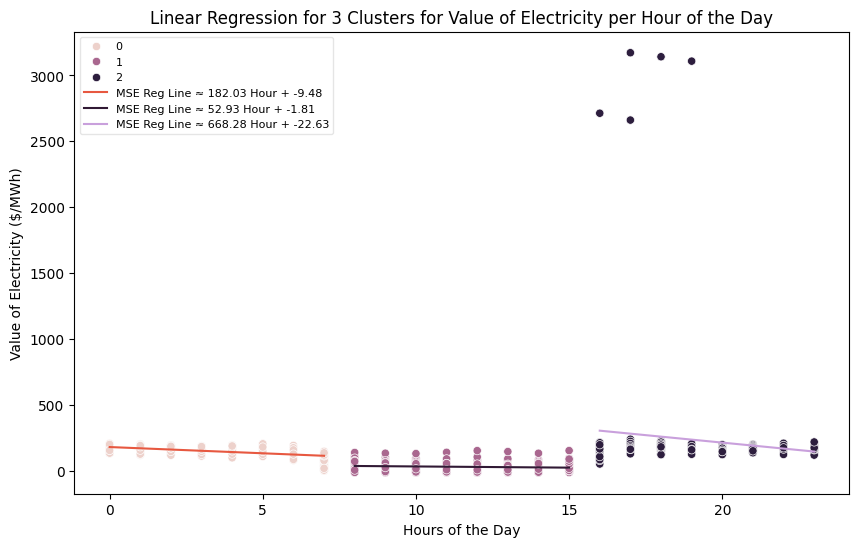

empirical risk:  227.56093768189749


In [113]:
linear_cluster_analysis(oct_temporal_melted, month)
reg_errors.loc["October", "Linear+Cluster"] = np.nan

sigma:  2.3
weight vector:  [136.66570096  81.35442587 134.97208549   0.5215829   41.33545105
 -15.16858323  33.95251186 327.54955541   2.61736167 178.86758077]
risk w.r.t. RMSE:  226.99547545225408


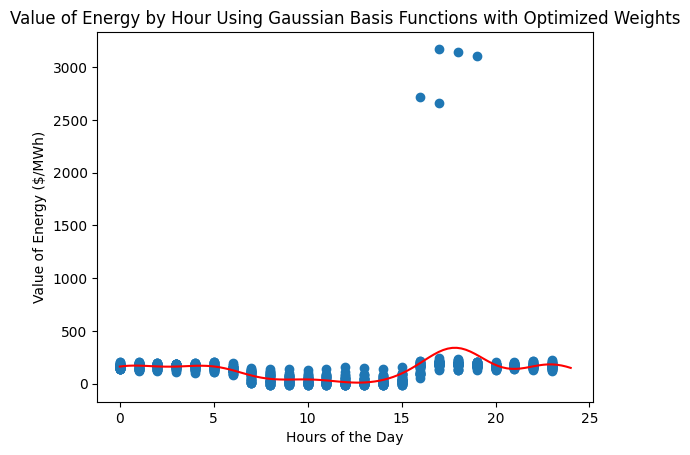

In [114]:
gaussian_basis(x,y, month)

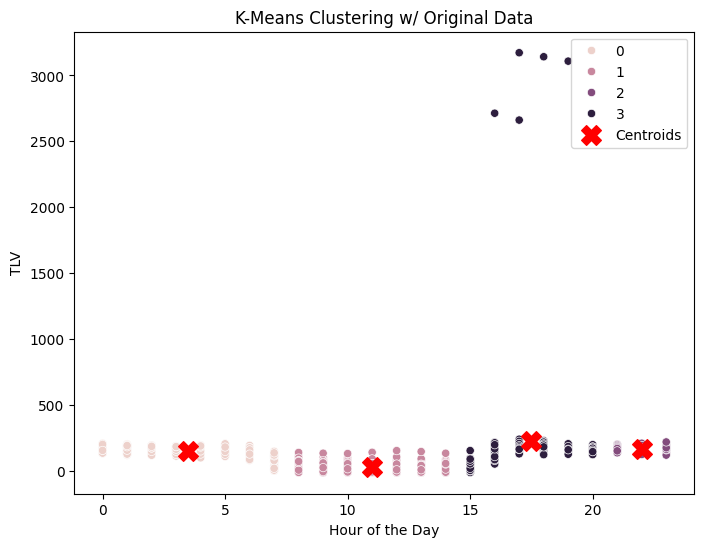

sigma:  1.25
weight vector:  [-15.53819101 313.89061621 207.13527793 140.5106069 ]


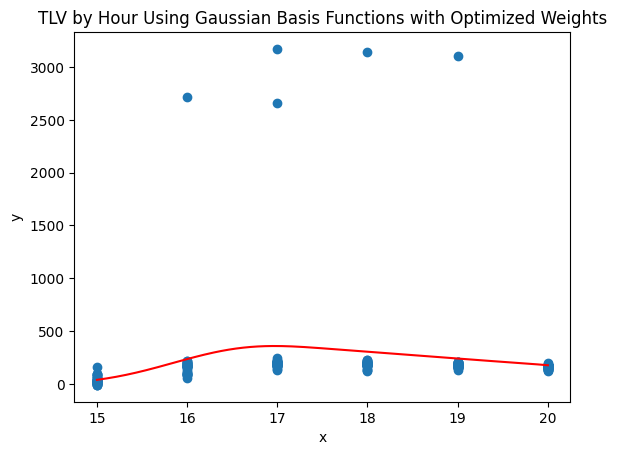

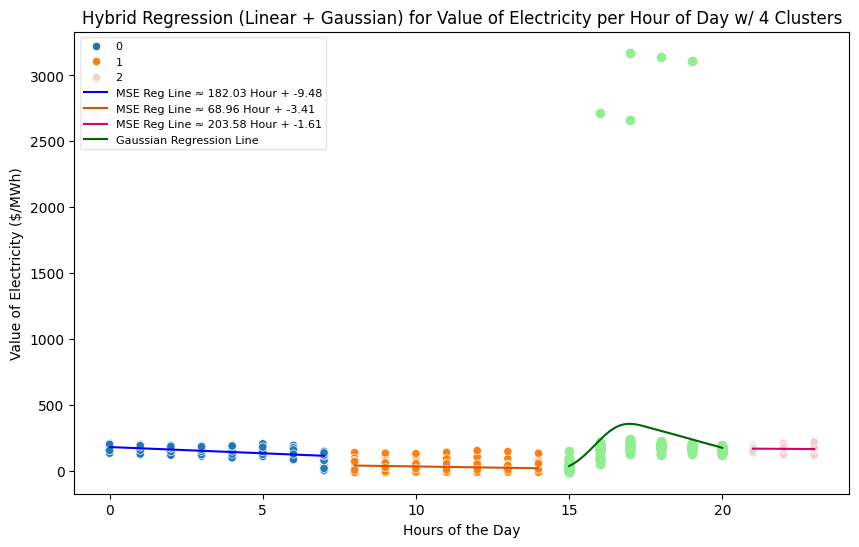

RMSE:  226.14450927381438


In [115]:
reg_errors.loc['October', 'Linear+Gaussian+Cluster '] = linear_cluster_gaussian('October', 2024)

---

### November

                         1           2           3           4           5   \
Hour of the Day                                                               
0                187.278117  208.433529  139.657068  129.193934  138.434223   
1                180.381397  183.008765  138.502666  108.751365  139.289556   
2                157.213788  176.597429  136.844560  109.728508  144.746769   
3                151.024813  179.316520  140.748019  123.517684  152.614969   
4                162.989616  170.641542  133.818212  136.459135  156.704857   

                         6           7           8           9           10  \
Hour of the Day                                                               
0                179.571323  186.576306  141.432057  196.839683  172.139803   
1                196.823677  180.231679  179.606380  191.441609  182.219201   
2                187.235114  172.008239  172.921605  191.617480  175.725677   
3                170.581803  175.437423  178.525899

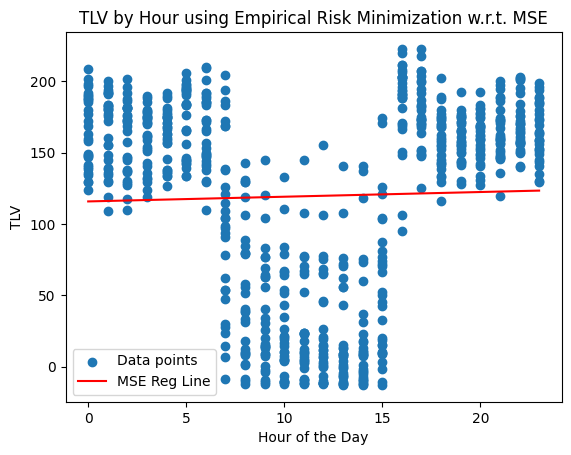

In [116]:
month = "November"
nov_data = load_dataset(month, 2024)[2]
nov_temporal_melted = load_dataset(month, 2024)[3]

x = load_dataset(month, 2024)[0]
y = load_dataset(month, 2024)[1]
print(nov_data.head())

x_matrix = lin_reg(x, y, month)

MSE for KNN: 32.279976771363906


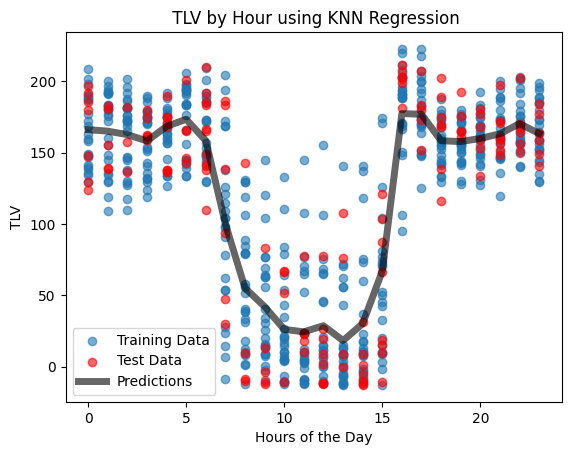

In [117]:
# Splitting data into test and training data
X_train, X_test, y_train, y_test = train_test_split(x_matrix, y, test_size=0.2, random_state=42)
X_train, X_test, y_train, y_test

k = round(np.sqrt(len(x_matrix))) #letting k = square root of n
y_train = np.array(y_train)

y_pred = knn_predict(X_train, y_train, X_test, k=k) #KNN predictons for TLV

# Evaluate the model
mse = np.sqrt(mean_squared_error(y_test, y_pred))
reg_errors.loc[month,'KNN'] = mse
print(f"MSE for KNN: {mse}") # Much lower than MSE regression!

# Sort the test data and corresponding predictions for smooth plotting
sorted_indices = np.argsort(X_test[:,1].flatten())
X_test_sorted = X_test[:,1].flatten()[sorted_indices]
y_pred_sorted = y_pred[sorted_indices]

# Training Data
plt.scatter(X_train[:,1], y_train, label="Training Data", alpha=0.6)
# Testing Data
plt.scatter(X_test[:,1], y_test, label="Test Data", color="red", alpha=0.6)
# Predicted regression
plt.plot(X_test_sorted, y_pred_sorted, label="Predictions", color="black", alpha=0.6, linewidth = 5)

# Plot settings
plt.legend()
plt.xlabel("Hours of the Day")
plt.ylabel("TLV")
plt.title(" TLV by Hour using KNN Regression")
plt.show()

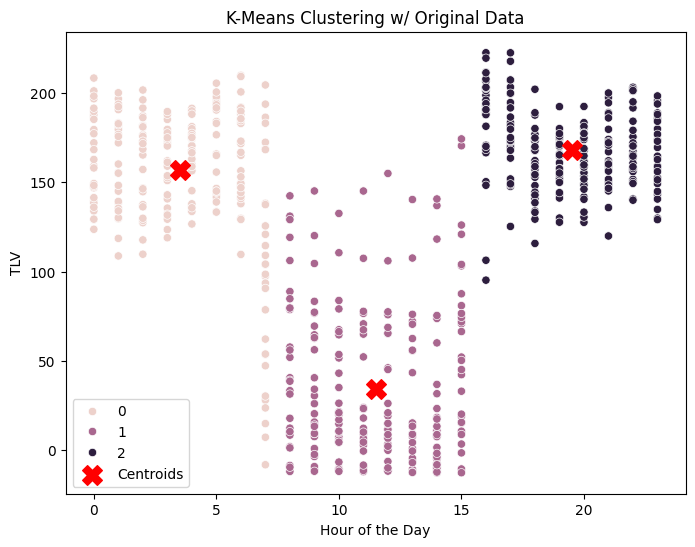

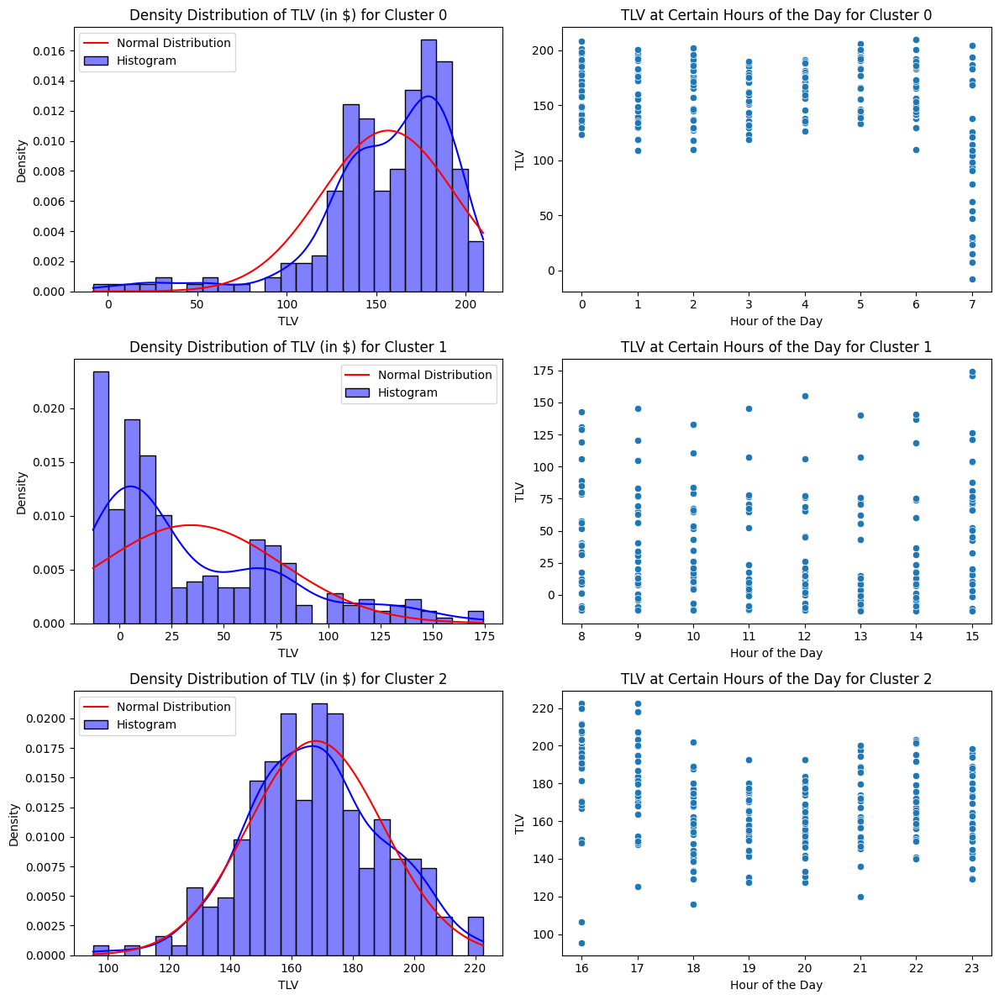

cluster weights:  {np.int64(0): array([174.39107134,  -5.04455678]), np.int64(1): array([44.08783383, -0.86146403]), np.int64(2): array([207.69902566,  -2.04246564])}
cluster square loss risk:  34.72466422912236


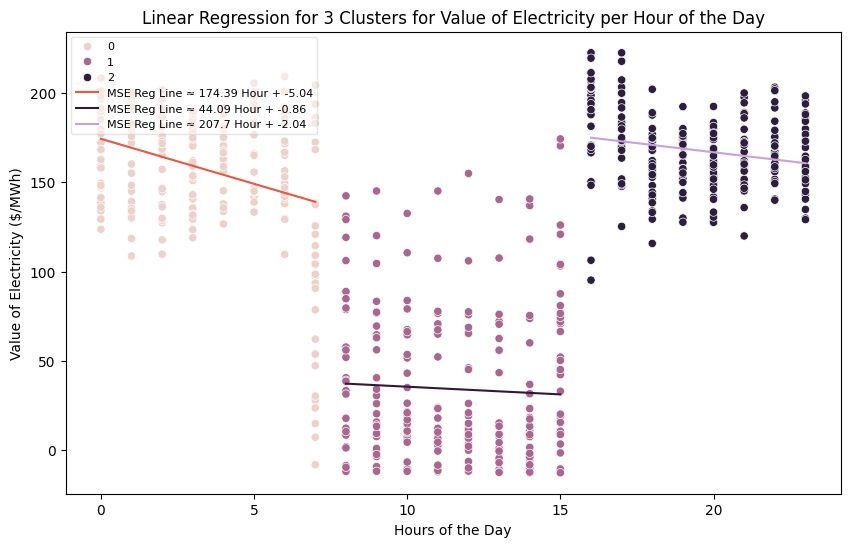

empirical risk:  34.72466422912236


In [118]:
linear_cluster_analysis(nov_temporal_melted, month)

sigma:  2.3
weight vector:  [146.51043165  64.48529792 155.77057114  11.0038716   36.33221921
 -22.10882543  71.88805419 138.57100366  69.80659424 146.37499821]
risk w.r.t. RMSE:  35.825654057649636


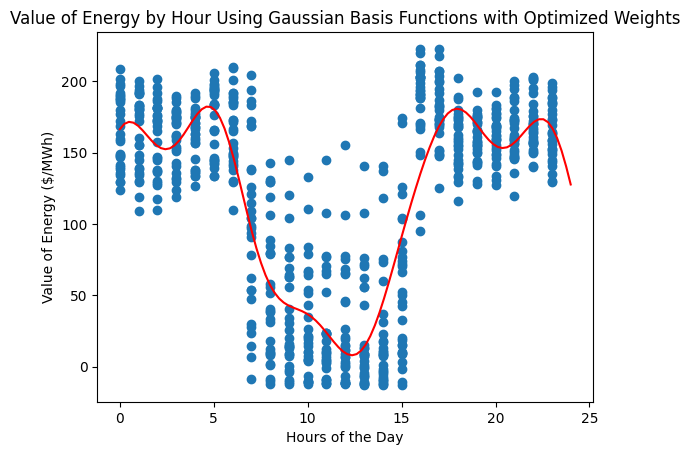

In [119]:
gaussian_basis(x,y, month)

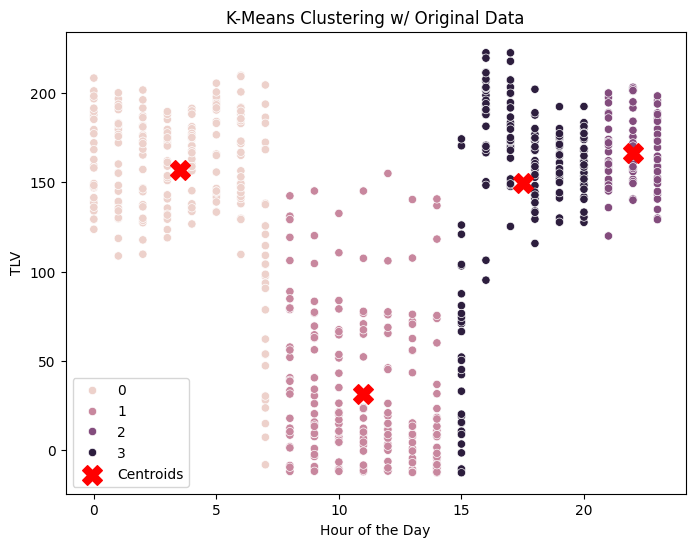

sigma:  1.25
weight vector:  [ 37.7535431  178.39445827  94.44251075 147.93062202]


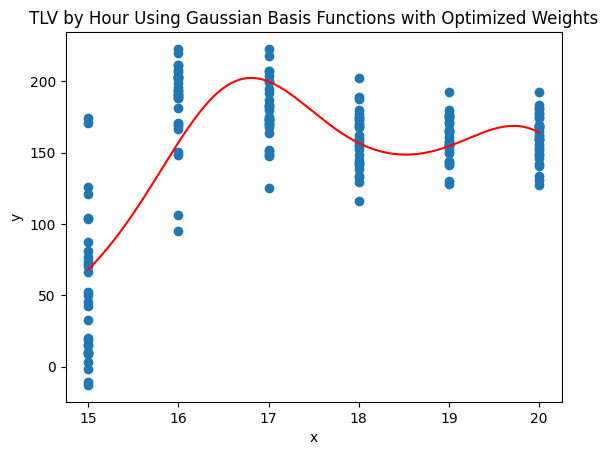

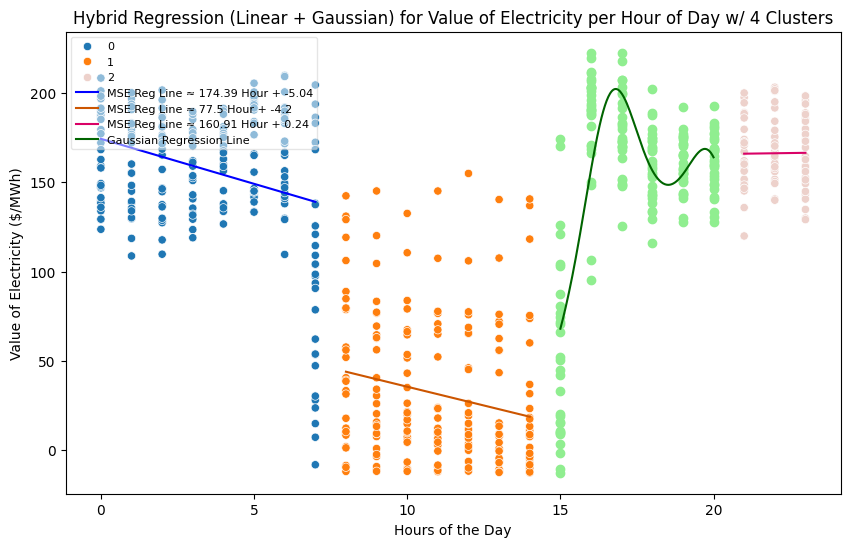

RMSE:  34.81440724711506


In [120]:
reg_errors.loc['November', 'Linear+Gaussian+Cluster '] = linear_cluster_gaussian('November', 2024)

# month = 'November'
# year = 2024
# melted_df = load_dataset(month, year)[3]
# nonpeak_df = melted_df[(melted_df['Hour of the Day'] < 15)]
# peak_df = melted_df[(melted_df['Hour of the Day'] >=  15) & (melted_df['Hour of the Day'] <= 20)]
# fourth_cluster_df = melted_df[(melted_df['Hour of the Day'] >  20)]

# nonpeak_clustered = create_clusters(nonpeak_df, k = 2)[0]
# nonpeak_clustered_centroids = create_clusters(nonpeak_df, k = 2)[3]

# peak_clustered = create_clusters(peak_df, k = 1)[0]
# peak_clustered_centroids = create_clusters(peak_df, k = 1)[3]
# peak_clustered['Cluster'] = 3

# fourth_clustered = create_clusters(fourth_cluster_df, k = 1)[0]
# fourth_clustered_centroids = create_clusters(fourth_cluster_df, k = 1)[3]
# fourth_clustered['Cluster'] = 2

# centroids = combined = np.concatenate((nonpeak_clustered_centroids, peak_clustered_centroids, fourth_clustered_centroids))

# clustered = pd.concat([nonpeak_clustered, peak_clustered, fourth_clustered], ignore_index=True)

# plt.figure(figsize=(8, 6))
# sns.scatterplot(x=clustered['Hour of the Day'], y=clustered['Value'], hue=clustered['Cluster'])
# plt.scatter(centroids[:, 0], centroids[:, 1], color='red', marker='X', s=200, label='Centroids')
# plt.title('K-Means Clustering w/ Original Data')
# plt.ylabel('TLV')
# plt.legend()
# plt.show()

# peak_x = np.array(peak_df['Hour of the Day'])
# peak_y = np.array(peak_df['Value'])

# peak_n = 4
# peak_mu = np.linspace(min(peak_x), max(peak_x), peak_n)
# peak_sigma = (max(peak_x) - min(peak_x)) / peak_n

# peak_w = gaussian_weights(peak_x, peak_y, peak_mu, peak_sigma) #Optimal weight vectors given x and y in dataset

# print("sigma: ", peak_sigma)
# print("weight vector: ", peak_w)

# # Plotting H(x) prediction line on data
# x_reg = np.linspace(15, 20, len(peak_x))
# H= plot_h(x_reg, peak_mu, peak_w, peak_sigma)

# plt.plot(x_reg, H, color="red")
# plt.scatter(peak_x, peak_y)

# # Add labels and legend
# plt.xlabel('x')
# plt.ylabel('y')
# plt.title('TLV by Hour Using Gaussian Basis Functions with Optimized Weights')
# plt.show()

# plt.figure(figsize=(10, 6))
# nonpeak_x = nonpeak_clustered['Hour of the Day']
# nonpeak_y = nonpeak_clustered['Value']

# fourth_x = fourth_clustered['Hour of the Day']
# fourth_y = fourth_clustered['Value']

# sns.scatterplot(x=nonpeak_x, y=nonpeak_y,  hue=nonpeak_clustered['Cluster'])
# sns.scatterplot(x=fourth_x, y=fourth_y,  hue=fourth_clustered['Cluster'])


# # Labels and title
# plt.xlabel('Hours of the Day')
# plt.ylabel('TLV')
# plt.title('Regression wrt MSE for 4 Clusters for TLV using Linear + Gaussian Reg')

# nonpeak_4_clustered = pd.concat([nonpeak_clustered,fourth_clustered])

# w = compute_MSE_weights(nonpeak_4_clustered)
# colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'olive', 'cyan']


# boundary_sum = 0

# for i, color in zip(np.unique(nonpeak_4_clustered['Cluster']), colors):

#     cluster = nonpeak_4_clustered[nonpeak_4_clustered['Cluster'] == i]

#     if i == 1:
#         boundary_sum += cluster.sort_values(by="Hour of the Day", ascending=False).iloc[0]['Hour of the Day']
#     if i == 0:
#         boundary_sum += cluster.sort_values(by="Hour of the Day", ascending=True).iloc[0]['Hour of the Day']

# boundary_01 = boundary_sum/2
        

# for i, color in zip(np.unique(nonpeak_4_clustered['Cluster']), colors):

#     cluster = nonpeak_4_clustered[nonpeak_4_clustered['Cluster'] == i]
        
#     # Plot regression line
#     if i == 1:
#         reg_x_max = boundary_01
#         reg_x_min = cluster.sort_values(by="Hour of the Day", ascending=True).iloc[0]['Hour of the Day']
#     elif i == 0:
#         reg_x_max = cluster.sort_values(by="Hour of the Day", ascending=False).iloc[0]['Hour of the Day']
#         reg_x_min = boundary_01
#     else:
#         reg_x_min = cluster.sort_values(by="Hour of the Day", ascending=True).iloc[0]['Hour of the Day']
#         reg_x_max = cluster.sort_values(by="Hour of the Day", ascending=False).iloc[0]['Hour of the Day']
#     reg_x_range = np.linspace(reg_x_min, reg_x_max, 1000)
#     reg_line = w[i][1] * reg_x_range + w[i][0]
#     plt.plot(reg_x_range, reg_line, color=color, label=f'MSE Reg Line ≈ {np.round(w[i][0], 2)} Hour + {np.round(w[i][1], 2)}')

# peak_x = peak_clustered['Hour of the Day']
# peak_y = peak_clustered['Value']

# plt.plot(x_reg, H, color="purple")
# plt.scatter(peak_x, peak_y, color = "blue", alpha=0.5)

# # Show the plot
# plt.legend(loc='lower left', framealpha=0.5, fontsize=8)
# plt.show()

# #Calculating RMSE
# weights_dict = compute_MSE_weights(nonpeak_4_clustered)

# actual_values = []
# pred_values = []

# for i in np.unique(nonpeak_4_clustered['Cluster']):
#     cluster = nonpeak_4_clustered[nonpeak_4_clustered['Cluster'] == i]
#     w = np.array(weights_dict[i])

#     x = np.array(cluster["Hour of the Day"])
#     y = np.array(cluster["Value"])  # get actual values as array

#     # Augmenting X with bias term
#     x_matrix = np.column_stack((np.ones_like(x), x))

#     # Store actual and predicted values
#     actual_values.extend(y)
#     pred_values.extend(x_matrix @ w)  # vectorized prediction

# nonpeak_values = pd.DataFrame({'Pred Values': pred_values, 'Actual Values': actual_values})

# pred_peak_y = plot_h(peak_x, peak_mu, peak_w, peak_sigma)
# peak_values = pd.DataFrame({'Pred Values': pred_peak_y, 'Actual Values': peak_y})

# values = pd.concat([nonpeak_values, peak_values], ignore_index=True)
          


---

### December

                         1           2           3           4           5   \
Hour of the Day                                                               
0                188.478187  159.938806  164.007239  180.862828  176.469526   
1                155.983217  212.702542  165.186850  173.558169  173.968393   
2                198.162120  188.739662  164.558389  168.138759  186.392889   
3                176.391337  187.912517  167.649577  177.066078  187.638480   
4                185.683586  182.095172  173.638025  177.138017  191.838373   

                         6           7           8           9           10  \
Hour of the Day                                                               
0                270.553197  206.873371  173.887847  152.974791  164.184820   
1                278.360203  193.722516  157.769921  150.691986  164.178734   
2                246.202908  187.124626  158.817363  169.328639  165.202689   
3                235.876604  193.240255  160.224397

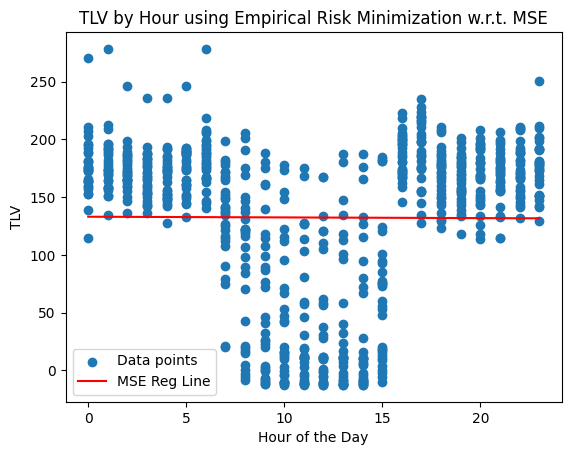

In [121]:
month = "December"
dec_data = load_dataset(month, 2024)[2]
dec_temporal_melted = load_dataset(month, 2024)[3]

x = load_dataset(month, 2024)[0]
y = load_dataset(month, 2024)[1]
print(dec_data.head())

x_matrix = lin_reg(x, y, month)

MSE for KNN: 41.39416772631126


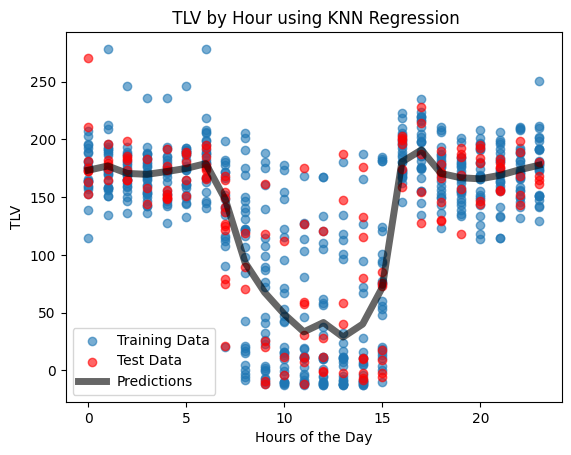

In [122]:
# Splitting data into test and training data
X_train, X_test, y_train, y_test = train_test_split(x_matrix, y, test_size=0.2, random_state=42)
X_train, X_test, y_train, y_test

k = round(np.sqrt(len(x_matrix))) #letting k = square root of n
y_train = np.array(y_train)

y_pred = knn_predict(X_train, y_train, X_test, k=k) #KNN predictons for TLV

# Evaluate the model
mse = np.sqrt(mean_squared_error(y_test, y_pred))
reg_errors.loc[month,'KNN'] = mse
print(f"MSE for KNN: {mse}") # Much lower than MSE regression!

# Sort the test data and corresponding predictions for smooth plotting
sorted_indices = np.argsort(X_test[:,1].flatten())
X_test_sorted = X_test[:,1].flatten()[sorted_indices]
y_pred_sorted = y_pred[sorted_indices]

# Training Data
plt.scatter(X_train[:,1], y_train, label="Training Data", alpha=0.6)
# Testing Data
plt.scatter(X_test[:,1], y_test, label="Test Data", color="red", alpha=0.6)
# Predicted regression
plt.plot(X_test_sorted, y_pred_sorted, label="Predictions", color="black", alpha=0.6, linewidth = 5)

# Plot settings
plt.legend()
plt.xlabel("Hours of the Day")
plt.ylabel("TLV")
plt.title(" TLV by Hour using KNN Regression")
plt.show()

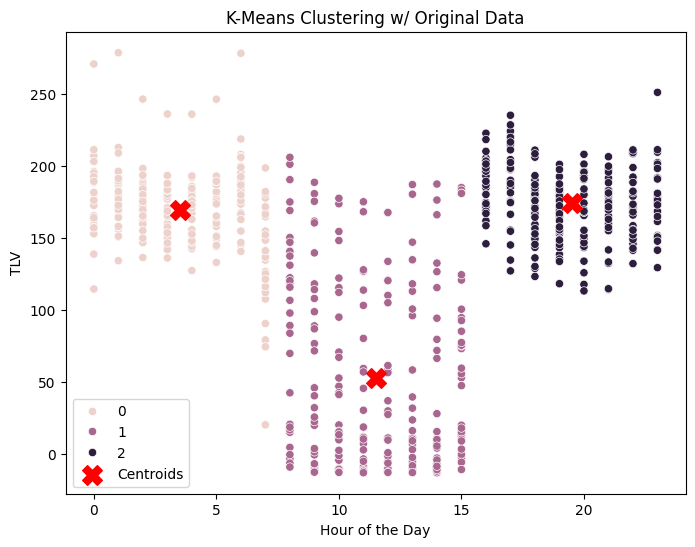

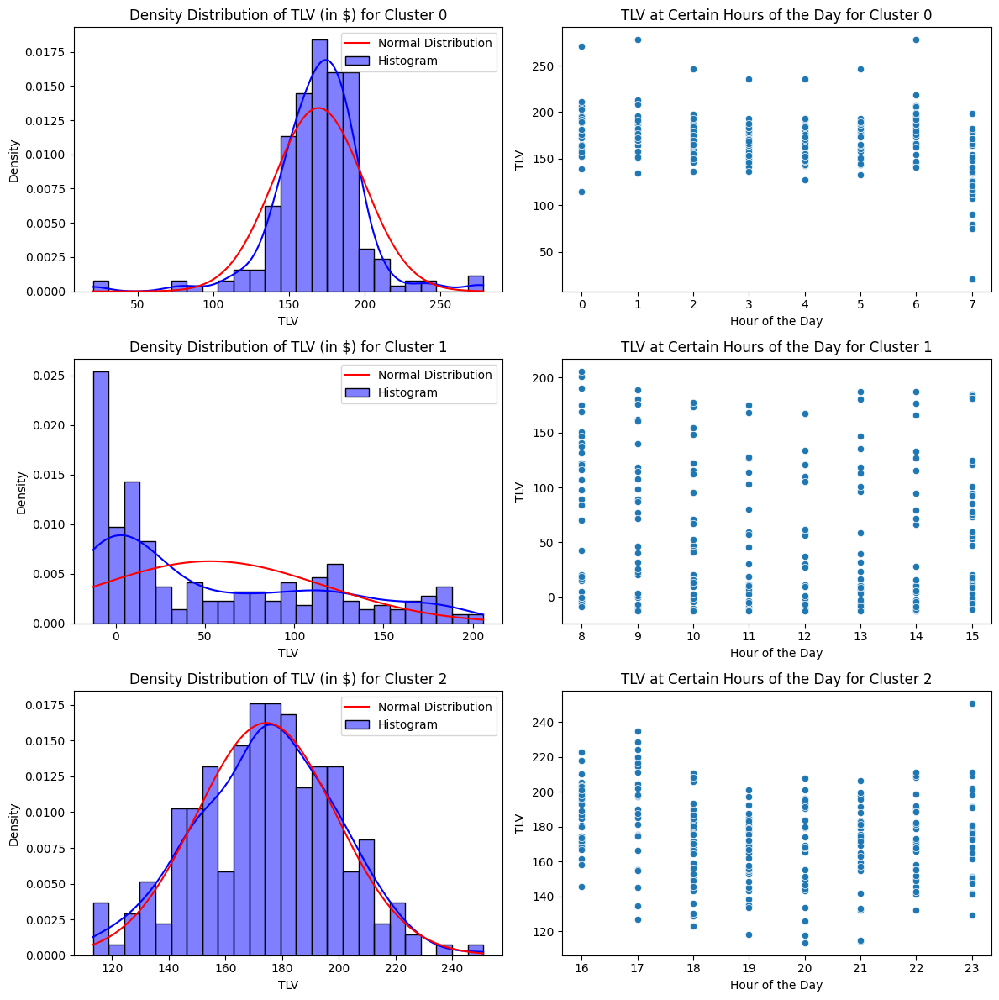

cluster weights:  {np.int64(0): array([180.90055675,  -3.26819384]), np.int64(1): array([99.95634457, -4.07614193]), np.int64(2): array([208.92293844,  -1.77219084])}
cluster square loss risk:  42.31223834750566


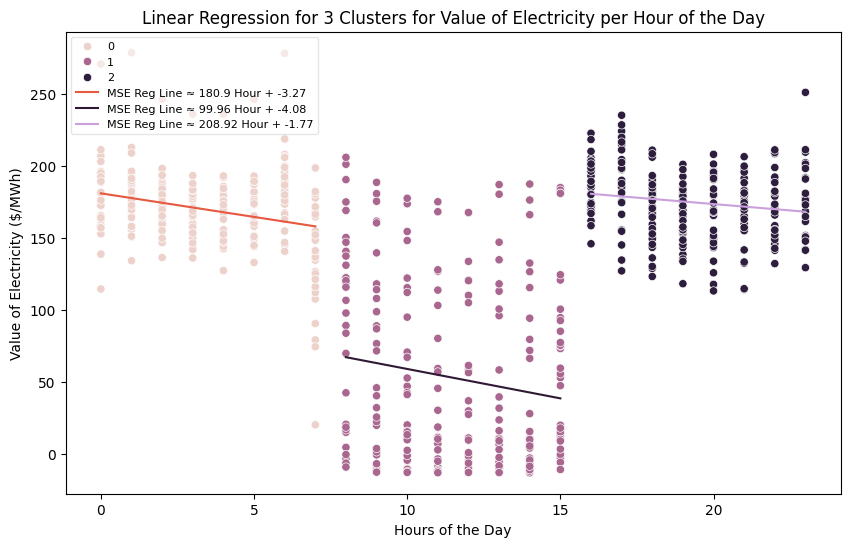

empirical risk:  42.31223834750566


In [123]:
linear_cluster_analysis(dec_temporal_melted, month)

sigma:  2.3
weight vector:  [154.29280672  75.43633719 144.92903648  54.65592162  32.00019745
  -4.10215007  70.67978853 148.79035724  67.48645949 156.01285388]
risk w.r.t. RMSE:  43.05606653083945


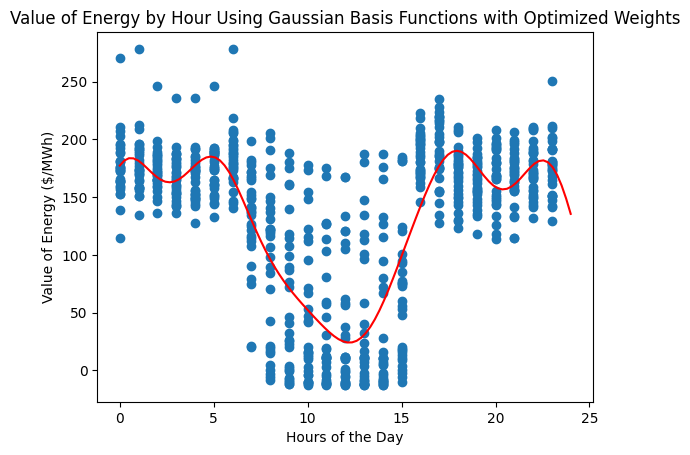

In [124]:
gaussian_basis(x,y, month)

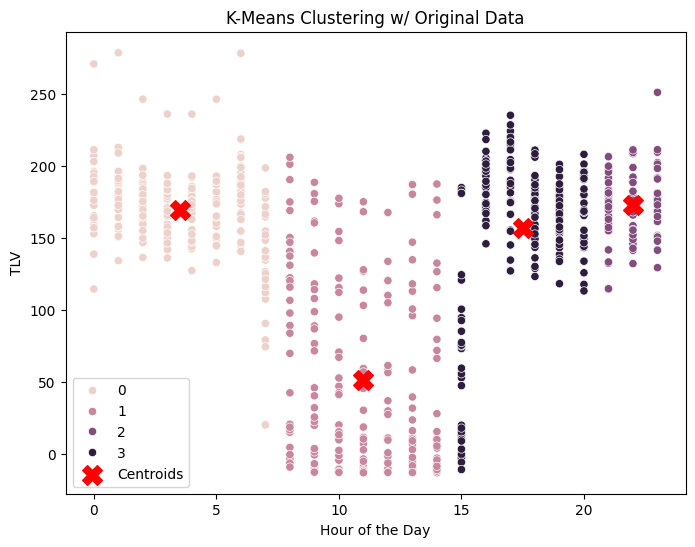

sigma:  1.25
weight vector:  [ 44.91616442 182.39695603 102.21553575 151.85935941]


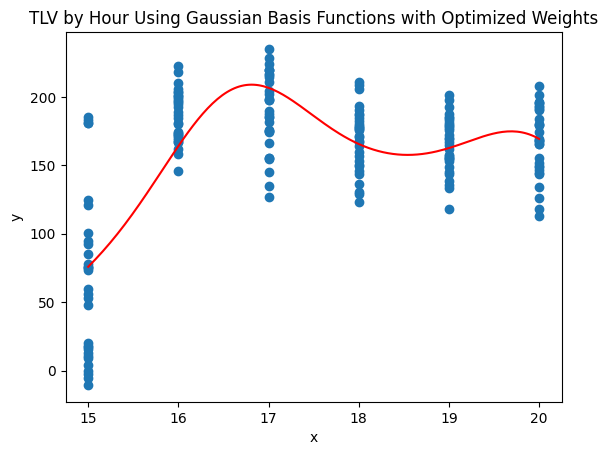

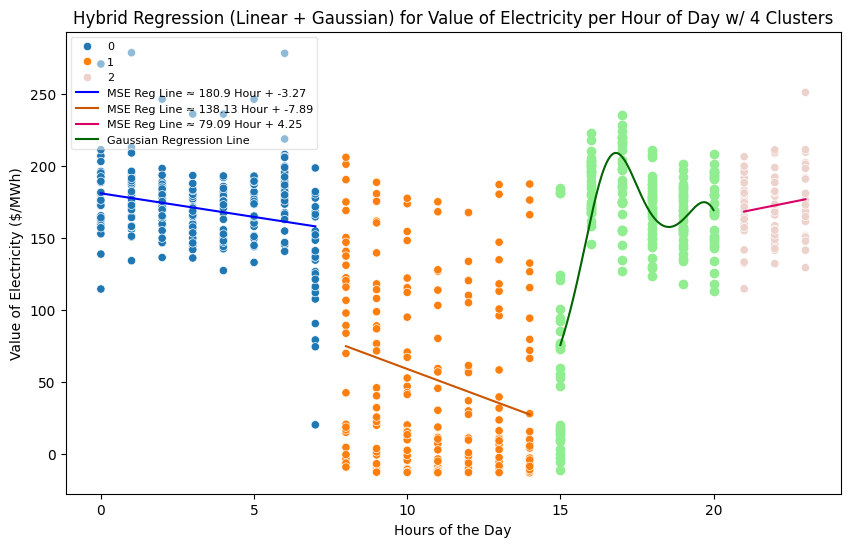

RMSE:  41.93764913048029


In [125]:
reg_errors.loc['December', 'Linear+Gaussian+Cluster '] = linear_cluster_gaussian('December', 2024)

In [126]:
reg_errors

,Linear,KNN,Linear+Cluster,Gaussian Basis,Linear+Gaussian+Cluster
January,67.085515,29.332051,31.686737,31.911611,29.793676
February,78.235041,37.603173,38.985567,36.051992,34.914149
March,75.637477,33.076676,40.854265,32.398047,34.557976
April,65.710803,32.251309,45.226873,35.307078,36.474276
May,66.339201,34.452376,42.806009,33.541146,33.810214
June,69.154523,27.445775,40.48111,29.798925,31.923521
July,316.695965,417.231564,303.265119,NaN,NaN
August,564.589201,511.942825,NaN,496.035433,491.987883
September,346.801031,485.61098,NaN,323.48929,322.777947
October,242.465786,324.343023,NaN,226.995475,226.144509


### Aggregated Non Outlier Graph

                         1           2           3           4           5   \
Hour of the Day                                                               
0                158.263401  170.023640  141.319609  141.402743  140.982940   
1                160.861692  169.541531  153.570537  136.841946  152.154882   
2                162.374515  165.715428  162.096254  156.068726  158.698584   
3                154.143733  170.089466  154.499523  145.351794  152.885469   
4                149.160847  164.458303  129.495874  133.541246  152.418174   

                         6           7           8           9           10  \
Hour of the Day                                                               
0                150.693574  174.528927  133.891334  148.970532  153.853019   
1                159.818948  173.534080  142.430582  155.441064  164.991013   
2                162.245973  165.032525  156.476279  166.744856  162.132677   
3                154.959695  173.391648  161.733376

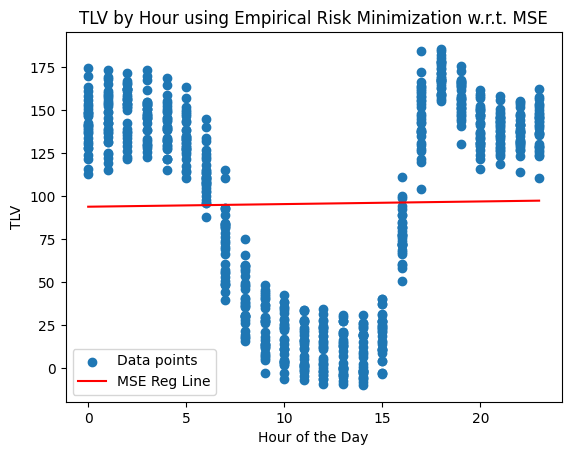

In [128]:
month = "Non Outlier"
non_outlier_data = load_dataset(month, 2024)[2]
non_outlier_temporal_melted = load_dataset(month, 2024)[3]

x = load_dataset(month, 2024)[0]
y = load_dataset(month, 2024)[1]
print(non_outlier_data.head())

x_matrix = lin_reg(x, y, month)

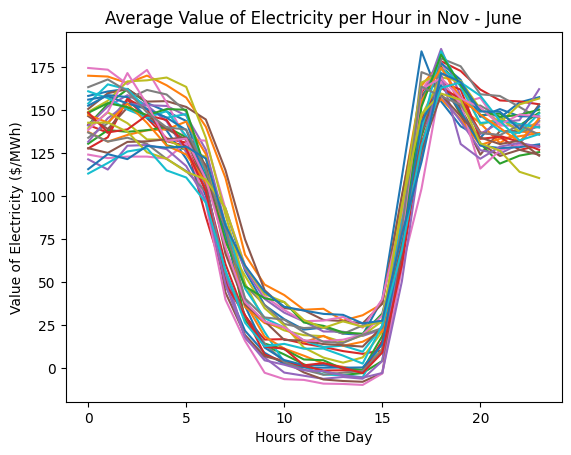

In [140]:
for i in non_outlier_data.columns:
    x = non_outlier_data.index
    y = non_outlier_data[i]
    plt.plot(x, y)

plt.title('Average Value of Electricity per Hour in Nov - June')
plt.xlabel('Hours of the Day')
plt.ylabel('Value of Electricity ($/MWh)')
plt.show()


### Aggregated Outlier Graphs

                         1           2           3           4           5   \
Hour of the Day                                                               
0                163.550456  188.313140  168.712880  174.718845  180.708078   
1                169.080818  168.292447  178.884804  174.133217  174.509880   
2                173.627780  171.673991  170.418636  166.747230  157.589648   
3                172.788252  173.146947  168.744605  168.275264  164.576668   
4                158.572347  161.418153  165.138233  160.771522  165.815769   

                         6           7           8           9           10  \
Hour of the Day                                                               
0                185.173957  173.299485  186.373101  153.184713  163.066082   
1                171.403937  169.084944  179.909874  159.424868  175.362435   
2                162.797494  157.051927  164.382985  175.701115  175.135349   
3                165.770702  159.013764  160.050112

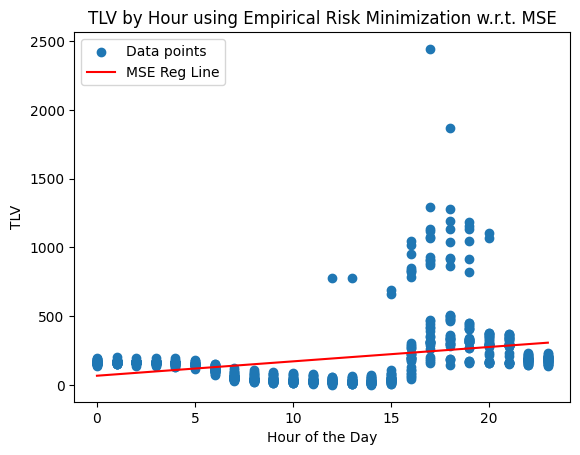

In [130]:
month = "Outlier"
outlier_data = load_dataset(month, 2024)[2]
outlier_temporal_melted = load_dataset(month, 2024)[3]

x = load_dataset(month, 2024)[0]
y = load_dataset(month, 2024)[1]
print(outlier_data.head())

x_matrix = lin_reg(x, y, month)

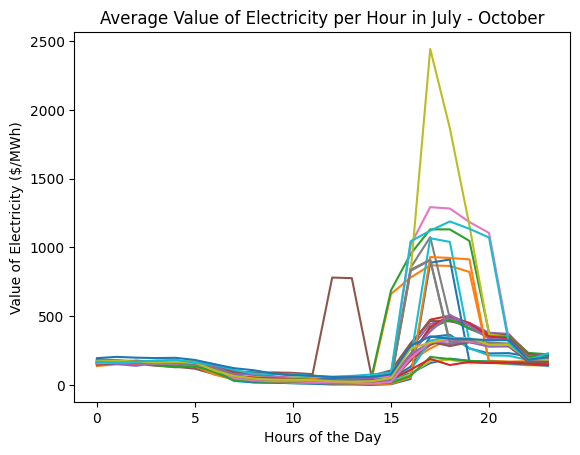

In [141]:
for i in outlier_data.columns:
    x = outlier_data.index
    y = outlier_data[i]
    plt.plot(x, y)

plt.title('Average Value of Electricity per Hour in July - October')
plt.xlabel('Hours of the Day')
plt.ylabel('Value of Electricity ($/MWh)')
plt.show()


### August Line Graph Visualizations

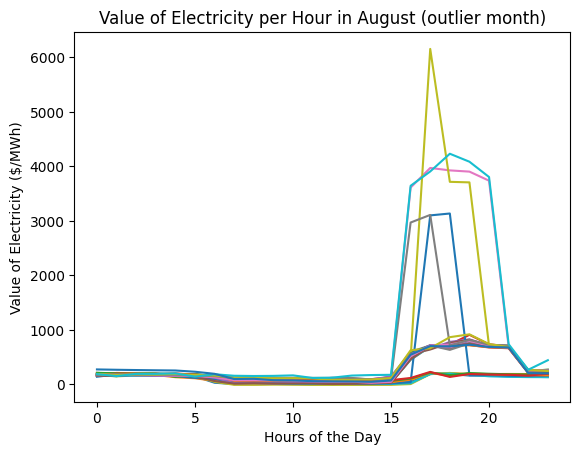

In [144]:
for i in outlier_data.columns:
    x = aug_data.index
    y = aug_data[i]
    plt.plot(x, y)

plt.title('Value of Electricity per Hour in August (outlier month)')
plt.xlabel('Hours of the Day')
plt.ylabel('Value of Electricity ($/MWh)')
plt.show()


                         1           2           3           4           5   \
Hour of the Day                                                               
0                162.389999  186.035493  180.888394  156.533368  180.163220   
1                150.043174  154.448210  192.697958  156.489351  191.859030   
2                195.088979  188.584588  197.442926  179.196227  177.797435   
3                199.378064  195.258719  200.088788  180.436985  173.847635   
4                147.999420  161.202769  188.673417  181.988669  176.041974   

                         6           7           8           9           10  \
Hour of the Day                                                               
0                209.419587  194.425500  191.070416  168.749420  149.696878   
1                193.003510  195.738038  197.365560  146.536435  159.378400   
2                190.148269  169.625873  185.273512  162.083003  191.856348   
3                186.900824  195.748018  177.961677

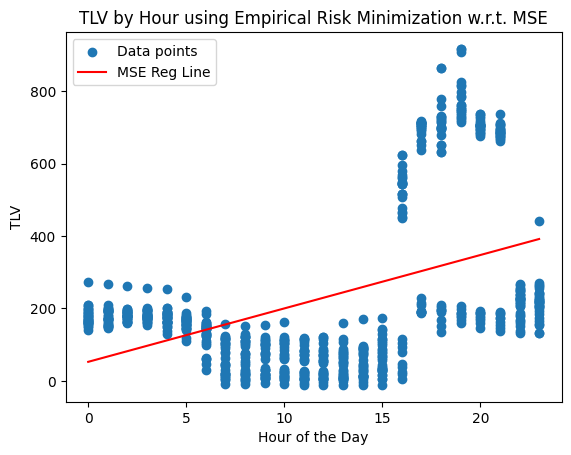

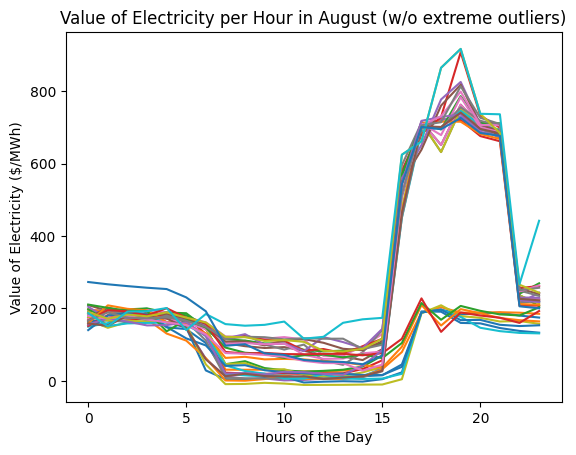

In [146]:
month = "Cleaned August"
cleaned_aug_data = load_dataset(month, 2024)[2]
outlier_temporal_melted = load_dataset(month, 2024)[3]

x = load_dataset(month, 2024)[0]
y = load_dataset(month, 2024)[1]
print(cleaned_aug_data.head())

x_matrix = lin_reg(x, y, month)

for i in outlier_data.columns:
    x = cleaned_aug_data.index
    y = cleaned_aug_data[i]
    plt.plot(x, y)

plt.title('Value of Electricity per Hour in August (w/o extreme outliers)')
plt.xlabel('Hours of the Day')
plt.ylabel('Value of Electricity ($/MWh)')
plt.show()


                         1           2           3           4           5   \
Hour of the Day                                                               
0                162.389999  186.035493  180.888394  156.533368  180.163220   
1                150.043174  154.448210  192.697958  156.489351  191.859030   
2                195.088979  188.584588  197.442926  179.196227  177.797435   
3                199.378064  195.258719  200.088788  180.436985  173.847635   
4                147.999420  161.202769  188.673417  181.988669  176.041974   

                         6           7           8           9           10  \
Hour of the Day                                                               
0                209.419587  194.425500  191.070416  168.749420  149.696878   
1                193.003510  195.738038  197.365560  146.536435  159.378400   
2                190.148269  169.625873  185.273512  162.083003  191.856348   
3                186.900824  195.748018  177.961677

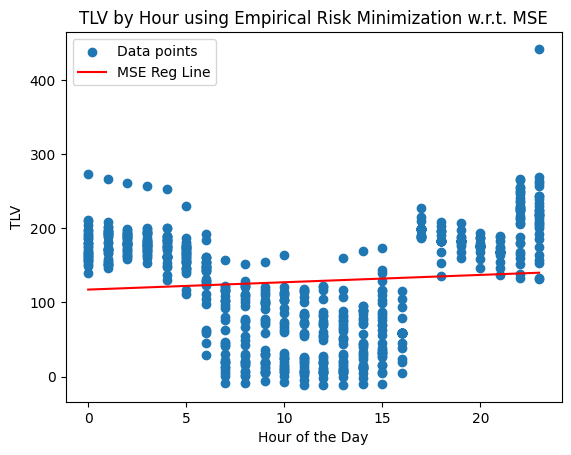

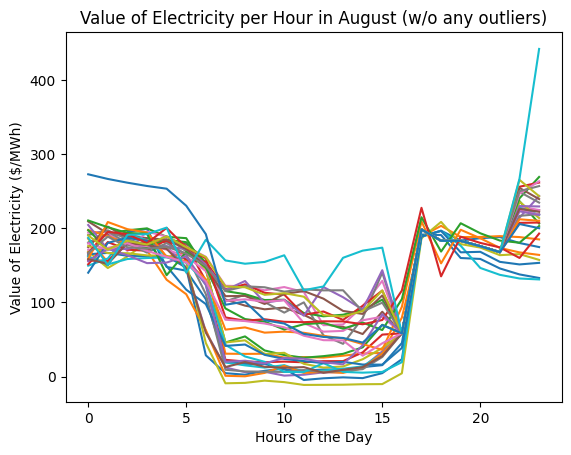

In [147]:
month = "Cleaned August 2.0"
cleaned_aug_2_data = load_dataset(month, 2024)[2]
outlier_temporal_melted = load_dataset(month, 2024)[3]

x = load_dataset(month, 2024)[0]
y = load_dataset(month, 2024)[1]
print(cleaned_aug_2_data.head())

x_matrix = lin_reg(x, y, month)

for i in outlier_data.columns:
    x = cleaned_aug_2_data.index
    y = cleaned_aug_2_data[i]
    plt.plot(x, y)

plt.title('Value of Electricity per Hour in August (w/o any outliers)')
plt.xlabel('Hours of the Day')
plt.ylabel('Value of Electricity ($/MWh)')
plt.show()
